<div class="alert alert-block alert-info">
<center> <h1> Master in Data Science and Advanced Analytics </h1> </center> <br>
<center> PROJECT 2022/2023 </center>

# Data Mining - A2Z Insurance
*Group Members*:

|      |           Student Name        |    Student ID | 
|---   |               ---             |      ---      |
| 1    |Bruna Barbosa Vieira de Almeida Duarte                 |   20210669   | 
| 2    |Mohamed Ettaher Ben Slama   |    20221039   |  
| 3    |Skander Chaabini                 |    20221041  | 

# Table of Contents

* [<font color='#E8800A'>1 - Business Understanding </font>](#first-bullet) <br>
* [<font color='#E8800A'>2 - Data Integration </font>](#second-bullet) <br>
    - [2.1. Libraries Import ](#2.1)<br>
    - [2.2. Data Import ](#2.2)<br>
* [<font color='#E8800A'>3 - Data Exploration </font>](#third-bullet) <br>
    - [3.1.Data fields ](#3.1)<br>
    - [3.2.Exploratory Data Analysis  ](#3.2) <br>
    - [3.3.Features Distributions  ](#3.3) <br>
    - [3.4.Coherence Check  ](#3.4) <br>
    - [3.5.Outliers Check  ](#3.5) <br>
* [<font color='#E8800A'>4 -Data Preprocessing</font>](#forth-bullet) <br>
    - 4.1.[Droping Impossible Values ](#4.1)<br>
    - 4.2.[Treating missing values ](#4.2)<br>
    - 4.3.[First Outliers Treatment ](#4.3)<br>
    - 4.4.[Feature engineering](#4.4)<br>
    - 4.5.[Feature Selection ](#4.5)<br>
    - 4.6.[Scaling ](#4.6)<br>
    - 4.7.[Second Outliers Treatment ](#4.7)<br>
* [<font color='#E8800A'>5 - Clustering</font>](#fifth-bullet) <br>
    - 5.1.[Kmeans Clustering  ](#5.1)<br>
    - 5.2.[K-means Clustering with Perspectives_](#5.2)<br>
    - 5.3.[Hierarchical clustering ](#5.3)<br>
    - 5.4.[DBSCAN clustering ](#5.4)<br>
    - 5.5.[Self Organizing Maps ](#5.5)<br>
        - 5.5.1.[K-Means on top of SOM units ](#5.5.1)<br>
        - 5.5.2.[Hierarchical Clustering on top of SOM units ](#5.5.2)<br>
    - 5.6.[K-Means Hierarchical Hybrid ](#5.6)<br>
    - 5.7.[Gaussian Mixture Model ](#5.7)<br>
    - 5.4.[K-prototype ](#5.4)<br>
     
* [<font color='#E8800A'>6 - Clusters Analysis & Profiling </font>](#sixth-bullet) <br>
    - 6.1.[t-SNE Visualization ](#6.1)<br>
    - 6.2.[UMAP Visualization ](#6.2)<br>
    - 6.3.[Decision Tree: Assess the accuracy & Visualize ](#6.3)<br>
    - 6.4.[Cluster Profiling ](#6.4)<br>

<a class="anchor" id="first-bullet">     

# 1. Business Understanding

A2Z Insurance is a Portuguese insurance company that has been in operation for a long time and offers a variety of insurance services, including motor, household, health, life, and workers' compensation insurance. While A2Z primarily serves Portuguese customers, a significant portion of its new customers come from its website. Customers can sign up for A2Z's services at their branches, by phone, or through the company's website.  
  
Acquiring new customers is essential for any industry. The process of finding new customers starts by gaining as much insight as possible from current customers. By understanding the needs and preferences of current customers, businesses can identify groups of customers with different product interests, different market participation, or different responses to marketing efforts. This helps organizations not only serve their current customers better, but also improve their targeting of potential customers.  
  
The objective of this project is to segment the database and find the relevant clusters of customers. In order to achieve this, we will suggest and apply different approaches and techniques to segment the customers, as well as combine and analyze the results. At the end we will provide explanations to the values and demographics of each customer segment, and understand which types of insurance they will be more interested to purchase.

<a class="anchor" id="second-bullet">     

# 2. Data Integration

## 2.1  Libraries Import <a class="anchor" id="2.1"></a>

In [522]:
import pyreadstat
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil
from sklearn.impute import KNNImputer
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import LocalOutlierFactor
import warnings
warnings.filterwarnings("ignore")
from sklearn.preprocessing import PowerTransformer
import statsmodels.api as sm
from scipy import stats
from sklearn.preprocessing import  OneHotEncoder
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import KMeans

from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram

from sklearn.neighbors import NearestNeighbors
from sklearn.mixture import GaussianMixture
from sklearn.cluster import MeanShift, DBSCAN, estimate_bandwidth

import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView

from matplotlib.patches import RegularPolygon, Ellipse
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import cm, colorbar
from matplotlib import colors as mpl_colors

from matplotlib.lines import Line2D
from matplotlib import __version__ as mplver
from matplotlib.contour import QuadContourSet

from kmodes.kprototypes import KPrototypes
from plotnine import *
import plotnine

import os
os.environ["PATH"] += os.pathsep + 'D:/Program Files (x86)/Graphviz2.38/bin/'
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split
from sklearn import tree

from sklearn.manifold import TSNE
import umap

## 2.2 Data Import <a class="anchor" id="2.2"></a>

In [523]:
# Read the SAS database file
df, meta = pyreadstat.read_sas7bdat('a2z_insurance.sas7bdat')

In [524]:
type(df)

pandas.core.frame.DataFrame

In [525]:
type(meta)

pyreadstat._readstat_parser.metadata_container

In [526]:
df

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
0,1.0,1985.0,1982.0,2 - High School,2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
1,2.0,1981.0,1995.0,2 - High School,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
2,3.0,1991.0,1970.0,1 - Basic,2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
3,4.0,1990.0,1981.0,3 - BSc/MSc,1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
4,5.0,1986.0,1973.0,3 - BSc/MSc,1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10291,10292.0,1984.0,1949.0,4 - PhD,3188.0,2.0,0.0,-0.11,0.96,393.74,49.45,173.81,9.78,14.78
10292,10293.0,1977.0,1952.0,1 - Basic,2431.0,3.0,0.0,1405.60,0.00,133.58,1035.75,143.25,12.89,105.13
10293,10294.0,1994.0,1976.0,3 - BSc/MSc,2918.0,1.0,1.0,524.10,0.21,403.63,132.80,142.25,12.67,4.89
10294,10295.0,1981.0,1977.0,1 - Basic,1971.0,2.0,1.0,250.05,0.65,188.59,211.15,198.37,63.90,112.91


<a class="anchor" id="third-bullet">     

# 3. Data exploration

##  3.1. Data fields <a class="anchor" id="3.1"></a>

CustID - Customer ID  
FirstPolYear - Year of the customer’s first policy  
BirthYear - Customer’s Birthday Year  
EducDeg - Academic Degree  
MonthSal - Gross monthly salary (€)  
GeoLivArea - Living area  
Children - Binary variable (Y=1)  
CustMonVal - Customer Monetary Value (Lifetime value)  
ClaimsRate - Amount paid by the insurance company (€)/ Premiums (€), in the last 2 years  
PremMotor - Premiums (€) in LOB: Motor  
PremHousehold - Premiums (€) in LOB: Household  
PremHealth - Premiums (€) in LOB: Health  
PremLife - Premiums (€) in LOB: Life  
PremWork - Premiums (€) in LOB: Work Compensations  

## 3.2. Exploratory Data Analysis <a class="anchor" id="3.2"></a>

In [527]:
# Print how many observations and features are in the dataset
print('There are {} observations and {} features in the dataset'.format(df.shape[0], df.shape[1]))

There are 10296 observations and 14 features in the dataset


<font color=darkblue> PS: It was noticed that there are 10296 observations in the dataset, while in the project description it is mentioned that the dataset has 10290 observations. This will be checked in the coherence check, although it is most probably a typo in the project description. </font>

In [528]:
# Presenting all the columns in the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10296 entries, 0 to 10295
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CustID         10296 non-null  float64
 1   FirstPolYear   10266 non-null  float64
 2   BirthYear      10279 non-null  float64
 3   EducDeg        10296 non-null  object 
 4   MonthSal       10260 non-null  float64
 5   GeoLivArea     10295 non-null  float64
 6   Children       10275 non-null  float64
 7   CustMonVal     10296 non-null  float64
 8   ClaimsRate     10296 non-null  float64
 9   PremMotor      10262 non-null  float64
 10  PremHousehold  10296 non-null  float64
 11  PremHealth     10253 non-null  float64
 12  PremLife       10192 non-null  float64
 13  PremWork       10210 non-null  float64
dtypes: float64(13), object(1)
memory usage: 1.1+ MB


In [529]:
# Describing the metric features in the dataset
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CustID,10296.0,5148.500000,2972.343520,1.00,2574.75,5148.50,7722.2500,10296.00
FirstPolYear,10266.0,1991.062634,511.267913,1974.00,1980.00,1986.00,1992.0000,53784.00
BirthYear,10279.0,1968.007783,19.709476,1028.00,1953.00,1968.00,1983.0000,2001.00
MonthSal,10260.0,2506.667057,1157.449634,333.00,1706.00,2501.50,3290.2500,55215.00
GeoLivArea,10295.0,2.709859,1.266291,1.00,1.00,3.00,4.0000,4.00
Children,10275.0,0.706764,0.455268,0.00,0.00,1.00,1.0000,1.00
CustMonVal,10296.0,177.892605,1945.811505,-165680.42,-9.44,186.87,399.7775,11875.89
ClaimsRate,10296.0,0.742772,2.916964,0.00,0.39,0.72,0.9800,256.20
PremMotor,10262.0,300.470252,211.914997,-4.11,190.59,298.61,408.3000,11604.42
PremHousehold,10296.0,210.431192,352.595984,-75.00,49.45,132.80,290.0500,25048.80


In [530]:
#Check for missing values
df.isnull().sum()

CustID             0
FirstPolYear      30
BirthYear         17
EducDeg            0
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        43
PremLife         104
PremWork          86
dtype: int64

In [531]:
# Find out if there are any missing values in the training data
duplicates= df.duplicated().sum()
if duplicates > 0:
    print('There are', duplicates, 'duplicated data in the training data')
else:
    print('There are no duplicated data in the training data')

There are no duplicated data in the training data


## 3.3 Features Distributions <a class="anchor" id="3.3"></a>

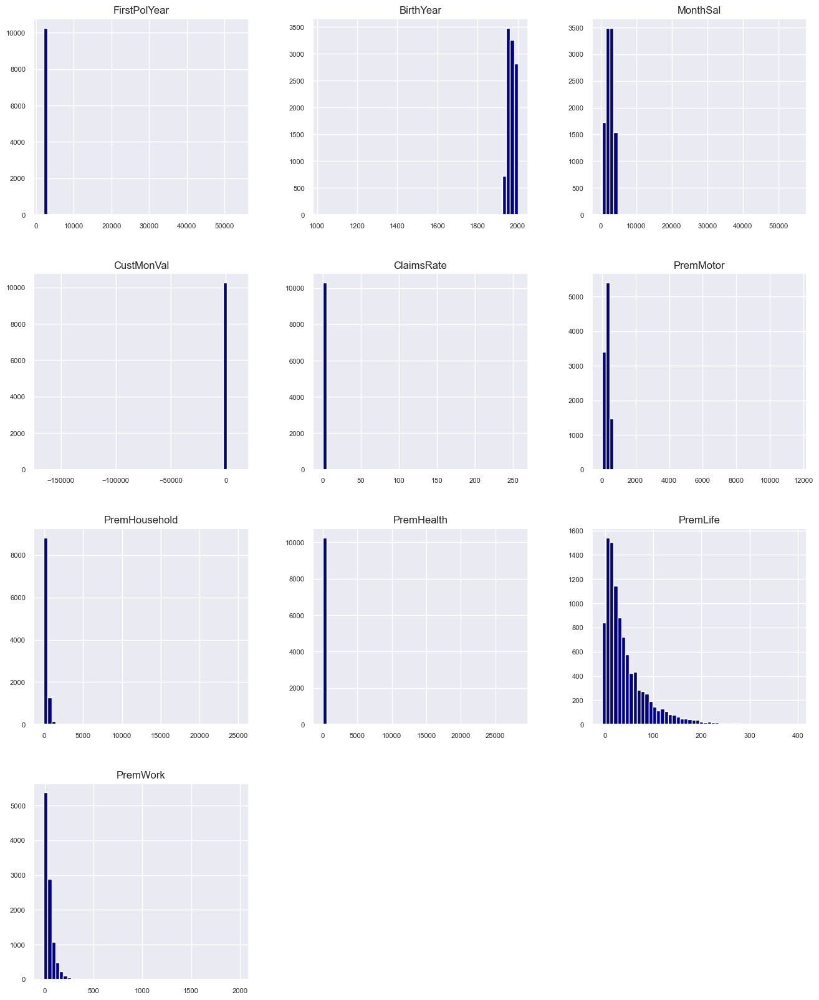

In [532]:
# Check the distribution of the metric features with histogram plots
metric_feature=["FirstPolYear", "BirthYear", "MonthSal","CustMonVal","ClaimsRate","PremMotor","PremHousehold","PremHealth","PremLife","PremWork"]
metric_features= df[["FirstPolYear", "BirthYear", "MonthSal","CustMonVal","ClaimsRate","PremMotor","PremHousehold","PremHealth","PremLife","PremWork"]]
metric_features.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8, color="darkblue");

|                 |   EducDeg |
|:----------------|----------:|
| 3 - BSc/MSc     |      4799 |
| 2 - High School |      3510 |
| 1 - Basic       |      1272 |
| 4 - PhD         |       698 |
|                 |        17 |


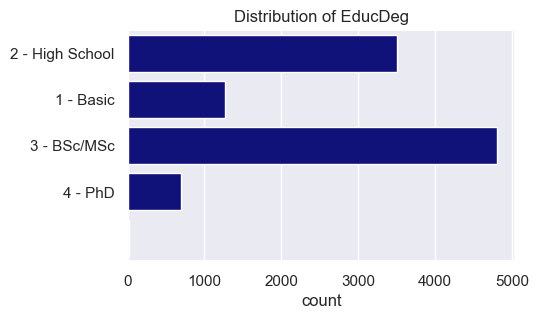

---------------------------------------------------------------------------------------------
|    |   GeoLivArea |
|---:|-------------:|
|  4 |         4145 |
|  1 |         3048 |
|  3 |         2066 |
|  2 |         1036 |


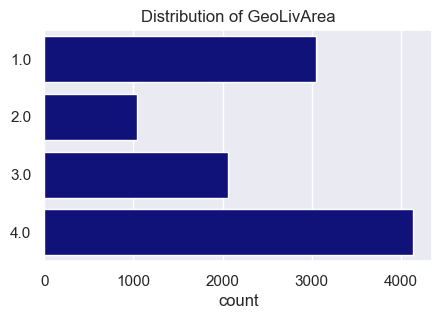

---------------------------------------------------------------------------------------------
|    |   Children |
|---:|-----------:|
|  1 |       7262 |
|  0 |       3013 |


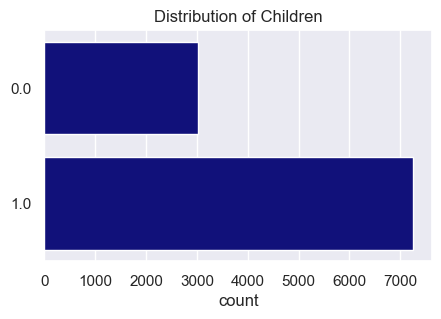

---------------------------------------------------------------------------------------------


In [533]:
# Check the distribution of the categorical features with count plots
categorical_features= df[["EducDeg", "GeoLivArea", "Children"]]
categorical_feature=["EducDeg", "GeoLivArea", "Children"]
for col in categorical_features:
    print(categorical_features[col].value_counts().to_markdown())
    plt.figure(figsize=(5,3))
    plt.title('Distribution of {}'.format(col))
    sns.countplot(y = col, data = categorical_features, color="darkblue")
    plt.ylabel('')
    plt.show()
    print('---------------------------------------------------------------------------------------------')

## 3.4. Coherence check <a class="anchor" id="3.4"></a>

In [534]:
df.loc[df["FirstPolYear"]>2016] 

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
9294,9295.0,53784.0,1948.0,3 - BSc/MSc,3268.0,1.0,0.0,348.85,0.37,351.4,15.0,187.37,22.45,17.78


There are 17 values in EducDeg that are empty but not considered as missing values. We will transform them into NULL.

In [535]:
df.loc[df["BirthYear"]<1900] #drop this outlier

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
7195,7196.0,1993.0,1028.0,3 - BSc/MSc,2830.0,4.0,0.0,146.02,0.77,428.97,192.8,108.91,1.89,23.67


In [536]:
minors= df.loc[df["BirthYear"]>1998]
minors

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
13,14.0,1983.0,2000.0,1 - Basic,1043.0,3.0,1.0,-75.12,1.06,44.34,342.85,127.69,267.94,94.46
186,187.0,1993.0,1999.0,1 - Basic,1247.0,2.0,1.0,-128.24,1.07,33.23,1026.30,82.57,75.68,212.15
397,398.0,1986.0,2000.0,1 - Basic,415.0,1.0,1.0,-218.48,1.22,52.01,348.40,49.01,193.48,225.82
480,481.0,1984.0,1999.0,1 - Basic,1581.0,4.0,1.0,866.27,0.21,30.34,683.45,98.13,71.68,249.16
526,527.0,1982.0,1999.0,1 - Basic,840.0,4.0,1.0,-23.54,1.00,132.69,165.60,137.36,129.69,164.14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9936,9937.0,1989.0,1999.0,1 - Basic,918.0,3.0,1.0,738.24,0.20,29.45,457.85,117.69,275.94,78.35
9947,9948.0,1987.0,2000.0,1 - Basic,422.0,1.0,1.0,-145.58,1.07,36.23,1409.15,66.68,14.78,171.59
10043,10044.0,1983.0,1999.0,1 - Basic,1110.0,1.0,1.0,907.28,0.34,25.56,1011.85,120.80,144.25,105.13
10121,10122.0,1978.0,1999.0,1 - Basic,738.0,4.0,1.0,365.19,0.53,57.12,293.95,100.02,276.83,96.24


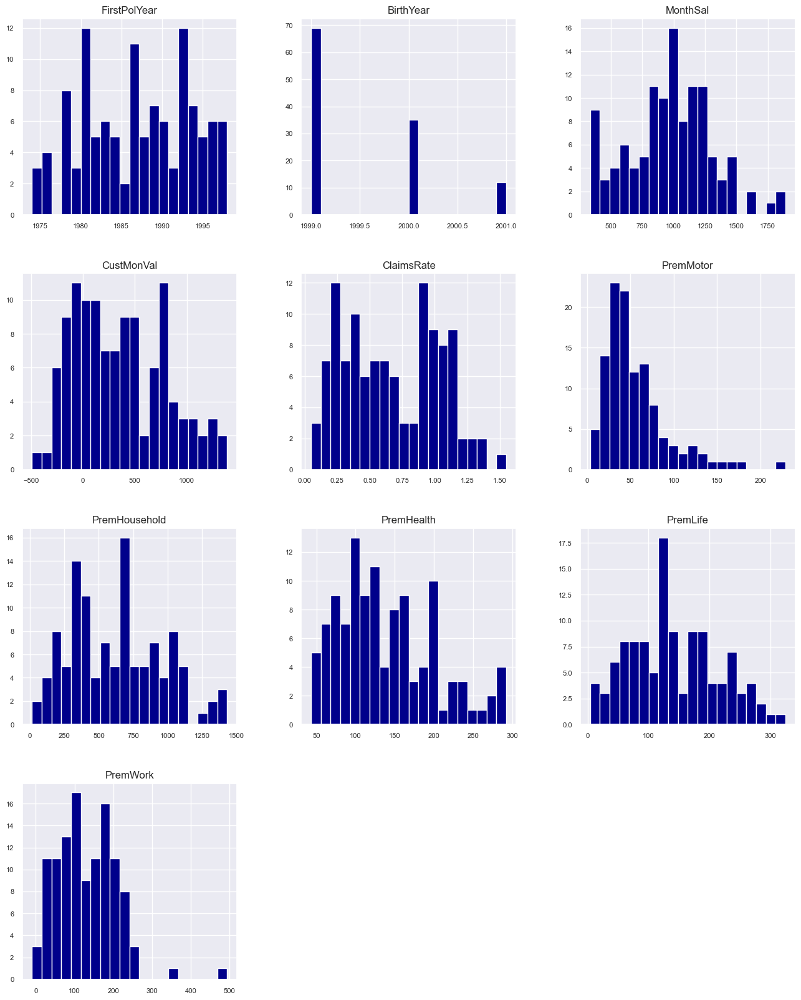

In [537]:
metric_features_minors= minors[["FirstPolYear", "BirthYear", "MonthSal","CustMonVal","ClaimsRate","PremMotor","PremHousehold","PremHealth","PremLife","PremWork"]]
metric_features_minors.hist(figsize=(16, 20), bins=20, xlabelsize=8, ylabelsize=8, color="darkblue");

|           |   EducDeg |
|:----------|----------:|
| 1 - Basic |       116 |


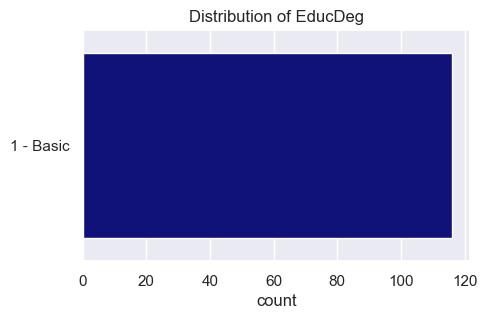

---------------------------------------------------------------------------------------------
|    |   GeoLivArea |
|---:|-------------:|
|  4 |           54 |
|  1 |           28 |
|  3 |           27 |
|  2 |            7 |


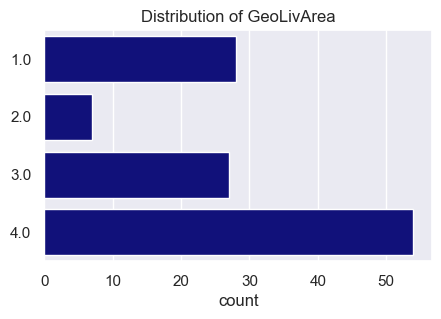

---------------------------------------------------------------------------------------------
|    |   Children |
|---:|-----------:|
|  1 |         87 |
|  0 |         29 |


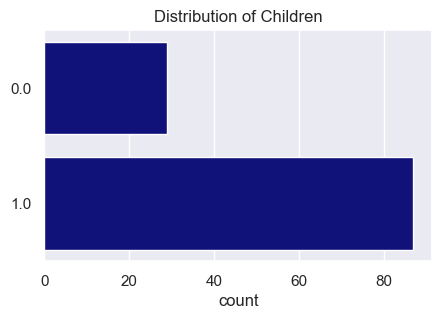

---------------------------------------------------------------------------------------------


In [538]:
categorical_features= minors[["EducDeg", "GeoLivArea", "Children"]]

for col in categorical_features:
    print(categorical_features[col].value_counts().to_markdown())
    plt.figure(figsize=(5,3))
    plt.title('Distribution of {}'.format(col))
    sns.countplot(y = col, data = categorical_features, color="darkblue")
    plt.ylabel('')
    plt.show()
    print('---------------------------------------------------------------------------------------------')

<font color=darkblue> The legal age to have an insurance in Portugal is 18. However someone who is 16 or 17 can have an insurance with parental approval as they can also marry and drive motocycles at this age with the approval of parents.  
To confirm that these individuals are coherent, we checked their distribution with other variables, the maximum birth year is 2001 thus the minimum age is 16, the education is 'basic' for all of them which is logical (No BSc/MSc or PhD found), and the majority of them have children which is a strong motivation to have an insurance. </font>

In [539]:
df.loc[df["FirstPolYear"]<df["BirthYear"]] #not logical

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
1,2.0,1981.0,1995.0,2 - High School,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
13,14.0,1983.0,2000.0,1 - Basic,1043.0,3.0,1.0,-75.12,1.06,44.34,342.85,127.69,267.94,94.46
18,19.0,1981.0,1982.0,1 - Basic,1414.0,3.0,1.0,230.38,0.71,313.17,373.40,121.80,14.78,72.57
22,23.0,1976.0,1986.0,2 - High School,1495.0,1.0,1.0,-89.79,1.08,209.04,308.95,192.48,64.79,54.90
40,41.0,1994.0,1995.0,2 - High School,1177.0,4.0,1.0,121.36,0.84,52.01,455.65,135.47,146.36,148.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10268,10269.0,1987.0,1988.0,3 - BSc/MSc,1414.0,3.0,1.0,50.46,0.90,129.58,167.80,184.48,165.92,75.46
10273,10274.0,1989.0,1992.0,2 - High School,1035.0,1.0,1.0,293.51,0.58,235.71,195.60,103.13,170.92,58.12
10284,10285.0,1980.0,1987.0,3 - BSc/MSc,1504.0,4.0,1.0,-1.55,0.96,390.63,29.45,179.70,-6.00,NaN
10288,10289.0,1982.0,1993.0,2 - High School,1465.0,1.0,1.0,795.15,0.35,67.79,820.15,102.13,182.48,86.46


<font color=darkblue> 1997 observations have a BirthYear bigger than FirstPolYear, meaning the person became a customer before being born. This is illogical and it is also illogical to have this same data entry mistake in around 20% of the data which can't be dropped from the dataset as it will significantly reduce the data size. </font>

<font color=darkblue> It was necessary to find a solution to deal with this issue:  
Several hypothesis were discussed :  
1- The insurance is passed from parent to child  ,This hypothesis was rejected because it was not legal to do so   
2- The birth date and the firstpolyeear values were switched ,Also this hypothesis was rejected becauese we notised that in some   cases that the difference between the values is less than a year which is illogical too    
So it was decided to search if there is a variable that is highly corelated with it so we can keep only one .  
The problematic records will be kept for now utill we investigate the corelation matrix in the feature selection phase 
</font>

In [540]:
# Find out if there is duplicated IDs in the dataset
if df.CustID.is_unique == True:
    print('CustID is unique in the dataset')
else:
    print('CustID is not unique in the dataset')

CustID is unique in the dataset


## 3.5. Outliers Check <a class="anchor" id="3.5"></a>

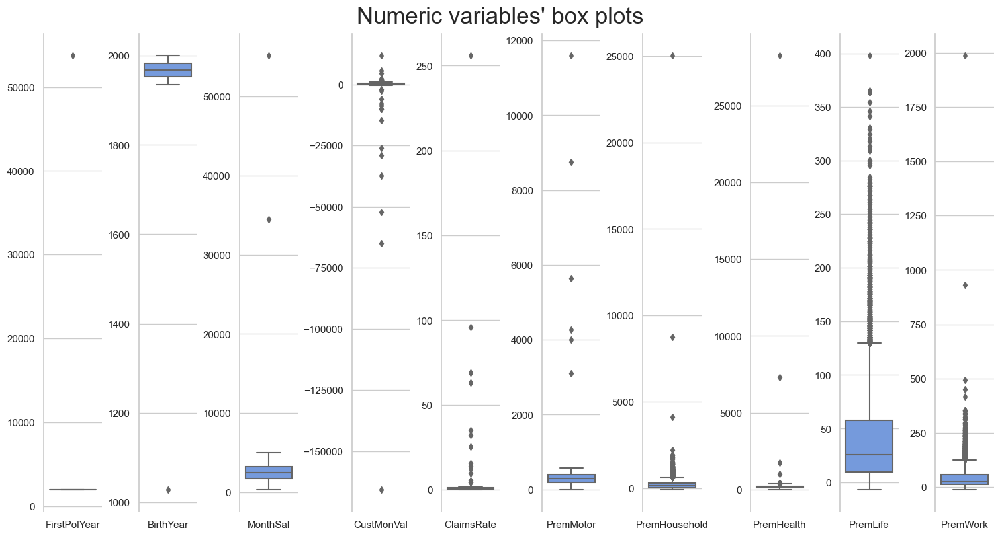

In [541]:
# Box plots for the numeric variables
sns.set(style="whitegrid")

data = pd.melt(metric_features)
plot_features = metric_features.columns

#Prepare figure layout
fig, axes = plt.subplots(1, len(plot_features), figsize=(15,8), constrained_layout=True)
    
# Draw the boxplots
for i in zip(axes, plot_features):
    sns.boxplot(x="variable", y="value", data=data.loc[data["variable"]==i[1]], ax=i[0], color='cornflowerblue')
    i[0].set_xlabel("")
    i[0].set_ylabel("")

# Finalize the plot
plt.suptitle("Numeric variables' box plots", fontsize=25)
sns.despine(bottom=True)

plt.show()


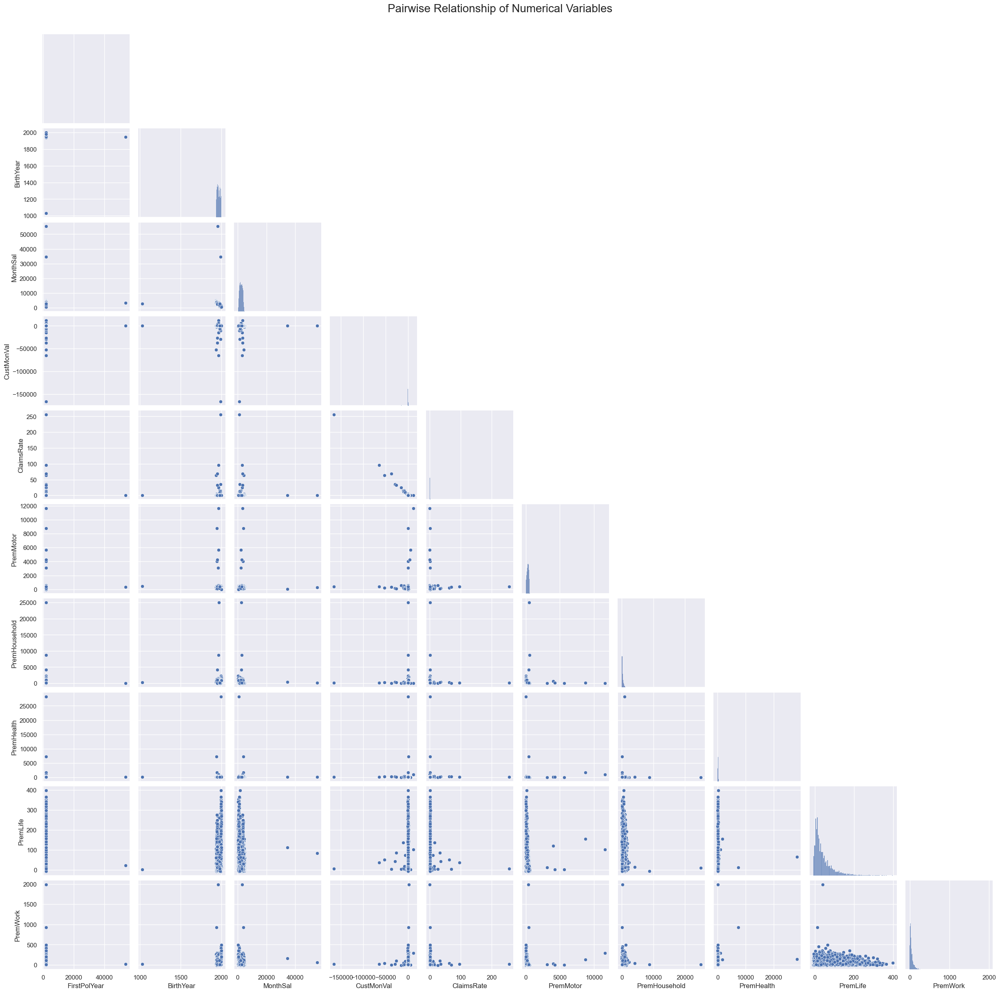

In [542]:
# Pairwise Relationship of Numerical Variables
sns.set()

# Setting pairplot
sns.pairplot(metric_features, diag_kind="hist", corner=True)

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

plt.show()



<font color=darkblue>
We can easily notice that we have several outliers in one dimention 
representation using the box plot 
and in the 2 dimentions using the Pairwise Relationship of Numerical Variables
</font>




<a class="anchor" id="forth-bullet">     

# 4. Data Preprocessing

##  4.1. Droping impossible values <a class="anchor" id="4.1"></a>

In [543]:
df= df[df['FirstPolYear'] != 53784] #drop the row with the wrong value

In [544]:
df= df[df['BirthYear'] != 1028]

##  4.2. Treating missing values <a class="anchor" id="4.2"></a>

In [545]:
df['CustID']= df['CustID'].astype(int)
df= df.set_index('CustID')
df

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
1,1985.0,1982.0,2 - High School,2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2,1981.0,1995.0,2 - High School,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3,1991.0,1970.0,1 - Basic,2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4,1990.0,1981.0,3 - BSc/MSc,1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5,1986.0,1973.0,3 - BSc/MSc,1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292,1984.0,1949.0,4 - PhD,3188.0,2.0,0.0,-0.11,0.96,393.74,49.45,173.81,9.78,14.78
10293,1977.0,1952.0,1 - Basic,2431.0,3.0,0.0,1405.60,0.00,133.58,1035.75,143.25,12.89,105.13
10294,1994.0,1976.0,3 - BSc/MSc,2918.0,1.0,1.0,524.10,0.21,403.63,132.80,142.25,12.67,4.89


<font color=darkblue>To avoid any unusual or blank values we will first replace any one of those values with nan<\font >

In [546]:
# Replace the strange characters by NaN
strange_values_list = ["!","$","%","?","*","+","_","@","€"," ","{", ""]
df.replace(strange_values_list,np.nan, inplace=True)
# count of missing values
df.isna().sum()

FirstPolYear      30
BirthYear         17
EducDeg           17
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        43
PremLife         104
PremWork          86
dtype: int64

<font color=darkblue>
We can notice that we have a lot of missing values in several variables .  

Obviously we can not deal with them the same way :

We can either drop the records containing missing values or keep them and fill the values if we keep them there are a lot of ways to fill a missing value </font >

<font color=darkblue>We will go variable by variable untill we find a solution for each missing value and we will start with premium variables since they will have a similar treatment 
Since the only prem variable without missing values is PremHousehold it was interesting to investigate its values again .</font >

### Premium Variables

In [547]:
df['PremHousehold'].value_counts()


 39.45      62
 0.00       60
-45.55      60
 19.45      60
-30.55      57
            ..
 627.35      1
 710.70      1
 908.50      1
 859.05      1
 1035.75     1
Name: PremHousehold, Length: 1061, dtype: int64

In [548]:
premium_var=['PremWork', 'PremLife', 'PremHealth', 'PremMotor']
for i in premium_var :
    print(df[i].value_counts())

 10.89     76
 9.89      72
 11.89     70
-5.11      68
-0.11      66
           ..
 141.14     1
 270.94     1
 312.95     1
 264.16     1
 201.26     1
Name: PremWork, Length: 898, dtype: int64
 9.89      130
 3.89      121
 0.89      119
-1.11      117
 12.89     109
          ... 
 215.93      1
 204.26      1
 245.38      1
 170.70      1
 270.83      1
Name: PremLife, Length: 611, dtype: int64
130.47    30
178.70    29
159.14    28
158.14    27
147.36    26
          ..
389.74     1
316.95     1
374.96     1
5.78       1
417.08     1
Name: PremHealth, Length: 1006, dtype: int64
398.74    17
361.29    16
246.49    16
206.15    15
279.61    15
          ..
173.92     1
25.45      1
546.66     1
564.44     1
6.89       1
Name: PremMotor, Length: 1950, dtype: int64


<font color=darkblue>After noticing that the only prem with values = 0 it can be concluded that those nan values should be changed by 0<font color=darkblue></font >

In [549]:
# Filling Premium variables missing values with 0
for i in premium_var:
    df[i]= df[i].fillna(0)

<font color=darkblue>It was necessary to check if there are clients with 0 in all premium types </font > 

In [550]:
df.loc[((df.PremLife==0)&
               (df.PremMotor==0)&
               (df.PremHousehold==0)&
               (df.PremHealth==0)&
               (df.PremWork==0))]
             

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
863,1987.0,1981.0,3 - BSc/MSc,2127.0,1.0,1.0,-25.0,0.0,0.0,0.0,0.0,0.0,0.0
1134,1974.0,1952.0,3 - BSc/MSc,3560.0,2.0,0.0,-25.0,0.0,0.0,0.0,0.0,0.0,0.0
3166,1995.0,1981.0,2 - High School,1813.0,4.0,1.0,-25.0,0.0,0.0,0.0,0.0,0.0,0.0
4023,1995.0,1988.0,3 - BSc/MSc,1296.0,3.0,1.0,-25.0,0.0,0.0,0.0,0.0,0.0,0.0
4114,1991.0,1993.0,2 - High School,1073.0,1.0,1.0,-25.0,0.0,0.0,0.0,0.0,0.0,0.0
4272,1983.0,1988.0,3 - BSc/MSc,1458.0,1.0,1.0,-25.0,0.0,0.0,0.0,0.0,0.0,0.0
5984,1986.0,1959.0,3 - BSc/MSc,2745.0,3.0,0.0,-25.0,0.0,0.0,0.0,0.0,0.0,0.0
6440,1991.0,1956.0,3 - BSc/MSc,2375.0,2.0,1.0,-25.0,0.0,0.0,0.0,0.0,0.0,0.0
6615,1995.0,1997.0,1 - Basic,1231.0,1.0,1.0,-25.0,0.0,0.0,0.0,0.0,0.0,0.0


<font color=darkblue>We Noticed something strange here in fact we have 12 records with 0 values in all premiums .  
Premium refers to the amount of money that an individual or business must pay for an insurance policy
and we have that all these values have -25 in customer monetary values .
Lifetime value = (annual profit from the customer) X (number of years that they are a customer)- (acquisition cost)
So it is clear that these customers have never got the insurance and they are not really clients of this insurance and -25 is obviously the acquisition cost.</font >

<font color=darkblue> Then We Wanted to check the records having -25 as custMonVal which is most propably the acquisation cost.</font >

In [551]:
df.loc[((df.CustMonVal==-25))]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
67,1984.0,1968.0,3 - BSc/MSc,2544.0,3.0,1.0,-25.0,1.0,366.07,78.35,165.81,16.56,7.89
73,1990.0,1951.0,3 - BSc/MSc,3206.0,4.0,1.0,-25.0,1.0,213.15,217.25,242.60,56.90,59.90
75,1985.0,1980.0,2 - High School,1440.0,1.0,1.0,-25.0,1.0,436.75,65.00,140.47,12.89,0.89
96,1976.0,1986.0,3 - BSc/MSc,2668.0,4.0,1.0,-25.0,1.0,296.50,70.00,200.15,60.79,8.67
103,1981.0,1980.0,2 - High School,2071.0,4.0,1.0,-25.0,1.0,190.59,317.85,188.37,6.89,118.58
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9843,1975.0,1997.0,1 - Basic,1155.0,3.0,0.0,-25.0,1.0,67.90,789.05,215.04,11.78,145.47
9908,1978.0,1995.0,2 - High School,979.0,2.0,1.0,-25.0,1.0,59.90,672.35,181.70,70.57,153.36
10093,1993.0,1985.0,4 - PhD,2063.0,3.0,1.0,-25.0,1.0,477.20,9.45,104.13,7.78,9.00


In [552]:
df = df.loc[~((df.PremLife==0)&
               (df.PremMotor==0)&
               (df.PremHousehold==0)&
               (df.PremHealth==0)&
               (df.PremWork==0)
             )
          ]

<font color=darkblue>It was decided to eliminate the rows in which we had this problem</font >

### GeoLivArea

<font color=darkblue>Now let's deal with GeoLivArea. since there is only one missing value it was decided to fill it with mode 
</font > 

In [553]:
#Modes for all categorical features
modes = df[categorical_feature].mode().loc[0]
modes

EducDeg       3 - BSc/MSc
GeoLivArea            4.0
Children              1.0
Name: 0, dtype: object

In [554]:
df['GeoLivArea']= df['GeoLivArea'].fillna(4.0)

In [555]:
df.isna().sum()

FirstPolYear     30
BirthYear        17
EducDeg          17
MonthSal         36
GeoLivArea        0
Children         21
CustMonVal        0
ClaimsRate        0
PremMotor         0
PremHousehold     0
PremHealth        0
PremLife          0
PremWork          0
dtype: int64

###  EDucDeg Variable

<font color=darkblue>First let's investigate the missing values in EDucDeg coressponds to which individuals </font >

In [556]:
df[df['EducDeg'].isna()]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
897,NaN,1960.0,NaN,2643.0,1.0,1.0,-25.00,1.00,515.54,33.90,47.01,12.89,3.78
1708,1992.0,1946.0,NaN,3827.0,4.0,0.0,355.52,0.33,222.71,146.70,0.00,94.13,105.24
2450,NaN,1939.0,NaN,4465.0,4.0,0.0,457.75,0.36,338.73,187.25,175.81,43.23,4.78
2729,NaN,1954.0,NaN,3200.0,2.0,0.0,109.25,0.77,211.93,14.45,275.72,77.68,11.67
2771,NaN,1984.0,NaN,1473.0,4.0,1.0,443.74,0.31,386.74,104.45,156.92,5.00,27.45
3057,NaN,1977.0,NaN,2221.0,1.0,1.0,-9.22,0.97,475.09,15.00,93.35,15.78,2.78
4424,NaN,1962.0,NaN,2688.0,1.0,1.0,481.99,0.09,533.99,-30.00,52.01,3.00,0.00
6536,NaN,1968.0,NaN,2413.0,3.0,1.0,420.86,0.28,472.31,48.35,56.90,26.45,16.67
6561,1976.0,1992.0,NaN,NaN,4.0,1.0,85.91,0.77,91.24,0.00,227.60,60.01,110.91


<font color=darkblue>
We could not find any thing very obvious to fill the missing values for example :
    The minimum age of this individuals is 23 which is enough to have any degree .We hoped we could find very young individuals to put them in the basic level of education .
    Our second criteria can be the salary still it is not that obvious so we opted to use the knn imputer 
</font >

<font color=darkblue>
Filling them with knn imputer makes more sence but to do so we need to make two essential steps :  
      
    
    
1/ Change their values to numerical values   
    
2/ Scale the data because if knn imputer will not perform well if the data is not scaled since it is distance based algorithm
</font >

In [557]:
df['EducDeg']= df['EducDeg'].str.split(' ',1).str[0] #Get the first character of the string corresponding to the category number
df['EducDeg']= df['EducDeg'].astype(float) #Transform the variable type from object to float (not possible to transform to integer with NaN values)

In [558]:
minmax = MinMaxScaler()
minmax_scaled_df = pd.DataFrame(minmax.fit_transform(df), columns = df.columns)
minmax_scaled_df.isna().sum()


FirstPolYear     30
BirthYear        17
EducDeg          17
MonthSal         36
GeoLivArea        0
Children         21
CustMonVal        0
ClaimsRate        0
PremMotor         0
PremHousehold     0
PremHealth        0
PremLife          0
PremWork          0
dtype: int64

In [559]:
indexes = minmax_scaled_df[minmax_scaled_df.isnull().any(axis=1)].index

problematic_rows = minmax_scaled_df.loc[indexes]
problematic_rows

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
21,0.125000,0.348485,0.333333,NaN,0.666667,1.0,0.933742,0.003123,0.035459,0.007431,0.003616,0.078140,0.021163
143,0.916667,0.833333,0.666667,NaN,1.000000,1.0,0.932876,0.003981,0.012962,0.017073,0.007857,0.317789,0.026996
296,NaN,0.303030,1.000000,0.059364,1.000000,NaN,0.932838,0.004059,0.038915,0.001990,0.004693,0.019467,0.012441
419,0.541667,NaN,0.333333,0.052586,0.000000,1.0,0.935251,0.001288,0.035201,0.004689,0.005459,0.036467,0.005943
488,0.125000,0.181818,0.666667,NaN,0.666667,0.0,0.932819,0.004254,0.000354,0.002985,0.009936,0.017271,0.019773
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9597,NaN,0.439394,NaN,0.046864,0.000000,1.0,0.932719,0.004137,0.023933,0.011411,0.008195,0.041673,0.028660
9807,0.166667,0.803030,0.666667,NaN,0.666667,1.0,0.934745,0.001835,0.029629,0.002985,0.006293,0.143400,0.018718
9890,0.416667,0.378788,0.666667,NaN,1.000000,1.0,0.932955,0.003942,0.030376,0.004754,0.007539,0.014532,0.012331
9946,0.833333,0.818182,0.333333,NaN,0.000000,1.0,0.934395,0.002186,0.015164,0.002985,0.008337,0.215791,0.050547


In [560]:
#We will use n_neighbors = 100 since we have aproximatly 10000 rows its square root is 100

imputer = KNNImputer(n_neighbors=100)
filled_df = pd.DataFrame(imputer.fit_transform(minmax_scaled_df), columns=minmax_scaled_df.columns)

In [561]:
filled_df.isna().sum()


FirstPolYear     0
BirthYear        0
EducDeg          0
MonthSal         0
GeoLivArea       0
Children         0
CustMonVal       0
ClaimsRate       0
PremMotor        0
PremHousehold    0
PremHealth       0
PremLife         0
PremWork         0
dtype: int64

<font color=darkblue>
Finally we have a dataset filled without any strange or missing values.  
 
In the process of doing that we filled premium variables with 0,filled GeoLivArea with the mode ,filled FirstPolYear,birth_year,EducDeg,MonthSal,Children with knn imputer    
</font >
                                
                                

### Check after dealing with missing values

<font color=darkblue>
Now we will reverse the MinMax scaler and get back the original values 
</font >

In [562]:
Original_df_filled = minmax.inverse_transform(filled_df)
Original_df_filled = pd.DataFrame(Original_df_filled)
Original_df_filled.columns = filled_df.columns
Original_df_filled


,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
0,1985.0,1982.0,2.0,2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
1,1981.0,1995.0,2.0,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
2,1991.0,1970.0,1.0,2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
3,1990.0,1981.0,3.0,1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
4,1986.0,1973.0,3.0,1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10277,1984.0,1949.0,4.0,3188.0,2.0,0.0,-0.11,0.96,393.74,49.45,173.81,9.78,14.78
10278,1977.0,1952.0,1.0,2431.0,3.0,0.0,1405.60,0.00,133.58,1035.75,143.25,12.89,105.13
10279,1994.0,1976.0,3.0,2918.0,1.0,1.0,524.10,0.21,403.63,132.80,142.25,12.67,4.89
10280,1981.0,1977.0,1.0,1971.0,2.0,1.0,250.05,0.65,188.59,211.15,198.37,63.90,112.91


<font color=darkblue>
We should add the index again <font color=darkblue>
</font >

In [563]:
Original_df_filled['CustID'] = df.reset_index()['CustID']

In [564]:
Original_df_filled= Original_df_filled.set_index('CustID')

In [565]:
Original_df_filled

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
1,1985.0,1982.0,2.0,2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2,1981.0,1995.0,2.0,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3,1991.0,1970.0,1.0,2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4,1990.0,1981.0,3.0,1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5,1986.0,1973.0,3.0,1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292,1984.0,1949.0,4.0,3188.0,2.0,0.0,-0.11,0.96,393.74,49.45,173.81,9.78,14.78
10293,1977.0,1952.0,1.0,2431.0,3.0,0.0,1405.60,0.00,133.58,1035.75,143.25,12.89,105.13
10294,1994.0,1976.0,3.0,2918.0,1.0,1.0,524.10,0.21,403.63,132.80,142.25,12.67,4.89


<font color=darkblue>
Now that we have filled the missing value it is time we move on for the next parts of the data preprocessing<font color=darkblue>
</font >

<font color=darkblue>
First we noticed that we should change some variables datatypes<font color=darkblue>
</font >

In [566]:
Original_df_filled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10282 entries, 1 to 10296
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   FirstPolYear   10282 non-null  float64
 1   BirthYear      10282 non-null  float64
 2   EducDeg        10282 non-null  float64
 3   MonthSal       10282 non-null  float64
 4   GeoLivArea     10282 non-null  float64
 5   Children       10282 non-null  float64
 6   CustMonVal     10282 non-null  float64
 7   ClaimsRate     10282 non-null  float64
 8   PremMotor      10282 non-null  float64
 9   PremHousehold  10282 non-null  float64
 10  PremHealth     10282 non-null  float64
 11  PremLife       10282 non-null  float64
 12  PremWork       10282 non-null  float64
dtypes: float64(13)
memory usage: 1.1 MB


In [567]:
integer_features=['Children','FirstPolYear','BirthYear','EducDeg','GeoLivArea']
for i in integer_features:
    Original_df_filled[i] = Original_df_filled[i].astype(int)
    



In [568]:
Original_df_filled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10282 entries, 1 to 10296
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   FirstPolYear   10282 non-null  int32  
 1   BirthYear      10282 non-null  int32  
 2   EducDeg        10282 non-null  int32  
 3   MonthSal       10282 non-null  float64
 4   GeoLivArea     10282 non-null  int32  
 5   Children       10282 non-null  int32  
 6   CustMonVal     10282 non-null  float64
 7   ClaimsRate     10282 non-null  float64
 8   PremMotor      10282 non-null  float64
 9   PremHousehold  10282 non-null  float64
 10  PremHealth     10282 non-null  float64
 11  PremLife       10282 non-null  float64
 12  PremWork       10282 non-null  float64
dtypes: float64(8), int32(5)
memory usage: 923.8 KB


In [569]:
Original_df_filled

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
1,1985,1982,2,2177.0,1,1,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2,1980,1995,2,677.0,4,1,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3,1991,1970,1,2277.0,3,0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4,1989,1981,3,1099.0,4,1,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5,1986,1973,3,1763.0,4,1,35.23,0.90,338.62,47.80,182.59,18.78,41.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292,1983,1949,4,3188.0,2,0,-0.11,0.96,393.74,49.45,173.81,9.78,14.78
10293,1977,1952,1,2431.0,3,0,1405.60,0.00,133.58,1035.75,143.25,12.89,105.13
10294,1994,1976,3,2918.0,1,1,524.10,0.21,403.63,132.80,142.25,12.67,4.89


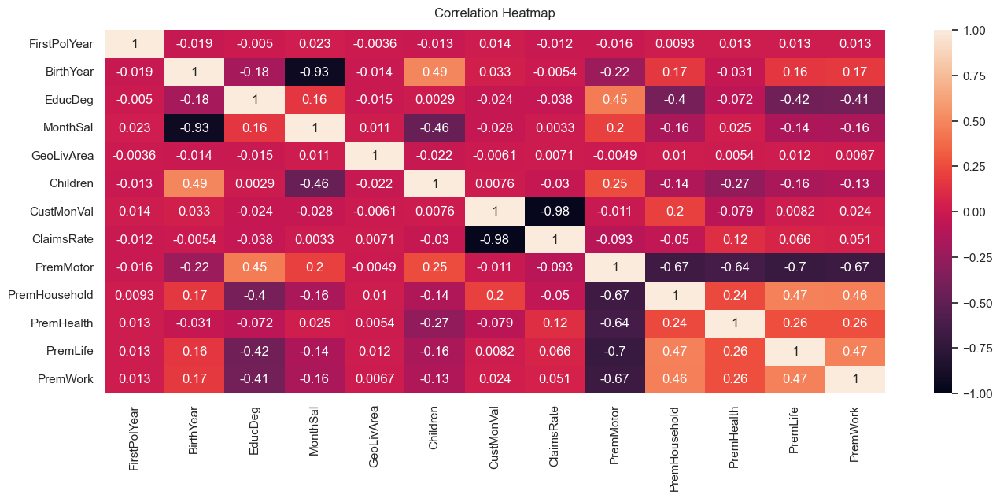

In [570]:
# Increase the size of the heatmap.
plt.figure(figsize=(16, 6))
# Store heatmap object in a variable to easily access it when you want to include more features (such as title).
# Set the range of values to be displayed on the colormap from -1 to 1, and set the annotation to True to display the correlation values on the heatmap.
heatmap = sns.heatmap(filled_df.corr(method='spearman'), vmin=-1, vmax=1, annot=True)
# Give a title to the heatmap. Pad defines the distance of the title from the top of the heatmap.
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

In [571]:
Original_df_filled

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
1,1985,1982,2,2177.0,1,1,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2,1980,1995,2,677.0,4,1,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3,1991,1970,1,2277.0,3,0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4,1989,1981,3,1099.0,4,1,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5,1986,1973,3,1763.0,4,1,35.23,0.90,338.62,47.80,182.59,18.78,41.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292,1983,1949,4,3188.0,2,0,-0.11,0.96,393.74,49.45,173.81,9.78,14.78
10293,1977,1952,1,2431.0,3,0,1405.60,0.00,133.58,1035.75,143.25,12.89,105.13
10294,1994,1976,3,2918.0,1,1,524.10,0.21,403.63,132.80,142.25,12.67,4.89


In [572]:
Original_df_filled.describe()

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
count,10282.000000,10282.000000,10282.000000,10282.000000,10282.000000,10282.000000,10282.000000,10282.000000,10282.000000,10282.000000,10282.000000,10282.000000,10282.000000
mean,1985.678759,1968.096674,2.477923,2506.743587,2.710951,0.705602,178.115871,0.743672,299.809897,210.697505,171.068080,41.487044,40.984436
std,6.617643,17.380817,0.795345,1156.828600,1.266193,0.455794,1947.122788,2.918836,212.159145,352.757315,296.136426,47.434421,51.450540
min,1974.000000,1935.000000,1.000000,333.000000,1.000000,0.000000,-165680.420000,0.000000,-4.110000,-75.000000,-2.110000,-7.000000,-12.000000
25%,1980.000000,1953.000000,2.000000,1706.000000,1.000000,0.000000,-9.220000,0.390000,190.370000,49.450000,111.020000,9.890000,10.000000
50%,1986.000000,1968.000000,3.000000,2502.000000,3.000000,1.000000,187.250000,0.720000,298.390000,133.350000,162.420000,25.450000,25.560000
75%,1992.000000,1983.000000,3.000000,3290.750000,4.000000,1.000000,399.942500,0.980000,407.520000,290.600000,219.040000,57.010000,56.010000
max,1998.000000,2001.000000,4.000000,55215.000000,4.000000,1.000000,11875.890000,256.200000,11604.420000,25048.800000,28272.000000,398.300000,1988.700000


##  4.3. First Outliers Treatment <a class="anchor" id="4.3"></a>

<font color=darkblue>
Let's look at the bok plot again to see what we have <font color=darkblue>
</font >

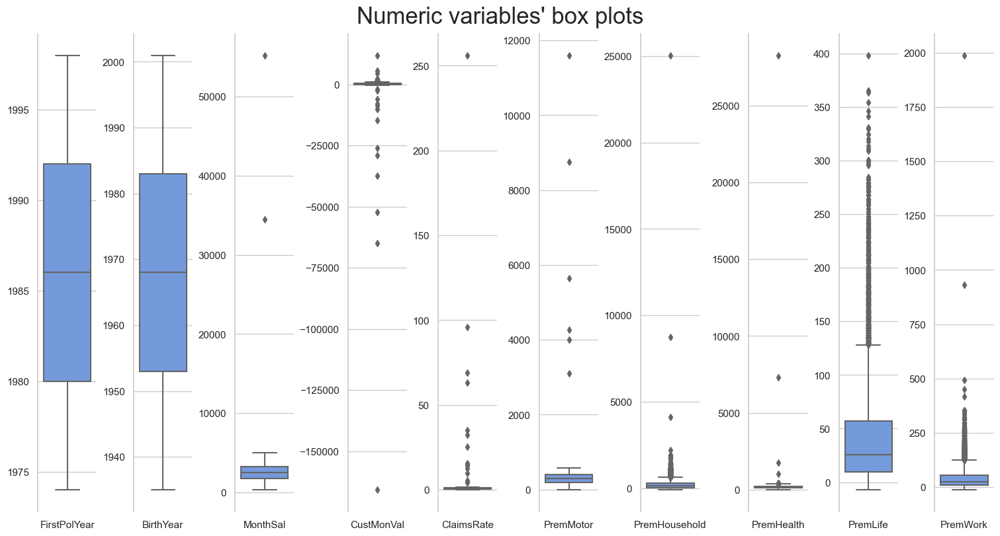

In [573]:
# Box plots for the numeric variables
sns.set(style="whitegrid")

data = pd.melt(Original_df_filled[metric_feature])
plot_features = metric_features.columns

#Prepare figure layout
fig, axes = plt.subplots(1, len(plot_features), figsize=(15,8), constrained_layout=True)
    
# Draw the boxplots
for i in zip(axes, plot_features):
    sns.boxplot(x="variable", y="value", data=data.loc[data["variable"]==i[1]], ax=i[0], color='cornflowerblue')
    i[0].set_xlabel("")
    i[0].set_ylabel("")

# Finalize the plot
plt.suptitle("Numeric variables' box plots", fontsize=25)
sns.despine(bottom=True)

plt.show()

<font color=darkblue>
So we noticed that we are dealing with a skwed distribution so after some researches we opted for dealing with outliers on two phases first deleting some very obvious outliers to make the data more normal than make a normalisation using one of the transformation methods that we will discus later than perform further checks for outliers <font color=darkblue>
</font >

<font color=darkblue>
Obviously looking at the box plot we can see that the data have so many outliers and the data in most variables is not normal  
    
We will see them variable per variable and we will check the distribution before and after the first ouliers treatment  
</font >

### Monthsal Feature

[Text(0.5, 0, '')]

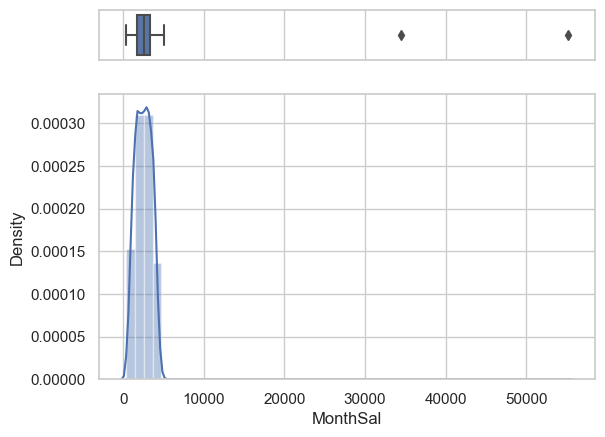

In [574]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(Original_df_filled["MonthSal"], ax=ax_box)
sns.distplot(Original_df_filled["MonthSal"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

In [575]:
# we have 2 outliers 
#DROP ABOVE  30000
Original_df_filled = Original_df_filled[(Original_df_filled["MonthSal"]<30000)]


[Text(0.5, 0, '')]

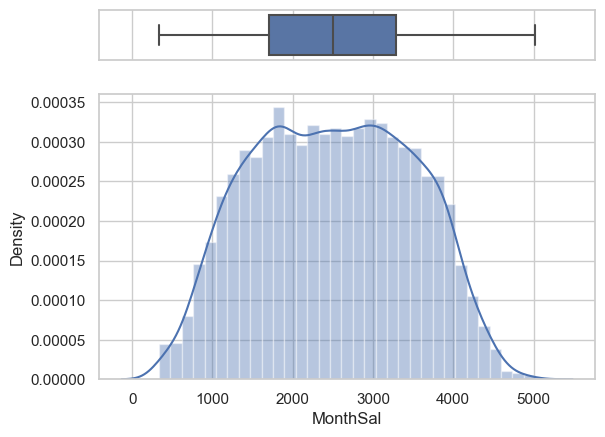

In [576]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(Original_df_filled["MonthSal"], ax=ax_box)
sns.distplot(Original_df_filled["MonthSal"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

We can notice that we almost fixed the distribution of the salary variable 


### CustMonval Feature

[Text(0.5, 0, '')]

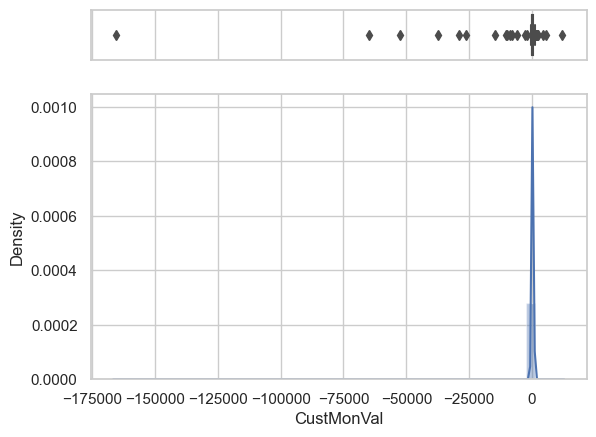

In [577]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(Original_df_filled["CustMonVal"], ax=ax_box)
sns.distplot(Original_df_filled["CustMonVal"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

<font color=darkblue>
This on the other hand is not as obvious for now we will only keep datapoints higher than -75000<font color=darkblue>
</font >

In [578]:
filters =((Original_df_filled["CustMonVal"]>-50000) )
Original_df_filled = Original_df_filled[filters]


[Text(0.5, 0, '')]

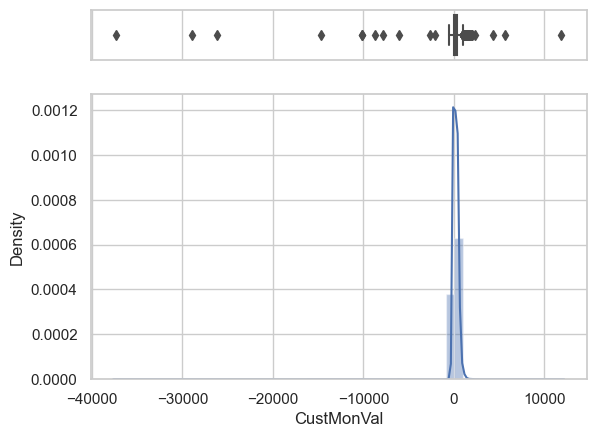

In [579]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(Original_df_filled["CustMonVal"], ax=ax_box)
sns.distplot(Original_df_filled["CustMonVal"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

<font color=darkblue>
The results we got is not as satisfying but it is a good start <font color=darkblue>
</font >

### ClaimRate Feature

[Text(0.5, 0, '')]

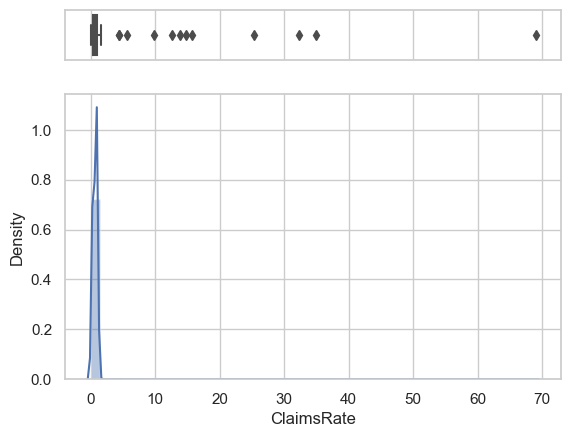

In [580]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(Original_df_filled["ClaimsRate"], ax=ax_box)
sns.distplot(Original_df_filled["ClaimsRate"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

In [581]:
#DROP Aove 20
filters =((Original_df_filled["ClaimsRate"]<20))
Original_df_filled = Original_df_filled[filters]


[Text(0.5, 0, '')]

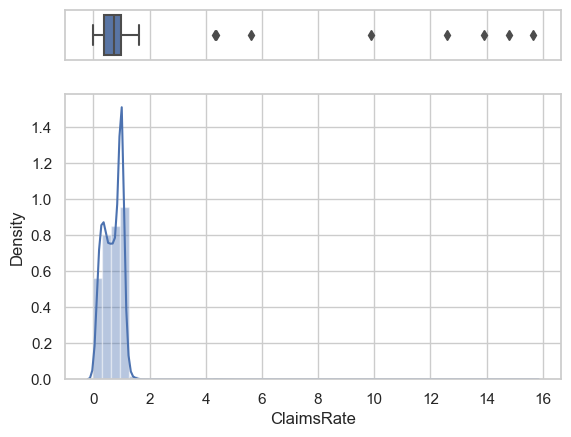

In [582]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(Original_df_filled["ClaimsRate"], ax=ax_box)
sns.distplot(Original_df_filled["ClaimsRate"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

<font color=darkblue>
We could have removed values above 4 but since we will perform more checks after normalization we will try to keep the maximum number of values <font color=darkblue>
</font >

### PremMotor Feature

[Text(0.5, 0, '')]

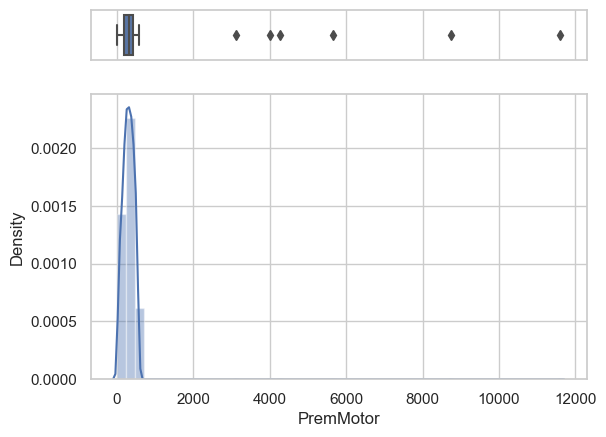

In [583]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(Original_df_filled["PremMotor"], ax=ax_box)
sns.distplot(Original_df_filled["PremMotor"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

In [584]:
Original_df_filled
#DROP ABOVE  2000
filters =((Original_df_filled["PremMotor"]<2000))
Original_df_filled = Original_df_filled[filters]


[Text(0.5, 0, '')]

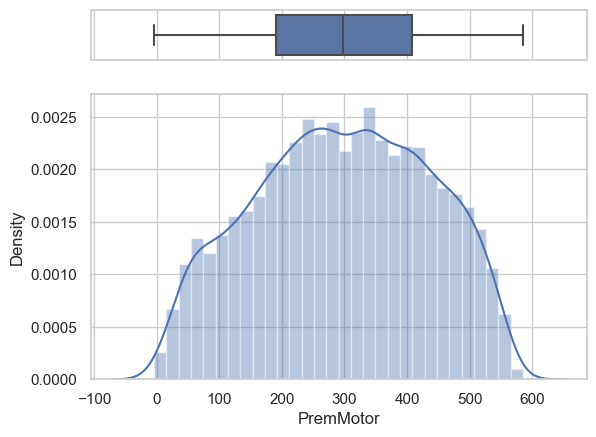

In [585]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(Original_df_filled["PremMotor"], ax=ax_box)
sns.distplot(Original_df_filled["PremMotor"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

<font color=darkblue>
We obviously have better results now <font color=darkblue>
</font >

### PremHoushold feature

[Text(0.5, 0, '')]

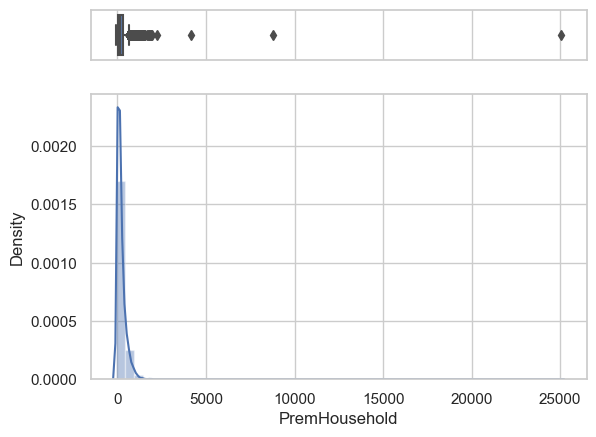

In [586]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(Original_df_filled["PremHousehold"], ax=ax_box)
sns.distplot(Original_df_filled["PremHousehold"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

In [587]:
#DROP ABOVE  4000
filters =((Original_df_filled["PremHousehold"]<4000))
Original_df_filled = Original_df_filled[filters]


[Text(0.5, 0, '')]

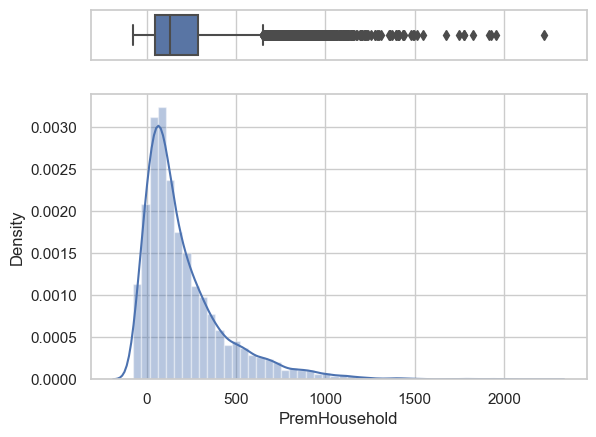

In [588]:

# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(Original_df_filled["PremHousehold"], ax=ax_box)
sns.distplot(Original_df_filled["PremHousehold"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

<font color=darkblue>
The distribution of the data improved enormously <font color=darkblue>
</font >

### PremHealth Feature

[Text(0.5, 0, '')]

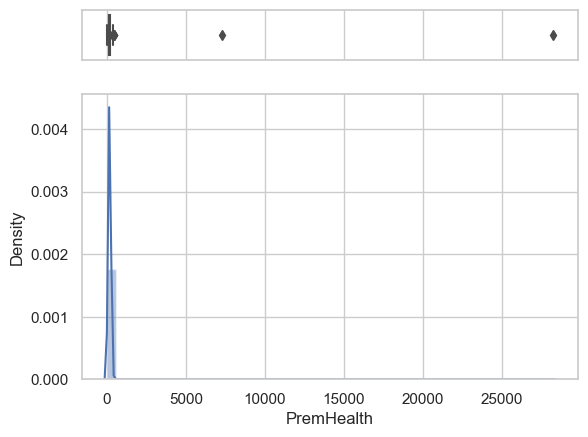

In [589]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(Original_df_filled["PremHealth"], ax=ax_box)
sns.distplot(Original_df_filled["PremHealth"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

In [590]:
#DROP ABOVE  5000
filters =((Original_df_filled["PremHealth"]<5000))
Original_df_filled = Original_df_filled[filters]


[Text(0.5, 0, '')]

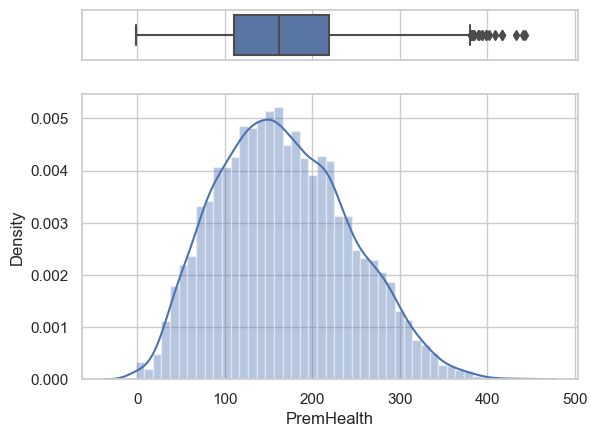

In [591]:
#sns.set_palette("colorblind")

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(Original_df_filled["PremHealth"], ax=ax_box)
sns.distplot(Original_df_filled["PremHealth"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

### Premlife Feature

[Text(0.5, 0, '')]

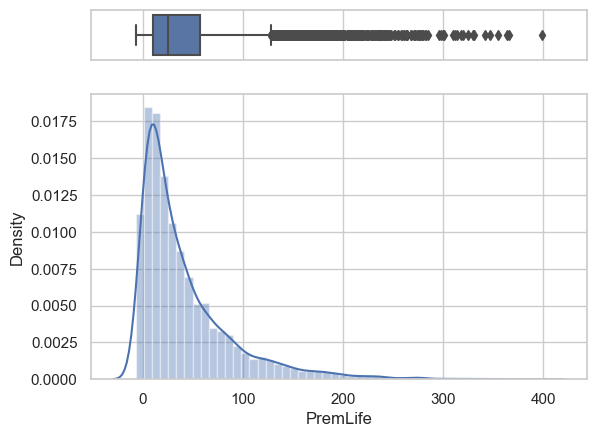

In [592]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(Original_df_filled["PremLife"], ax=ax_box)
sns.distplot(Original_df_filled["PremLife"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

In [593]:
#DROP ABOVE  370
filters =((Original_df_filled["PremLife"]<370))
Original_df_filled = Original_df_filled[filters]


[Text(0.5, 0, '')]

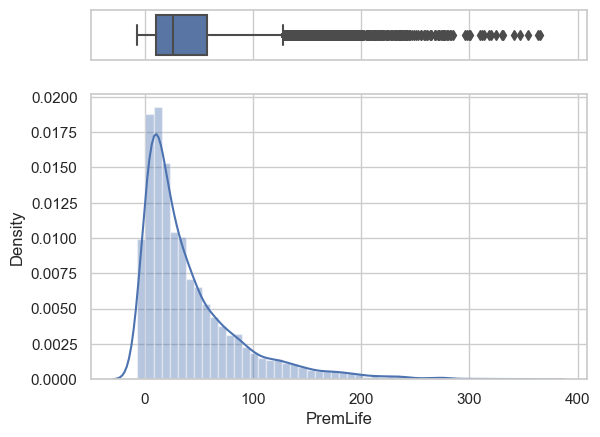

In [594]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(Original_df_filled["PremLife"], ax=ax_box)
sns.distplot(Original_df_filled["PremLife"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

### PremWork Feature 

[Text(0.5, 0, '')]

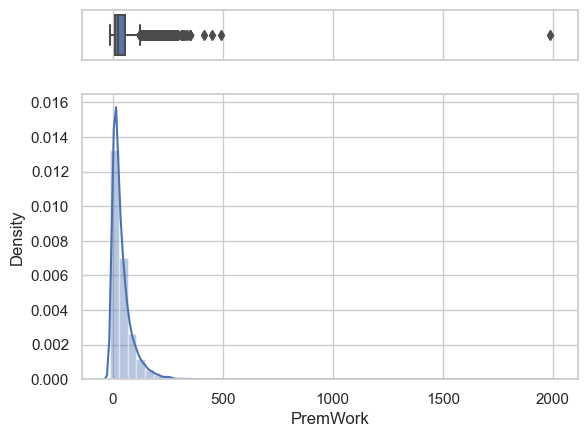

In [595]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(Original_df_filled["PremWork"], ax=ax_box)
sns.distplot(Original_df_filled["PremWork"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

In [596]:
#DROP ABOVE  500
filters =((Original_df_filled["PremWork"]<500))
Original_df_filled = Original_df_filled[filters]


[Text(0.5, 0, '')]

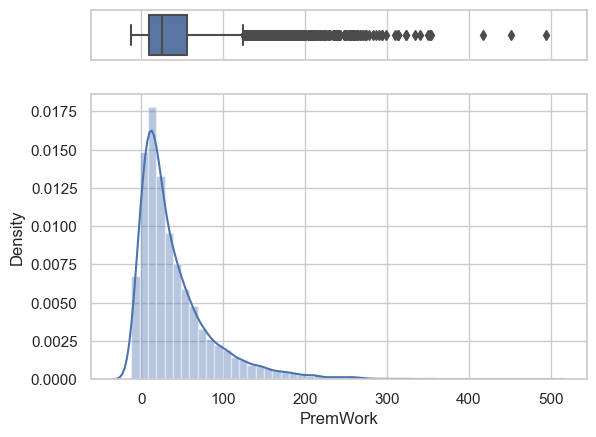

In [597]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(Original_df_filled["PremWork"], ax=ax_box)
sns.distplot(Original_df_filled["PremWork"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

<font color=darkblue>
Now let's see after removing all the impossible data and the extreme outliers the percentage of data loss <font color=darkblue>
</font >

In [598]:
print((100-(10296-Original_df_filled.shape[0])/10296),"is the percentage of data kept after the first outlier check ")

99.9965034965035 is the percentage of data kept after the first outlier check 


##  4.4. Feature engineering <a class="anchor" id="4.4"></a>

<font color=darkblue>
Now it was time to make some feature engineering <font color=darkblue>
</font >

In [599]:
Original_df_filled


,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
1,1985,1982,2,2177.0,1,1,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2,1980,1995,2,677.0,4,1,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3,1991,1970,1,2277.0,3,0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4,1989,1981,3,1099.0,4,1,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5,1986,1973,3,1763.0,4,1,35.23,0.90,338.62,47.80,182.59,18.78,41.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292,1983,1949,4,3188.0,2,0,-0.11,0.96,393.74,49.45,173.81,9.78,14.78
10293,1977,1952,1,2431.0,3,0,1405.60,0.00,133.58,1035.75,143.25,12.89,105.13
10294,1994,1976,3,2918.0,1,1,524.10,0.21,403.63,132.80,142.25,12.67,4.89


<font color=darkblue>
After exploring the data and taking a look at each feature alone and the relationship of each feature several actions was decided   

1/First creating a new categorical variable containing information about the generation of the customer because in the customer analysis to keep track of such information   
2/Since the premium variables are calculated yearly we chose to transform the monthly salary to a yearly salary   
3/We will change the variable FirstPolYearto a period of inscription calculted in number of years as a client   
4/We will change the variable CustMonVal which calculates the value of the customer through out the whole time he was a customer 
by a average yearly value that calculates each value approximatly   
PS:We wanted to avoid the curse of dimentionality and we wanted to join the premiums of the clients but we noticed that they are quite different and not that corelated with each other <font color=darkblue>
</font >

### Generation Feature 

In [600]:
Generations = []
for index, row in Original_df_filled.iterrows():
    birth = Original_df_filled['BirthYear']
    if birth[index] <=1964:
        Generation='Baby_Boomers'
    elif birth[index] <1981:
        Generation='Generation_X'
    elif birth[index] <1996:
        Generation='Millennials'
    else:
        Generation='Generation_Z'
    Generations.append(Generation)
Original_df_filled['Generation'] = Generations


In [601]:
Original_df_filled['Generation'].value_counts()

Baby_Boomers    4567
Generation_X    2695
Millennials     2520
Generation_Z     478
Name: Generation, dtype: int64

### Yearly salary 

In [602]:
Original_df_filled['Yearly_Salary']=12*Original_df_filled['MonthSal']
Original_df_filled =  Original_df_filled.drop(columns=['MonthSal'])

###  YearsAsCust

In [603]:
Original_df_filled['YearsAsCust'] = 2016 - Original_df_filled['FirstPolYear']+1


In [604]:
Original_df_filled =  Original_df_filled.drop(columns=['FirstPolYear'])

### Yearly_cust_value 

In [605]:
Original_df_filled['Yearly_cust_value'] = (Original_df_filled['CustMonVal']+25) / Original_df_filled['YearsAsCust']
Original_df_filled['Yearly_cust_value'] = Original_df_filled['Yearly_cust_value'].round(decimals = 2)

In [606]:
correlation = Original_df_filled['Yearly_cust_value'].corr(Original_df_filled['CustMonVal'])

print(correlation)


0.9606989530774408


<font color=darkblue>
Now we need to make our data transformation :
    for that we can make more than scaling method such as robust scaler ,minmaxsacler and other scaling techniques    
      PS: WE thought about using a log transformation then we did not because we have negative values <font color=darkblue>
</font >

In [607]:
Original_df_filled.columns

Index(['BirthYear', 'EducDeg', 'GeoLivArea', 'Children', 'CustMonVal',
       'ClaimsRate', 'PremMotor', 'PremHousehold', 'PremHealth', 'PremLife',
       'PremWork', 'Generation', 'Yearly_Salary', 'YearsAsCust',
       'Yearly_cust_value'],
      dtype='object')

##  4.5. Feature Selection <a class="anchor" id="4.5"></a>

In [608]:
categorical=['EducDeg','GeoLivArea','Children','Generation']
metric_features=[col for col in Original_df_filled.columns if col not in categorical]

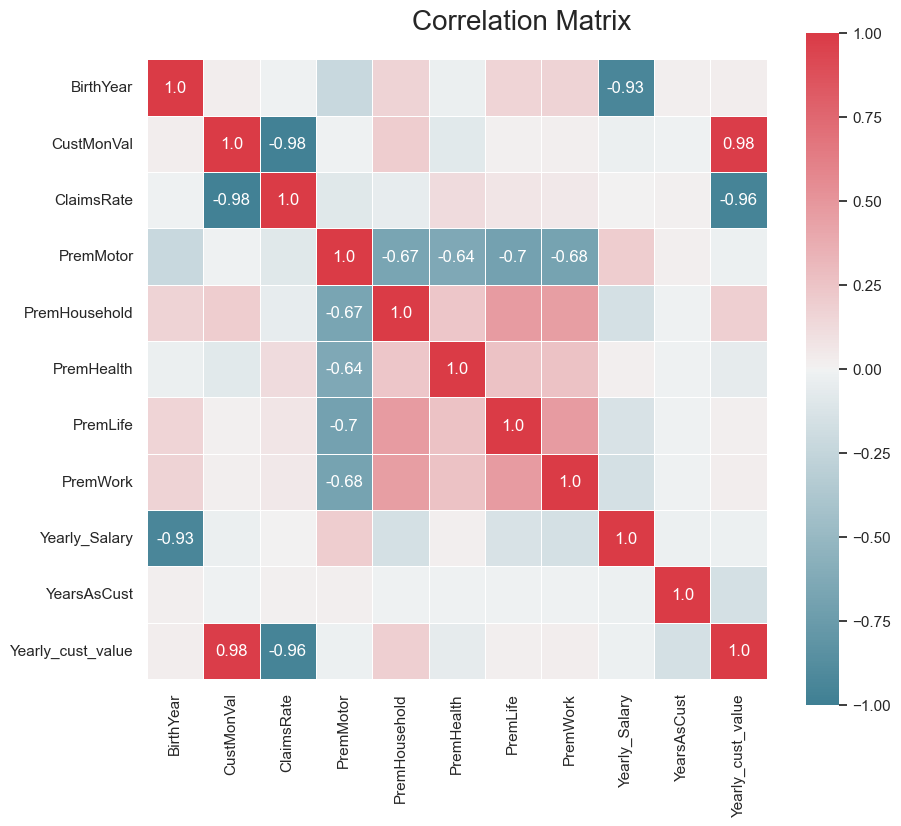

In [609]:
# Prepare figure
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(Original_df_filled[metric_features].corr(method="spearman"), decimals=2)

# Build annotation matrix (values above |0.6| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.6
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

### Conclusion :  

<font color=darkblue>


We have that yearly_salary and birth year are highly corelated so we will drop it (We already check that before and that's why   
we added the variable generation).  
As we wanted yearly_cust_value is highly corelated with customerval so we will drop it .
claimsRate is also highly corelated with yearly_cust_value so we will drop it 
The only other interesting thing is that premMotor is negatively corelated with the all other premiums but since the other premiums are not highly corelated together we can not group them together  <font color=darkblue>
</font >
                                                                                       

### Data check after Feature engeneering and Selection

In [610]:
Original_df_filled.head()

,BirthYear,EducDeg,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Generation,Yearly_Salary,YearsAsCust,Yearly_cust_value
CustID,,,,,,,,,,,,,,,
1,1982,2,1,1,380.97,0.39,375.85,79.45,146.36,47.01,16.89,Millennials,26124.0,32,12.69
2,1995,2,4,1,-131.13,1.12,77.46,416.20,116.69,194.48,106.13,Millennials,8124.0,37,-2.87
3,1970,1,3,0,504.67,0.28,206.15,224.50,124.58,86.35,99.02,Generation_X,27324.0,26,20.37
4,1981,3,4,1,-16.99,0.99,182.48,43.35,311.17,35.34,28.34,Millennials,13188.0,28,0.29
5,1973,3,4,1,35.23,0.90,338.62,47.80,182.59,18.78,41.45,Generation_X,21156.0,31,1.94


In [611]:
Original_df_filled = Original_df_filled.drop(['BirthYear', 'CustMonVal','ClaimsRate',], axis=1)

In [612]:
Original_df_filled["YearsAsCust"] = Original_df_filled["YearsAsCust"].apply(float)

In [613]:
Original_df_filled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10260 entries, 1 to 10296
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   EducDeg            10260 non-null  int32  
 1   GeoLivArea         10260 non-null  int32  
 2   Children           10260 non-null  int32  
 3   PremMotor          10260 non-null  float64
 4   PremHousehold      10260 non-null  float64
 5   PremHealth         10260 non-null  float64
 6   PremLife           10260 non-null  float64
 7   PremWork           10260 non-null  float64
 8   Generation         10260 non-null  object 
 9   Yearly_Salary      10260 non-null  float64
 10  YearsAsCust        10260 non-null  float64
 11  Yearly_cust_value  10260 non-null  float64
dtypes: float64(8), int32(3), object(1)
memory usage: 1.2+ MB


#  4.6. Scaling <a class="anchor" id="4.6"></a>

<font color=darkblue>This is on of the most important parts. Thus we need to deal with it very carfuly .
So we chose three types of normalization and then check the distribution of the data ,compare and finaly choose the normalization technique we are going to use </font >

<P><font color=blue>
 We will use MinMax scaler ,  Robust Scaler and the  power transformation   
    
</font ></p>  
  
<font color=darkblue>   
<p>The power transformation is a way of scaling the data so that it is more symmetrical and follows a more Gaussian-like distribution. This can be useful for modeling data with skewed distributions, as it can help to stabilize variance and improve the accuracy of certain types of models.</p>

<p>The PowerTransformer class has several different power transformation methods available, including the yeo-johnson method. The yeo-johnson method is a power transformation that is similar to the box-cox method, but it can handle both positive and negative data values. <font color=darkblue></P>
</font >

Resources:
    https://www.ucd.ie/ecomodel/Resources/QQplots_WebVersion.html#:~:text=The%20normal%20distribution%20is%20symmetric,deviate%20from%20the%20straight%20line).

In [614]:
minmax = MinMaxScaler()
robust = RobustScaler()
yeojohnson = PowerTransformer('yeo-johnson')

num_features= Original_df_filled.select_dtypes('float64')

# transform data
scaled_minmax = minmax.fit_transform(num_features)
scaled_robust = robust.fit_transform(num_features)
scaled_yeojohn = yeojohnson.fit_transform(num_features)

# Concatenate the results to be visualized
normal_res = np.concatenate((scaled_minmax, scaled_robust, scaled_yeojohn), axis=1)
labels = list(map(lambda x: "minmax_" + x, num_features.columns.to_list())) + list(map(lambda x: "robust_" + x, num_features.columns.to_list())) + list(map(lambda x: "yeojohn_" + x, num_features.columns.to_list()))
normal_res_df = pd.DataFrame(normal_res, num_features.index, labels)
normal_res_df.head()

,minmax_PremMotor,minmax_PremHousehold,minmax_PremHealth,minmax_PremLife,minmax_PremWork,minmax_Yearly_Salary,minmax_YearsAsCust,minmax_Yearly_cust_value,robust_PremMotor,robust_PremHousehold,...,robust_YearsAsCust,robust_Yearly_cust_value,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_YearsAsCust,yeojohn_Yearly_cust_value
CustID,,,,,,,,,,,,,,,,,,,,,
1,0.644732,0.067189,0.333663,0.145118,0.057084,0.393345,0.541667,0.876993,0.356848,-0.222880,...,0.083333,0.446375,0.587875,-0.400897,-0.209060,0.395978,-0.352225,-0.289872,0.131247,0.418186
2,0.138411,0.213681,0.266984,0.541351,0.233412,0.073379,0.750000,0.850821,-1.017794,1.176746,...,0.500000,-0.728852,-1.623558,0.942678,-0.627431,2.380249,1.369166,-1.958873,0.863810,-1.000847
3,0.356778,0.130288,0.284716,0.250819,0.219364,0.414676,0.291667,0.889911,-0.424937,0.379988,...,-0.416667,1.026435,-0.619110,0.234715,-0.513312,1.073703,1.262799,-0.187636,-0.791507,1.252011
4,0.316614,0.051485,0.704047,0.113762,0.079708,0.163396,0.375000,0.856136,-0.533981,-0.372922,...,-0.250000,-0.490181,-0.795838,-0.592429,1.771473,0.144299,-0.046149,-1.454521,-0.477957,-0.778470
5,0.581559,0.053420,0.415084,0.069268,0.105612,0.305034,0.500000,0.858911,0.185334,-0.354426,...,0.000000,-0.365559,0.330303,-0.567336,0.268307,-0.296022,0.250918,-0.722077,-0.018971,-0.640068


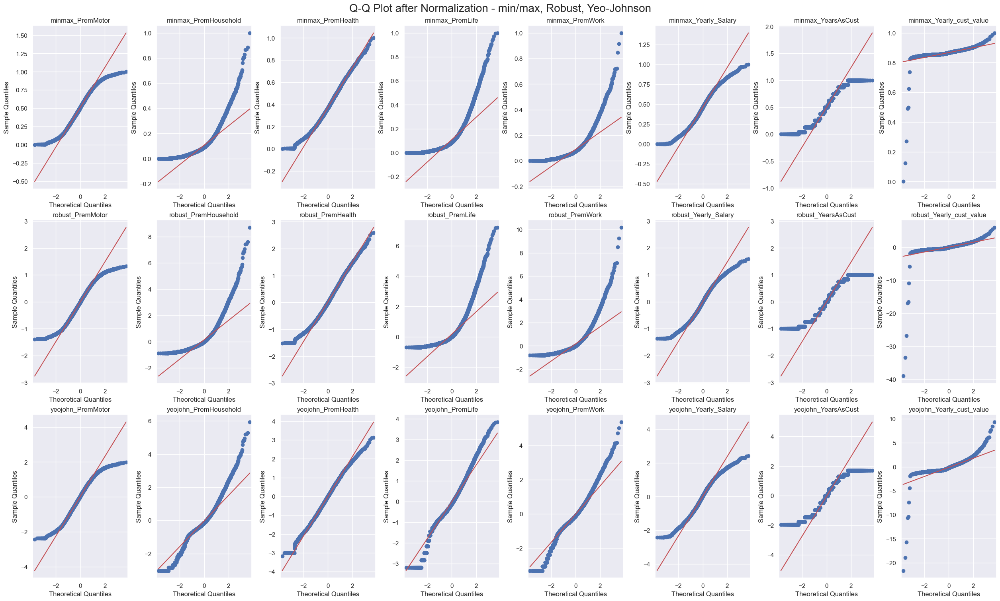

In [615]:
# Plot transformed data
sns.set()
fig, axes = plt.subplots(3,8, constrained_layout = True, figsize = (25,15))

fig.suptitle("Q-Q Plot after Normalization - min/max, Robust, Yeo-Johnson", fontsize = 20)
for c, ax in zip(normal_res_df.columns, axes.flatten()):
    x = normal_res_df.loc[:,c]
    sm.qqplot(x, line = "q", ax = ax)
    ax.set_title(c)

plt.show()

<P><font color=darkblue>
It was clear that the distribution in the power transformer using yeo-johnson method gave better results .In fact the data looks very close to normal in most variables     
</font ></p> 

In [616]:
# We will only use yeo-johnson as the results most consistly produced normal distribution compared to other methods
scaled_yj_df = normal_res_df.loc[:,[i for i in normal_res_df.columns.to_list() if "yeojohn" in i]]
scaled_yj_df

,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_YearsAsCust,yeojohn_Yearly_cust_value
CustID,,,,,,,,
1,0.587875,-0.400897,-0.209060,0.395978,-0.352225,-0.289872,0.131247,0.418186
2,-1.623558,0.942678,-0.627431,2.380249,1.369166,-1.958873,0.863810,-1.000847
3,-0.619110,0.234715,-0.513312,1.073703,1.262799,-0.187636,-0.791507,1.252011
4,-0.795838,-0.592429,1.771473,0.144299,-0.046149,-1.454521,-0.477957,-0.778470
5,0.330303,-0.567336,0.268307,-0.296022,0.250918,-0.722077,-0.018971,-0.640068
...,...,...,...,...,...,...,...,...
10292,0.710492,-0.558162,0.155488,-0.618836,-0.416241,0.713109,0.427841,-0.742951
10293,-1.170669,2.861485,-0.251618,-0.495994,1.354376,-0.031649,1.290026,3.028872
10294,0.777977,-0.149995,-0.265361,-0.504206,-0.779604,0.451294,-1.274659,1.645259


We obtained the dataset scaled_yj_df a scaled dataset and without the early droped values (outliers,impossible values )

# 4.7. PCA Check <a class="anchor" id="4.7"></a>

In [617]:
df_pca = scaled_yj_df.copy()

In [618]:
from sklearn.decomposition import PCA

# Use PCA to reduce dimensionality of data
pca = PCA()
pca_feat = pca.fit_transform(df_pca)
pca_feat  # What is this output?

array([[-0.44222949, -0.33383551,  0.33627205, ...,  0.46701311,
        -0.5937145 , -0.32689219],
       [ 3.03530685,  0.62639056,  2.2609985 , ...,  0.68781528,
        -0.18055827,  0.19947854],
       [ 1.47177958, -1.42041594, -0.08870142, ..., -0.25673849,
        -0.85342112,  0.02366367],
       ...,
       [-1.03602264, -1.8918296 , -1.07005176, ...,  0.20413067,
        -0.24305487, -0.13089464],
       [ 1.63789121,  0.69867774,  0.69433962, ..., -0.64287946,
        -0.58048301, -0.19106513],
       [-1.19639132, -1.00993173, -0.4615313 , ..., -0.18695877,
        -0.15798074, -0.15467415]])

In [619]:
# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,2.957429,0.000000,0.369643,0.369643
2,1.280754,-1.676675,0.160079,0.529721
3,1.063188,-0.217566,0.132886,0.662607
4,0.840547,-0.222641,0.105058,0.767665
5,0.716099,-0.124448,0.089504,0.857169
6,0.584146,-0.131953,0.073011,0.930180
7,0.486515,-0.097631,0.060808,0.990988
8,0.072102,-0.414413,0.009012,1.000000


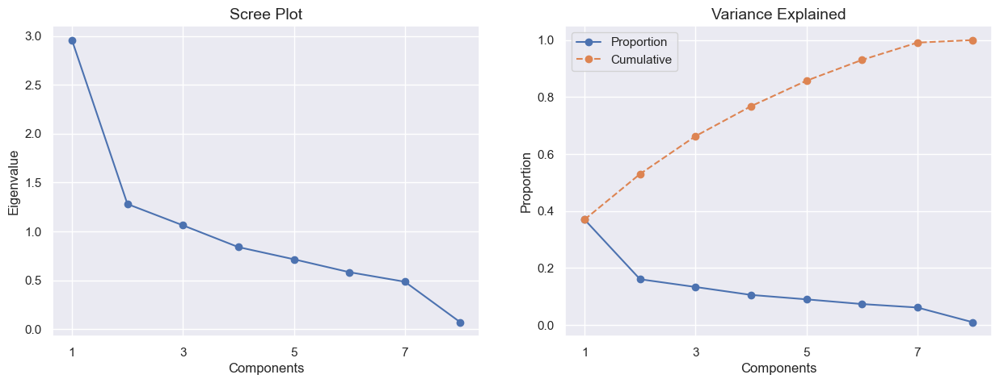

In [620]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [621]:
# Perform PCA again with the number of principal components you want to retain
pca = PCA(n_components=4)
pca_feat = pca.fit_transform(df_pca)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_pca.index, columns=pca_feat_names)  # remember index=df_pca.index
pca_df

,PC0,PC1,PC2,PC3
CustID,,,,
1,-0.442229,-0.333836,0.336272,0.044842
2,3.035307,0.626391,2.260999,0.852701
3,1.471780,-1.420416,-0.088701,0.062379
4,0.984621,1.062116,-0.336384,1.726006
5,-0.280977,0.515372,0.348622,0.894437
...,...,...,...,...
10292,-1.263760,0.924937,-0.232423,-0.223349
10293,2.439901,-2.198714,0.827755,-2.927940
10294,-1.036023,-1.891830,-1.070052,-0.175583


In [622]:
# Reassigning df to contain pca variables
df_pca = pd.concat([df_pca, pca_df], axis=1)
df_pca.head()

,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_YearsAsCust,yeojohn_Yearly_cust_value,PC0,PC1,PC2,PC3
CustID,,,,,,,,,,,,
1,0.587875,-0.400897,-0.209060,0.395978,-0.352225,-0.289872,0.131247,0.418186,-0.442229,-0.333836,0.336272,0.044842
2,-1.623558,0.942678,-0.627431,2.380249,1.369166,-1.958873,0.863810,-1.000847,3.035307,0.626391,2.260999,0.852701
3,-0.619110,0.234715,-0.513312,1.073703,1.262799,-0.187636,-0.791507,1.252011,1.471780,-1.420416,-0.088701,0.062379
4,-0.795838,-0.592429,1.771473,0.144299,-0.046149,-1.454521,-0.477957,-0.778470,0.984621,1.062116,-0.336384,1.726006
5,0.330303,-0.567336,0.268307,-0.296022,0.250918,-0.722077,-0.018971,-0.640068,-0.280977,0.515372,0.348622,0.894437


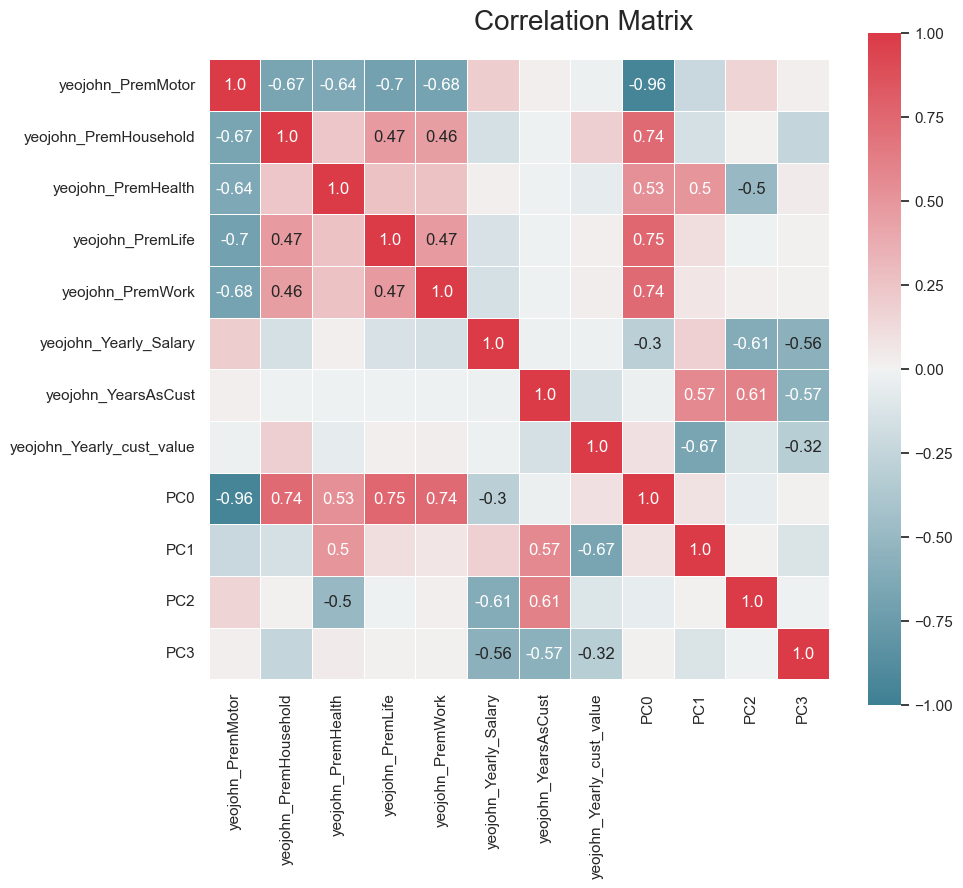

In [623]:
# Prepare figure
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(df_pca.corr(method="spearman"), decimals=2)

# Build annotation matrix (values above |0.6| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.3
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

Perspectives that we will follow : Premiums features which are highly corelated with the first Principle component Value featurs Which are related to the client and his income

In [624]:
scaled_yj_df

,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_YearsAsCust,yeojohn_Yearly_cust_value
CustID,,,,,,,,
1,0.587875,-0.400897,-0.209060,0.395978,-0.352225,-0.289872,0.131247,0.418186
2,-1.623558,0.942678,-0.627431,2.380249,1.369166,-1.958873,0.863810,-1.000847
3,-0.619110,0.234715,-0.513312,1.073703,1.262799,-0.187636,-0.791507,1.252011
4,-0.795838,-0.592429,1.771473,0.144299,-0.046149,-1.454521,-0.477957,-0.778470
5,0.330303,-0.567336,0.268307,-0.296022,0.250918,-0.722077,-0.018971,-0.640068
...,...,...,...,...,...,...,...,...
10292,0.710492,-0.558162,0.155488,-0.618836,-0.416241,0.713109,0.427841,-0.742951
10293,-1.170669,2.861485,-0.251618,-0.495994,1.354376,-0.031649,1.290026,3.028872
10294,0.777977,-0.149995,-0.265361,-0.504206,-0.779604,0.451294,-1.274659,1.645259


#  4.8. Second Outliers Treatment <a class="anchor" id="4.8"></a>

<P><font color=darkblue>
    

As we have a lot of dimentions and as we already performed an outliers treatment using univarite and bivariate analysis.  
We opted for methods that are density base and that works better when there are high dimentions :First local outlier factor then DBSCAN to eliminate noise 
    
</font ></p>

### Local Outlier Factor

The Local Outlier Factor (LOF) is an algorithm for identifying anomalies or outliers in data. It is based on the idea that an outlier is a point that is significantly different from its neighbors in the feature space.

The LOF algorithm measures the local deviation of a point from the density of its neighbors, and assigns a score to each point called the Local Outlier Factor (LOF) score. Points with high LOF scores are considered to be more likely to be outliers.

The LOF algorithm uses a distance metric to determine the distance between points in the feature space

In [625]:
lof = LocalOutlierFactor(n_neighbors=100, contamination=0.01)
lof_scores = lof.fit_predict(scaled_yj_df)
outliers = scaled_yj_df[lof_scores == -1]
outliers


,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_YearsAsCust,yeojohn_Yearly_cust_value
CustID,,,,,,,,
113,1.546730,-0.853592,-1.608570,-0.914561,-0.543809,-0.109429,-1.775464,-18.960772
136,0.042418,-0.019112,-0.250108,1.743198,-1.454365,-0.290898,-1.775464,-21.658284
139,-0.707548,0.546041,-3.012349,0.189994,-0.329314,0.075752,1.006917,-0.397827
387,-1.123859,0.412148,-3.012349,-0.020649,-0.112595,-1.264624,-1.775464,0.219569
489,-2.358231,-0.900082,1.414902,-1.245988,-0.065308,1.104180,1.290026,-0.852328
...,...,...,...,...,...,...,...,...
9428,-0.516598,2.394057,0.038031,0.097348,-3.314409,-1.875895,-0.950764,-0.032782
9563,-2.018314,3.207197,-1.056787,-0.542383,2.981142,-1.704004,-1.946866,7.722515
9654,-0.020624,-0.618087,-3.012349,0.357451,-1.982477,-0.182545,0.863810,-0.237171


In [626]:
scaled_without_outliers=scaled_yj_df[lof_scores == 1]
scaled_without_outliers

,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_YearsAsCust,yeojohn_Yearly_cust_value
CustID,,,,,,,,
1,0.587875,-0.400897,-0.209060,0.395978,-0.352225,-0.289872,0.131247,0.418186
2,-1.623558,0.942678,-0.627431,2.380249,1.369166,-1.958873,0.863810,-1.000847
3,-0.619110,0.234715,-0.513312,1.073703,1.262799,-0.187636,-0.791507,1.252011
4,-0.795838,-0.592429,1.771473,0.144299,-0.046149,-1.454521,-0.477957,-0.778470
5,0.330303,-0.567336,0.268307,-0.296022,0.250918,-0.722077,-0.018971,-0.640068
...,...,...,...,...,...,...,...,...
10292,0.710492,-0.558162,0.155488,-0.618836,-0.416241,0.713109,0.427841,-0.742951
10293,-1.170669,2.861485,-0.251618,-0.495994,1.354376,-0.031649,1.290026,3.028872
10294,0.777977,-0.149995,-0.265361,-0.504206,-0.779604,0.451294,-1.274659,1.645259


### DBSCAN

In DBSCAN (Density-Based Spatial Clustering of Applications with Noise), noise points are considered to be outliers because they do not belong to any cluster.    
DBSCAN defines a cluster as a set of points that are densely packed together, with a minimum number of points required to form a cluster.

In [627]:
model = DBSCAN(eps =2 , min_samples = 20).fit(scaled_without_outliers)

#converting the array into dataframe to group by labels and check the counts

labels = model.labels_
labels_df =  pd.DataFrame(labels, columns=['cluster'])
labels_df['cluster'].value_counts()

#-1 label corresponds to the outliers

 0    10135
-1       22
Name: cluster, dtype: int64

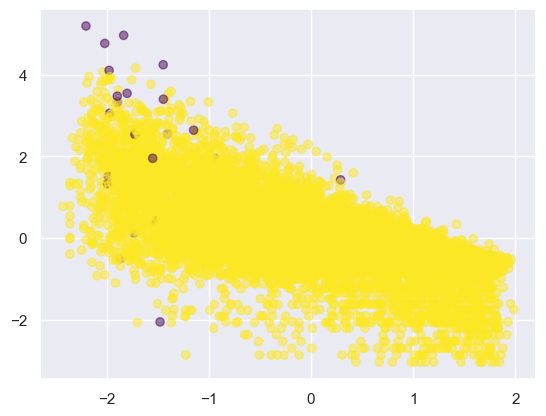

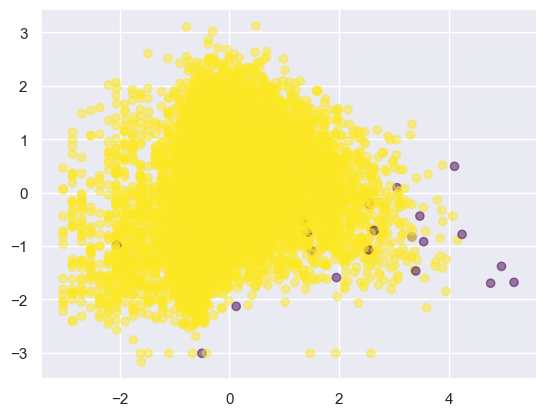

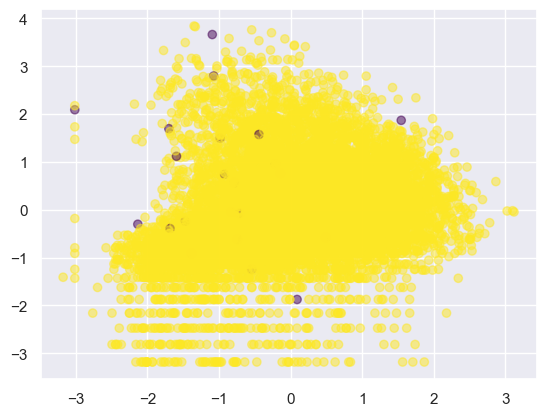

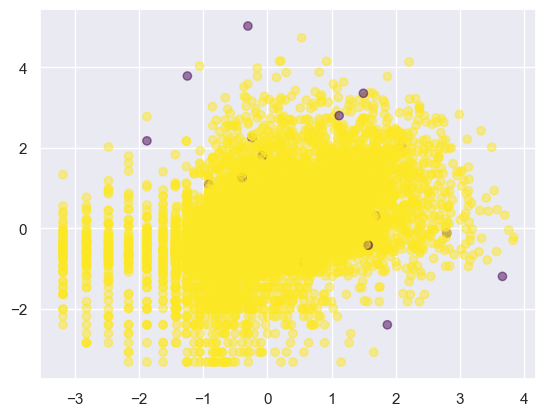

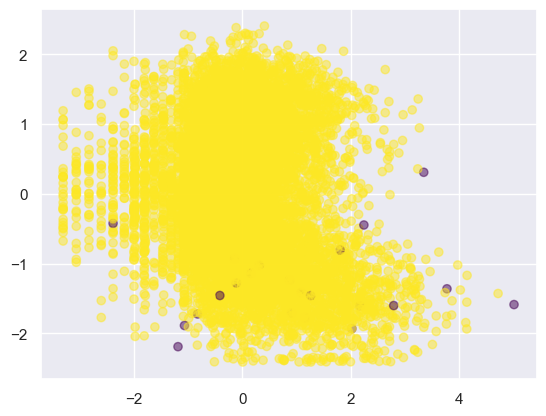

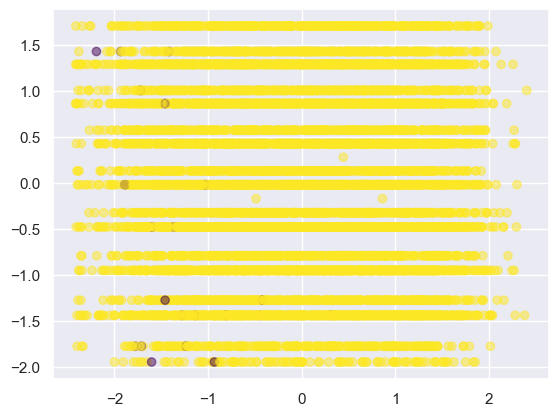

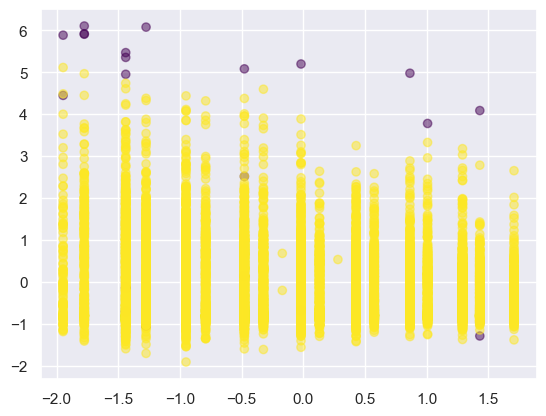

In [628]:
 
for i in [0,1,2,3,4,5,6]:
  plt.scatter(scaled_without_outliers.iloc[:,i], scaled_without_outliers.iloc[:,i+1], c=labels, cmap='viridis', alpha=0.5)

# Show the plot
  plt.show()



The parameters were manipulated several times until we got satisfying results(a reasonable number of outliers removed )

In [629]:
mask = labels != -1
Df_afteroutlier_removal=scaled_without_outliers[mask]
Df_afteroutlier_removal

,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_YearsAsCust,yeojohn_Yearly_cust_value
CustID,,,,,,,,
1,0.587875,-0.400897,-0.209060,0.395978,-0.352225,-0.289872,0.131247,0.418186
2,-1.623558,0.942678,-0.627431,2.380249,1.369166,-1.958873,0.863810,-1.000847
3,-0.619110,0.234715,-0.513312,1.073703,1.262799,-0.187636,-0.791507,1.252011
4,-0.795838,-0.592429,1.771473,0.144299,-0.046149,-1.454521,-0.477957,-0.778470
5,0.330303,-0.567336,0.268307,-0.296022,0.250918,-0.722077,-0.018971,-0.640068
...,...,...,...,...,...,...,...,...
10292,0.710492,-0.558162,0.155488,-0.618836,-0.416241,0.713109,0.427841,-0.742951
10293,-1.170669,2.861485,-0.251618,-0.495994,1.354376,-0.031649,1.290026,3.028872
10294,0.777977,-0.149995,-0.265361,-0.504206,-0.779604,0.451294,-1.274659,1.645259


In [630]:
metric_features=Df_afteroutlier_removal.columns.tolist()
metric_features

['yeojohn_PremMotor',
 'yeojohn_PremHousehold',
 'yeojohn_PremHealth',
 'yeojohn_PremLife',
 'yeojohn_PremWork',
 'yeojohn_Yearly_Salary',
 'yeojohn_YearsAsCust',
 'yeojohn_Yearly_cust_value']

### Data check after scaling and removing outliers 

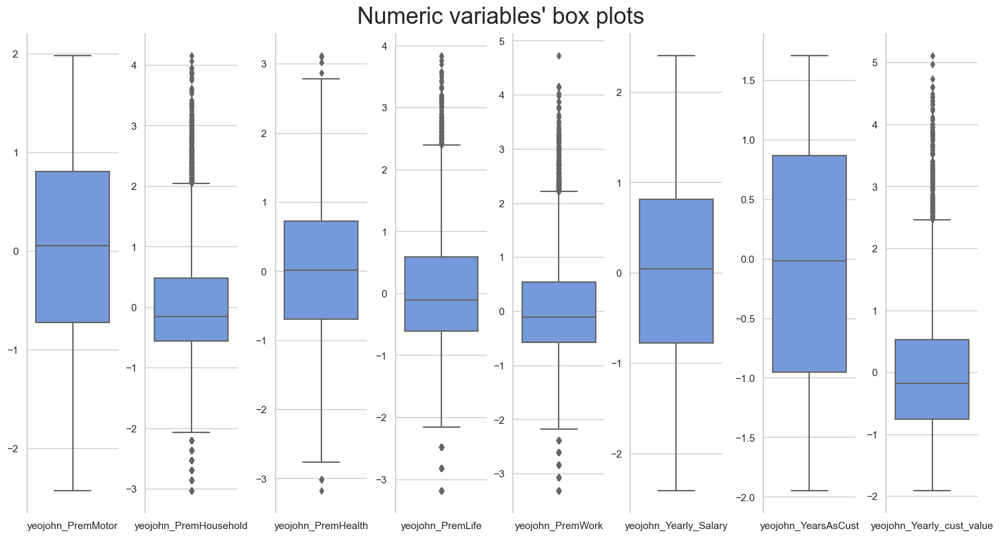

In [631]:
# Box plots for the numeric variables
sns.set(style="whitegrid")

data = pd.melt(Df_afteroutlier_removal)
plot_features = Df_afteroutlier_removal.columns

#Prepare figure layout
fig, axes = plt.subplots(1, len(plot_features), figsize=(15,8), constrained_layout=True)
    
# Draw the boxplots
for i in zip(axes, plot_features):
    sns.boxplot(x="variable", y="value", data=data.loc[data["variable"]==i[1]], ax=i[0], color='cornflowerblue')
    i[0].set_xlabel("")
    i[0].set_ylabel("")

# Finalize the plot
plt.suptitle("Numeric variables' box plots", fontsize=25)
sns.despine(bottom=True)

plt.show()

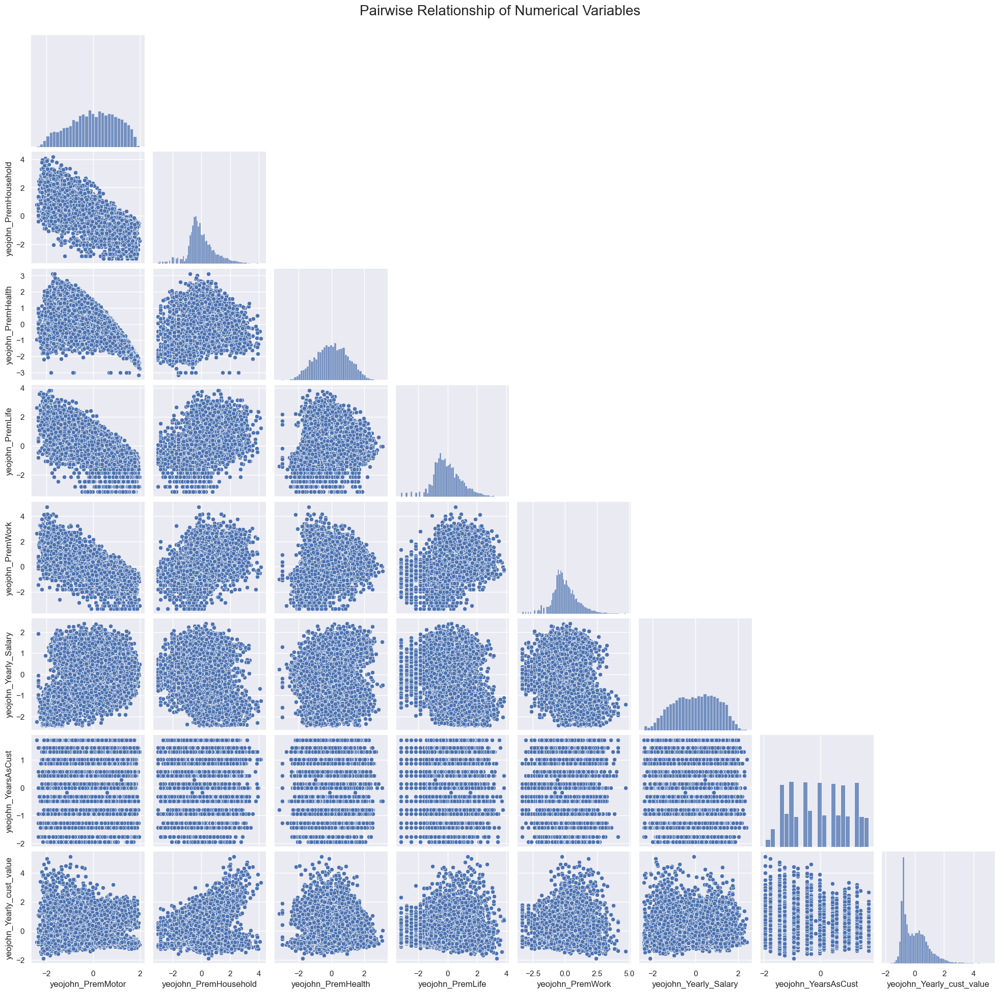

In [632]:
# Pairwise Relationship of Numerical Variables
sns.set()

# Setting pairplot
sns.pairplot(Df_afteroutlier_removal, diag_kind="hist", corner=True)

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

plt.show()

In [633]:
print (((Df_afteroutlier_removal.shape[0]))/10295,"% of the data was kept after cleaning it . ")
print(10295-Df_afteroutlier_removal.shape[0],"Rows were removed")

0.9844584749878582 % of the data was kept after cleaning it . 
160 Rows were removed


<font color=darkblue>

Well now we will move to the next step after eliminating some outliers based on first local outlier factor and then dbscan 
interpreting the results are a bit complex since these techniques worked on eliminating outliers based on the density in the 7 dimentions<font color=darkblue>
</font >

In [634]:
#Final Data to work with 
result_afte_lof=Original_df_filled[lof_scores == 1]
result_afte_dbscan=result_afte_lof[mask]
Final_data = pd.merge(result_afte_dbscan, Df_afteroutlier_removal, on='CustID')
Final_data= Final_data.drop(columns=['PremMotor','PremHousehold','PremHealth','PremLife','PremWork','Yearly_Salary','Yearly_cust_value','YearsAsCust'])
Final_data

,EducDeg,GeoLivArea,Children,Generation,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_YearsAsCust,yeojohn_Yearly_cust_value
CustID,,,,,,,,,,,,
1,2,1,1,Millennials,0.587875,-0.400897,-0.209060,0.395978,-0.352225,-0.289872,0.131247,0.418186
2,2,4,1,Millennials,-1.623558,0.942678,-0.627431,2.380249,1.369166,-1.958873,0.863810,-1.000847
3,1,3,0,Generation_X,-0.619110,0.234715,-0.513312,1.073703,1.262799,-0.187636,-0.791507,1.252011
4,3,4,1,Millennials,-0.795838,-0.592429,1.771473,0.144299,-0.046149,-1.454521,-0.477957,-0.778470
5,3,4,1,Generation_X,0.330303,-0.567336,0.268307,-0.296022,0.250918,-0.722077,-0.018971,-0.640068
...,...,...,...,...,...,...,...,...,...,...,...,...
10292,4,2,0,Baby_Boomers,0.710492,-0.558162,0.155488,-0.618836,-0.416241,0.713109,0.427841,-0.742951
10293,1,3,0,Baby_Boomers,-1.170669,2.861485,-0.251618,-0.495994,1.354376,-0.031649,1.290026,3.028872
10294,3,1,1,Generation_X,0.777977,-0.149995,-0.265361,-0.504206,-0.779604,0.451294,-1.274659,1.645259


### One Hot encoding

One-hot encoding is a way of representing categorical variables as numerical data by creating a new binary (0 or 1) column for each possible category.

In [635]:
non_metric_features=['EducDeg','GeoLivArea','Generation']

In [636]:
#One hot encoding of categorical variables

ohc = OneHotEncoder(sparse=False, drop= 'if_binary')
ohc_feat = ohc.fit_transform(Final_data[non_metric_features])
ohc_feat_names = ohc.get_feature_names(non_metric_features)
df_ohc = pd.DataFrame(ohc_feat, index=Final_data.index, columns=ohc_feat_names) 
final_df_ohc = pd.concat([Final_data.drop(columns=non_metric_features), df_ohc], axis=1)

final_df_ohc

,Children,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_YearsAsCust,yeojohn_Yearly_cust_value,EducDeg_1,...,EducDeg_3,EducDeg_4,GeoLivArea_1,GeoLivArea_2,GeoLivArea_3,GeoLivArea_4,Generation_Baby_Boomers,Generation_Generation_X,Generation_Generation_Z,Generation_Millennials
CustID,,,,,,,,,,,,,,,,,,,,,
1,1,0.587875,-0.400897,-0.209060,0.395978,-0.352225,-0.289872,0.131247,0.418186,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,1,-1.623558,0.942678,-0.627431,2.380249,1.369166,-1.958873,0.863810,-1.000847,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
3,0,-0.619110,0.234715,-0.513312,1.073703,1.262799,-0.187636,-0.791507,1.252011,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
4,1,-0.795838,-0.592429,1.771473,0.144299,-0.046149,-1.454521,-0.477957,-0.778470,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
5,1,0.330303,-0.567336,0.268307,-0.296022,0.250918,-0.722077,-0.018971,-0.640068,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292,0,0.710492,-0.558162,0.155488,-0.618836,-0.416241,0.713109,0.427841,-0.742951,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
10293,0,-1.170669,2.861485,-0.251618,-0.495994,1.354376,-0.031649,1.290026,3.028872,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
10294,1,0.777977,-0.149995,-0.265361,-0.504206,-0.779604,0.451294,-1.274659,1.645259,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0



<a class="anchor" id="fifth-bullet">     

# 5. Clustering

Now we will begin the clustering process .
The idea is to try different clustring algorithms acess their performace 
Finaly extract information and performing a customer analysis (Customer persona)

In [637]:
final_df_ohc

,Children,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_YearsAsCust,yeojohn_Yearly_cust_value,EducDeg_1,...,EducDeg_3,EducDeg_4,GeoLivArea_1,GeoLivArea_2,GeoLivArea_3,GeoLivArea_4,Generation_Baby_Boomers,Generation_Generation_X,Generation_Generation_Z,Generation_Millennials
CustID,,,,,,,,,,,,,,,,,,,,,
1,1,0.587875,-0.400897,-0.209060,0.395978,-0.352225,-0.289872,0.131247,0.418186,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,1,-1.623558,0.942678,-0.627431,2.380249,1.369166,-1.958873,0.863810,-1.000847,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
3,0,-0.619110,0.234715,-0.513312,1.073703,1.262799,-0.187636,-0.791507,1.252011,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
4,1,-0.795838,-0.592429,1.771473,0.144299,-0.046149,-1.454521,-0.477957,-0.778470,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
5,1,0.330303,-0.567336,0.268307,-0.296022,0.250918,-0.722077,-0.018971,-0.640068,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292,0,0.710492,-0.558162,0.155488,-0.618836,-0.416241,0.713109,0.427841,-0.742951,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
10293,0,-1.170669,2.861485,-0.251618,-0.495994,1.354376,-0.031649,1.290026,3.028872,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
10294,1,0.777977,-0.149995,-0.265361,-0.504206,-0.779604,0.451294,-1.274659,1.645259,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


There are algorithms that work with only metric features and other that work with categorical features as well.
Thus we will prepare diffirent datasets each with the needed features

In [638]:
O_final_df_ohc = final_df_ohc.copy()

#final_df_ohc is the data set containing all features 



numerical_final_df = final_df_ohc[['yeojohn_YearsAsCust','yeojohn_PremMotor','yeojohn_PremHousehold',
                                   'yeojohn_PremHealth','yeojohn_PremLife','yeojohn_PremWork','yeojohn_Yearly_Salary','yeojohn_Yearly_cust_value']]

# Split variables into perspectives 
Premiums_features = ['yeojohn_PremMotor','yeojohn_PremHousehold','yeojohn_PremHealth','yeojohn_PremLife','yeojohn_PremWork']

Value_features = ['yeojohn_Yearly_Salary','yeojohn_YearsAsCust','yeojohn_Yearly_cust_value']

df_scaled_prem = final_df_ohc[Premiums_features].copy()
df_scaled_val = final_df_ohc[Value_features].copy()

In [639]:
numerical_final_df.head()

,yeojohn_YearsAsCust,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_Yearly_cust_value
CustID,,,,,,,,
1,0.131247,0.587875,-0.400897,-0.209060,0.395978,-0.352225,-0.289872,0.418186
2,0.863810,-1.623558,0.942678,-0.627431,2.380249,1.369166,-1.958873,-1.000847
3,-0.791507,-0.619110,0.234715,-0.513312,1.073703,1.262799,-0.187636,1.252011
4,-0.477957,-0.795838,-0.592429,1.771473,0.144299,-0.046149,-1.454521,-0.778470
5,-0.018971,0.330303,-0.567336,0.268307,-0.296022,0.250918,-0.722077,-0.640068


#  5.1. Kmeans Clustering<a class="anchor" id="5.1"></a>

In [640]:
range_clusters = range(1, 7)
#range_clusters = [1,2,3,4,5,6,7,8,9,10]
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=100, random_state=1)
    kmclust.fit(numerical_final_df)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

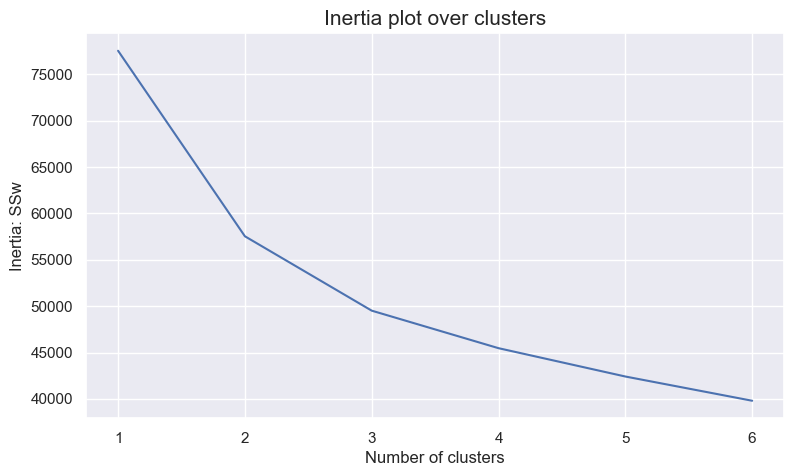

In [641]:
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(range_clusters, inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

With the elbow method we can suspect 2 clusters or 3 so we decided to calculate the silhoutte score to make sure we got the optimal number of clusters 

In [642]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=100, random_state=1)
    cluster_labels = kmclust.fit_predict(numerical_final_df)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(numerical_final_df, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")


For n_clusters = 2, the average silhouette_score is : 0.2225457937302105
For n_clusters = 3, the average silhouette_score is : 0.18590127281689783
For n_clusters = 4, the average silhouette_score is : 0.16218763889092963
For n_clusters = 5, the average silhouette_score is : 0.14917228506742058
For n_clusters = 6, the average silhouette_score is : 0.15494815635016698


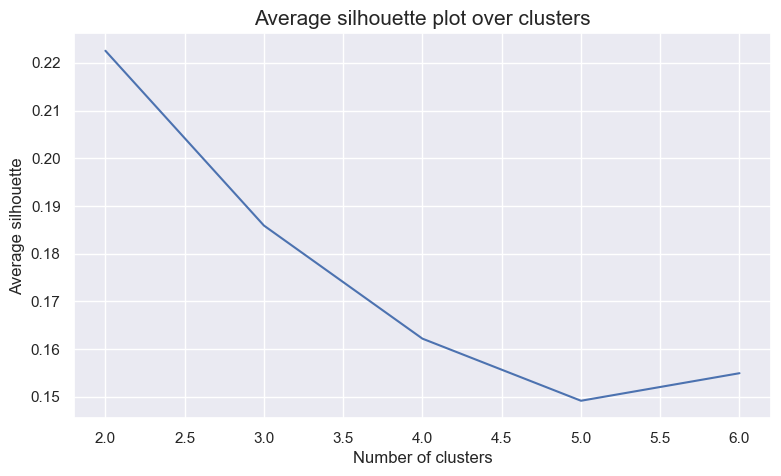

In [643]:
# The average silhouette plot
plt.figure(figsize=(9,5))
plt.plot(range_clusters[1:], avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

So we can say that the number of clusters should be 2

In [644]:
#final cluster solution
number_clusters = 2
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(numerical_final_df)
km_labels

array([1, 0, 0, ..., 1, 0, 1])

In [645]:
# Characterizing the final clusters
df_kmeans = pd.concat((numerical_final_df, pd.Series(km_labels, name='km2labels', index=numerical_final_df.index)), axis=1)
complete_df_kmeans = pd.concat((final_df_ohc, pd.Series(km_labels, name='km2labels', index=final_df_ohc.index)), axis=1)
df_kmeans_means=df_kmeans.groupby('km2labels').mean()
df_kmeans_means['Labels_2'] = df_kmeans_means.index 
df_kmeans_means

,yeojohn_YearsAsCust,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_Yearly_cust_value,Labels_2
km2labels,,,,,,,,,
0,-0.024868,-0.812260,0.554017,0.520880,0.606181,0.587474,-0.199184,0.061182,0
1,0.026003,0.820183,-0.559661,-0.494303,-0.591511,-0.573091,0.202261,-0.059872,1


In [646]:
ind=pd.DataFrame(numerical_final_df.index)
Rawdf_kmeans = df.loc[ind['CustID']]
Rawdf_kmeans=pd.concat((Rawdf_kmeans, pd.Series(km_labels, name='km2labels', index=Rawdf_kmeans.index)), axis=1)
Rawdf_kmeans_mean=Rawdf_kmeans.groupby('km2labels').mean()
Rawdf_kmeans_mean

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
km2labels,,,,,,,,,,,,,
0,1986.174426,1971.514371,2.165868,2313.796722,2.722344,0.621206,232.619195,0.709348,182.903530,331.184513,206.478948,67.480787,65.987429
1,1985.850000,1964.644479,2.792523,2685.171927,2.703986,0.792205,201.905008,0.652735,410.694125,79.115778,130.082372,15.644009,15.444680


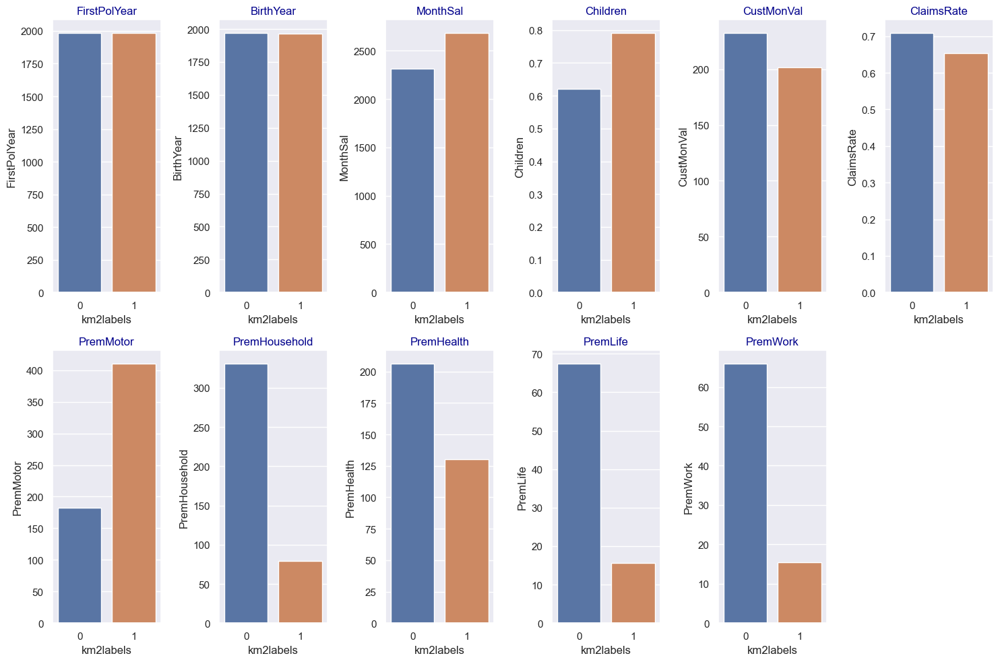

In [647]:
#visualization of the metric features of each cluster 
features=['FirstPolYear','BirthYear','MonthSal','Children','CustMonVal','ClaimsRate','PremMotor','PremHousehold','PremHealth','PremLife','PremWork']
plt.figure(figsize=(15,10))
for i,j in enumerate(features):
    plt.subplot(2,6,i+1)
    sns.barplot(Rawdf_kmeans_mean.index,Rawdf_kmeans_mean[j])
    plt.title(j,fontdict={'color':'darkblue'})
plt.tight_layout()
plt.show()

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'yeojohn_YearsAsCust'),
  Text(1, 0, 'yeojohn_PremMotor'),
  Text(2, 0, 'yeojohn_PremHousehold'),
  Text(3, 0, 'yeojohn_PremHealth'),
  Text(4, 0, 'yeojohn_PremLife'),
  Text(5, 0, 'yeojohn_PremWork'),
  Text(6, 0, 'yeojohn_Yearly_Salary'),
  Text(7, 0, 'yeojohn_Yearly_cust_value')])

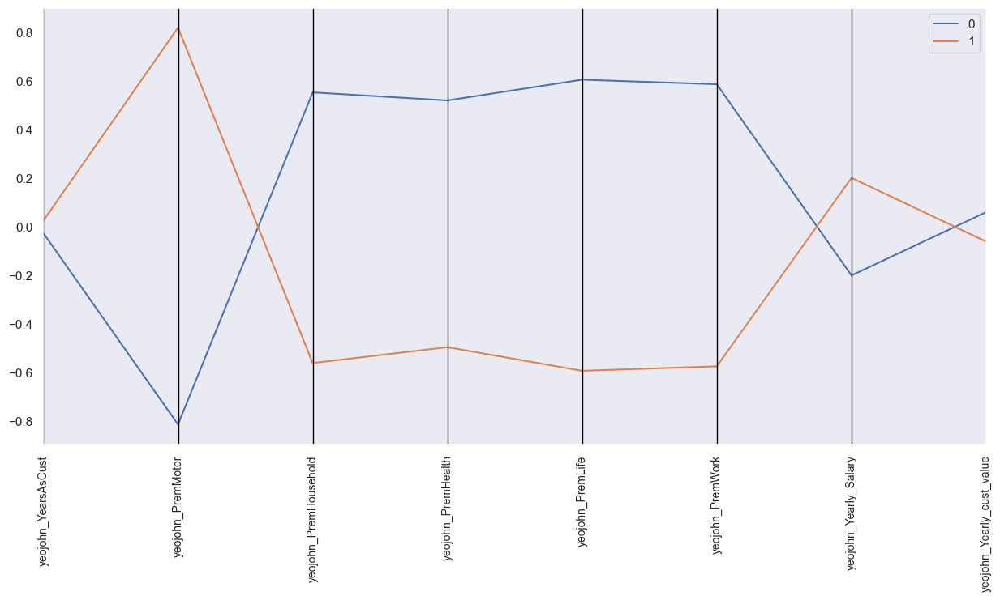

In [648]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(df_kmeans_means, class_column = 'Labels_2', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=90)

In [649]:
df_kmeans.km2labels.value_counts()

1    5118
0    5017
Name: km2labels, dtype: int64

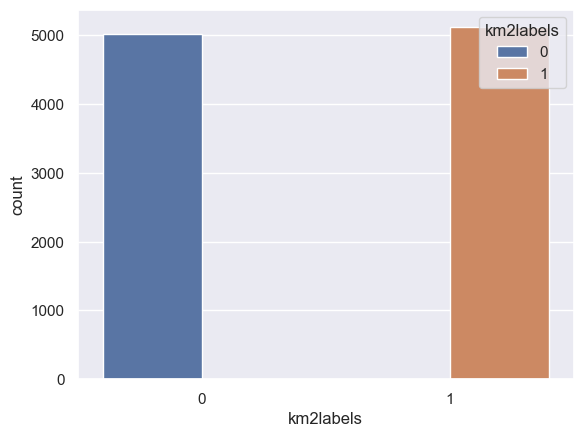

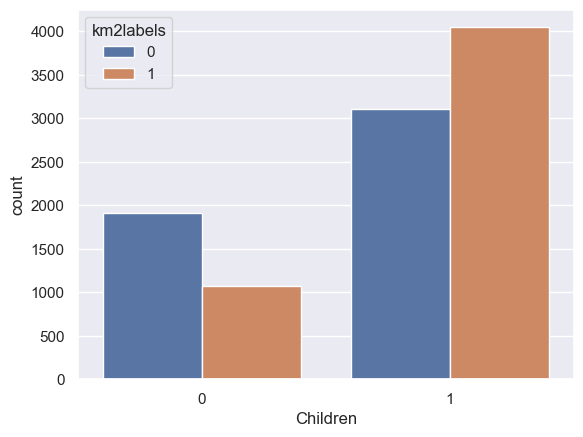

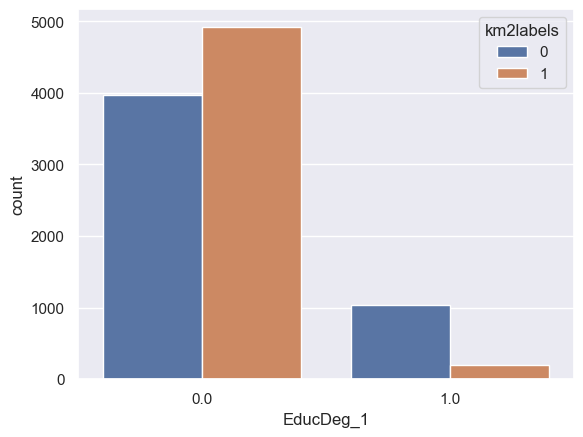

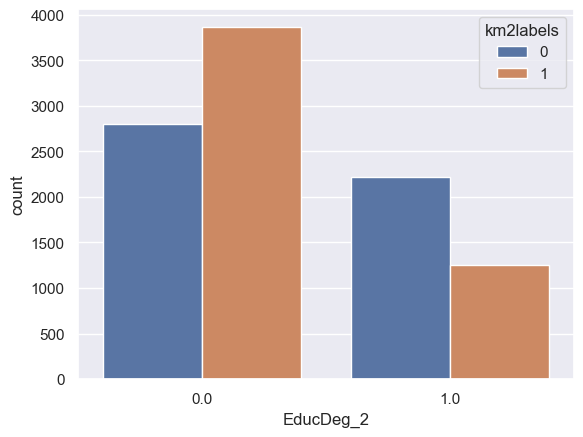

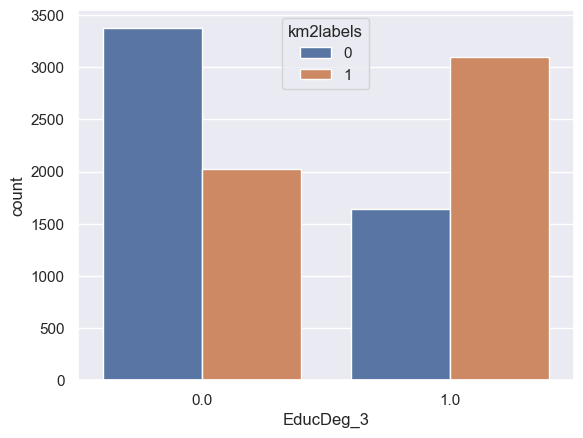

...

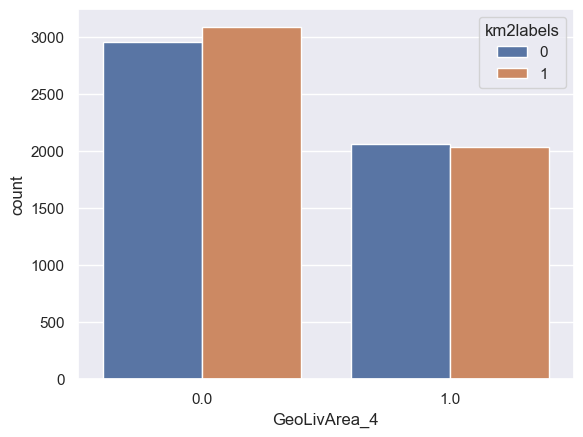

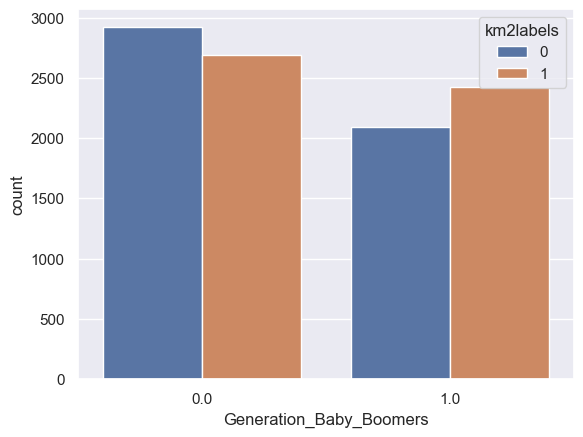

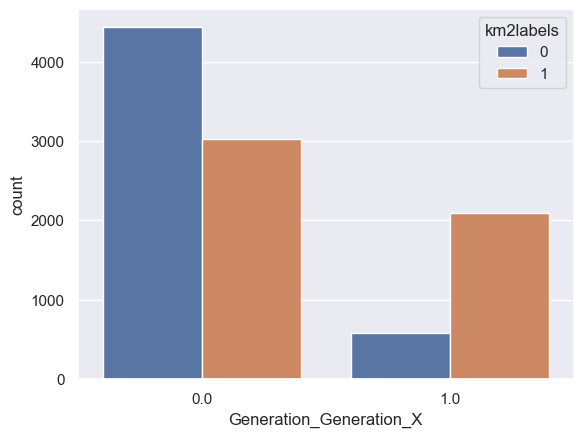

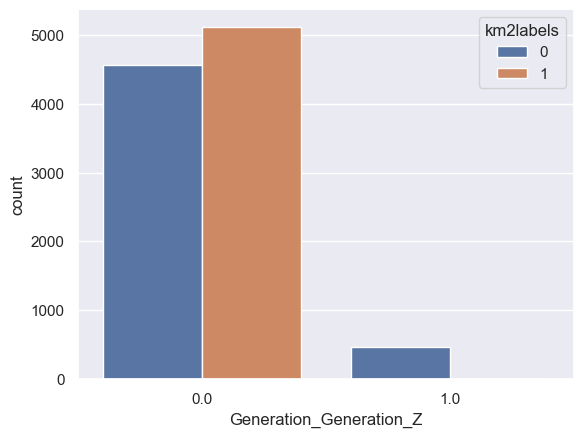

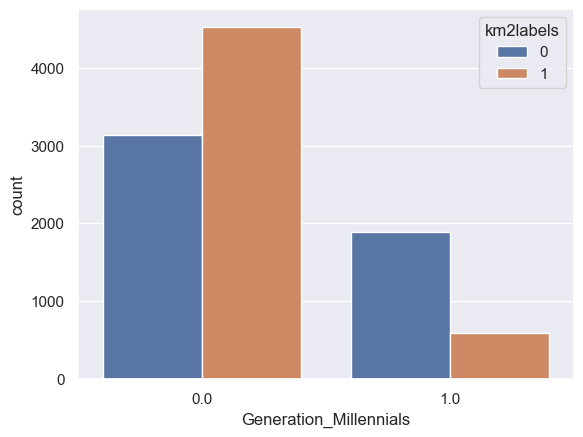

In [650]:

cat_var=['km2labels','Children','EducDeg_1','EducDeg_2','EducDeg_3','EducDeg_4','GeoLivArea_1','GeoLivArea_2','GeoLivArea_3','GeoLivArea_4','Generation_Baby_Boomers','Generation_Generation_X','Generation_Generation_Z','Generation_Millennials']
# Loop through the categorical variables and create a count plot for each one
for var in cat_var:
    sns.countplot(x=var, hue='km2labels', data=complete_df_kmeans)
    plt.show()

In [651]:
# using R²
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

sst = get_ss(df_kmeans)  # get total sum of squares
ssw_labels = df_kmeans.groupby(by='km2labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  
r2 = ssb / sst
r2

0.2814613506144612

# 5.2. K-means Clustering with Perspectives<a class="anchor" id="5.2"></a>

In [652]:
from sklearn.base import clone

def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust


# Set up the clusterers
kmeans = KMeans(
    init='k-means++',
    n_init=20,
    random_state=42
)

hierarchical = AgglomerativeClustering(
    affinity='euclidean'
)

In [653]:
# Obtaining the R² scores for each cluster solution on value variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_scaled_val, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_scaled_val, hierarchical.set_params(linkage=linkage)
    )

pd.DataFrame(r2_scores)

,kmeans,complete,average,single,ward
2,0.281873,0.078811,0.071436,0.001062,0.252294
3,0.444225,0.294391,0.089017,0.001856,0.393058
4,0.562702,0.305848,0.100185,0.002354,0.521955
5,0.636249,0.419016,0.100386,0.002739,0.595980
6,0.678576,0.513926,0.337631,0.003460,0.629504
7,0.707725,0.521218,0.451941,0.003783,0.656511
8,0.729138,0.552679,0.456816,0.004652,0.682291
9,0.748839,0.611488,0.503685,0.005139,0.706175


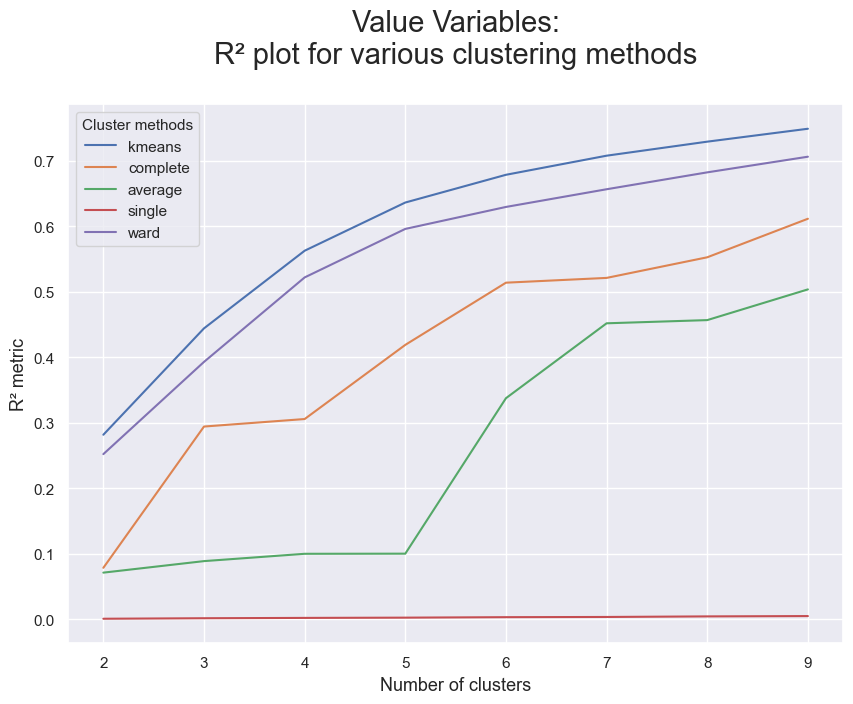

In [654]:
# Visualizing the R² scores for each cluster solution on personalvalue variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Value Variables:\nR² plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R² metric", fontsize=13)
plt.show()


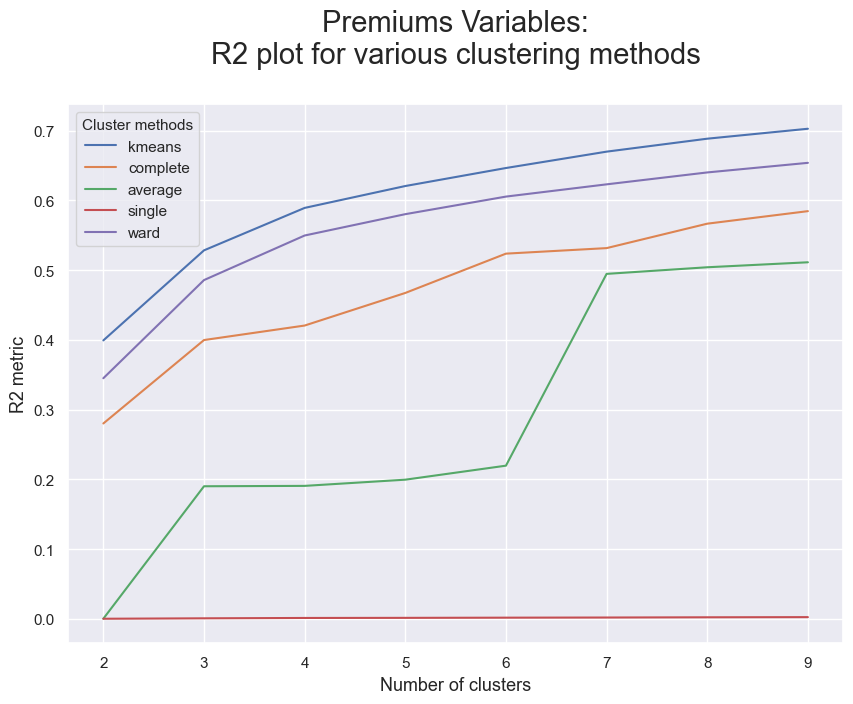

In [655]:
# Obtaining the R² scores for each cluster solution on premium variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_scaled_prem, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_scaled_prem, hierarchical.set_params(linkage=linkage)
    )

# Visualizing the R² scores for each cluster solution on product variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Premiums Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

In [656]:
# Applying the right clustering (algorithm and number of clusters) for each perspective
kmeans_prem = KMeans(
    n_clusters=3,
    init='k-means++',
    n_init=20,
    random_state=42
)
prem_labels = kmeans_prem.fit_predict(df_scaled_prem)

kmeans_val = KMeans(
    n_clusters=3,
    init='k-means++',
    n_init=20,
    random_state=42
)
Value_labels = kmeans_val.fit_predict(df_scaled_val)

Km_perspective= numerical_final_df.copy()

Km_perspective['Prem_labels'] = prem_labels
Km_perspective['Val_labels'] = Value_labels

In [657]:
# Count label frequencies (contigency table)
Km_perspective.groupby(['Prem_labels', 'Val_labels'])\
    .size()\
    .to_frame()\
    .reset_index()\
    .pivot('Prem_labels', 'Val_labels', 0)

Val_labels,0,1,2
Prem_labels,,,
0,1361,1659,1443
1,876,1334,1348
2,1038,398,678


In [658]:
num_feat=Km_perspective.columns.tolist()

In [659]:
# Centroids of the concatenated cluster labels
df_centroids = Km_perspective.groupby(['Prem_labels', 'Val_labels'])\
    [num_feat].mean()
df_centroids

yeojohn_YearsAsCust  yeojohn_PremMotor  \
Prem_labels Val_labels                                           
0           0                      0.462122          -0.291771   
            1                      0.588729          -0.209873   
            2                     -1.089223          -0.213981   
1           0                      0.518113           1.045543   
            1                      0.703493           1.078993   
            2                     -1.009981           1.091171   
2           0                      0.369624          -1.447767   
            1                      0.662406          -0.935958   
            2                     -1.037994          -1.141937   

                        yeojohn_PremHousehold  yeojohn_PremHealth  \
Prem_labels Val_labels                                              
0           0                       -0.060870            0.799260   
            1                       -0.053217            0.661509   
            2                        0.014272            0.644627   
1           0                       -0.719840           -0.763844   
            1                       -0.684484           -0.902489   
            2                       -0.640528           -0.890035   
2           0                        1.208920            0.010578   
            1                        1.012148            0.048965   
            2                        1.202230            0.015237   

                        yeojohn_PremLife  yeojohn_PremWork  \
Prem_labels Val_labels                                       
0           0                   0.036153          0.052545   
            1                   0.065460          0.038939   
            2                   0.050064          0.035913   
1           0                  -0.764678         -0.733443   
            1                  -0.707715         -0.680363   
            2                  -0.737437         -0.720882   
2           0                   1.289414          1.258565   
            1                   0.922280          0.902744   
            2                   1.012307          1.006647   

                        yeojohn_Yearly_Salary  yeojohn_Yearly_cust_value  \
Prem_labels Val_labels                                                     
0           0                       -0.925991                  -0.274807   
            1                        0.954554                  -0.311836   
            2                        0.313751                   0.243772   
1           0                       -0.601638                  -0.276672   
            1                        0.593784                  -0.281091   
            2                        0.154460                   0.401740   
2           0                       -1.376717                  -0.099918   
            1                        0.934281                  -0.092219   
            2                       -0.230533                   1.115515   

                        Prem_labels  Val_labels  
Prem_labels Val_labels                           
0           0                   0.0         0.0  
            1                   0.0         1.0  
            2                   0.0         2.0  
1           0                   1.0         0.0  
            1                   1.0         1.0  
            2                   1.0         2.0  
2           0                   2.0         0.0  
            1                   2.0         1.0  
            2                   2.0         2.0

In [660]:
# Using Hierarchical clustering to merge the concatenated cluster centroids
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    distance_threshold=0, 
    n_clusters=None
)
hclust_labels = hclust.fit_predict(df_centroids)

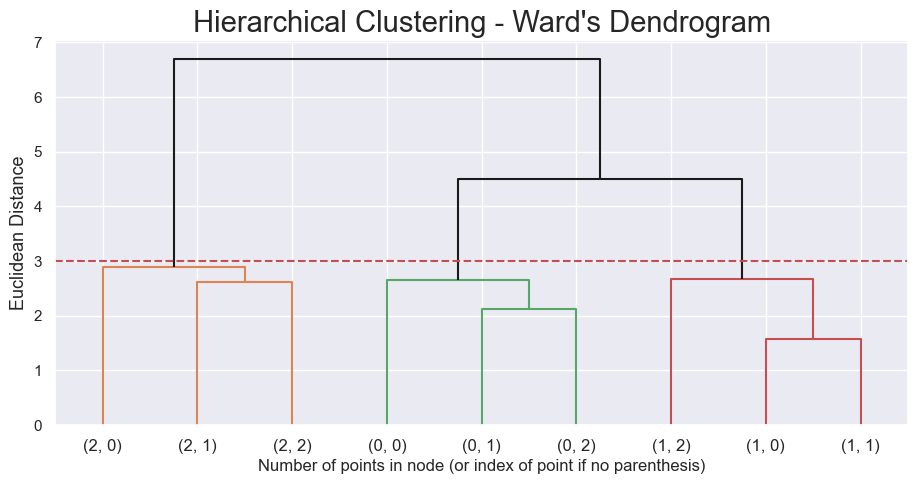

In [661]:
# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 3
dendrogram(linkage_matrix, truncate_mode='level', labels=df_centroids.index, p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [662]:
# Re-running the Hierarchical clustering based on the correct number of clusters
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=3
)
hclust_labels = hclust.fit_predict(df_centroids)
df_centroids['hclust_labels'] = hclust_labels

df_centroids  # centroid's cluster labels

yeojohn_YearsAsCust  yeojohn_PremMotor  \
Prem_labels Val_labels                                           
0           0                      0.462122          -0.291771   
            1                      0.588729          -0.209873   
            2                     -1.089223          -0.213981   
1           0                      0.518113           1.045543   
            1                      0.703493           1.078993   
            2                     -1.009981           1.091171   
2           0                      0.369624          -1.447767   
            1                      0.662406          -0.935958   
            2                     -1.037994          -1.141937   

                        yeojohn_PremHousehold  yeojohn_PremHealth  \
Prem_labels Val_labels                                              
0           0                       -0.060870            0.799260   
            1                       -0.053217            0.661509   
            2                        0.014272            0.644627   
1           0                       -0.719840           -0.763844   
            1                       -0.684484           -0.902489   
            2                       -0.640528           -0.890035   
2           0                        1.208920            0.010578   
            1                        1.012148            0.048965   
            2                        1.202230            0.015237   

                        yeojohn_PremLife  yeojohn_PremWork  \
Prem_labels Val_labels                                       
0           0                   0.036153          0.052545   
            1                   0.065460          0.038939   
            2                   0.050064          0.035913   
1           0                  -0.764678         -0.733443   
            1                  -0.707715         -0.680363   
            2                  -0.737437         -0.720882   
2           0                   1.289414          1.258565   
            1                   0.922280          0.902744   
            2                   1.012307          1.006647   

                        yeojohn_Yearly_Salary  yeojohn_Yearly_cust_value  \
Prem_labels Val_labels                                                     
0           0                       -0.925991                  -0.274807   
            1                        0.954554                  -0.311836   
            2                        0.313751                   0.243772   
1           0                       -0.601638                  -0.276672   
            1                        0.593784                  -0.281091   
            2                        0.154460                   0.401740   
2           0                       -1.376717                  -0.099918   
            1                        0.934281                  -0.092219   
            2                       -0.230533                   1.115515   

                        Prem_labels  Val_labels  hclust_labels  
Prem_labels Val_labels                                          
0           0                   0.0         0.0              2  
            1                   0.0         1.0              2  
            2                   0.0         2.0              2  
1           0                   1.0         0.0              1  
            1                   1.0         1.0              1  
            2                   1.0         2.0              1  
2           0                   2.0         0.0              0  
            1                   2.0         1.0              0  
            2                   2.0         2.0              0

In [663]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids['hclust_labels'].to_dict()

df_ = Km_perspective.copy()

# Mapping the hierarchical clusters on the centroids to the observations
df_['merged_labels'] = df_.apply(
    lambda row: cluster_mapper[
        (row['Prem_labels'], row['Val_labels'])
    ], axis=1
)

# Merged cluster centroids
df_.groupby('merged_labels').mean()[num_feat]

,yeojohn_YearsAsCust,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_Yearly_cust_value,Prem_labels,Val_labels
merged_labels,,,,,,,,,,
0,-0.026704,-1.253324,1.169728,0.019299,1.131421,1.110780,-0.574025,0.291344,2.0,0.829707
1,0.008677,1.075371,-0.676535,-0.863636,-0.733000,-0.708783,0.133020,-0.021302,1.0,1.132659
2,0.007596,-0.236176,-0.033730,0.698058,0.051545,0.042110,0.173891,-0.120902,0.0,1.018373


In [664]:
#Merge cluster contigency table
# Getting size of each final cluster
df_counts = df_.groupby('merged_labels')\
    .size()\
    .to_frame()

# Getting the product and behavior labels
df_counts = df_counts\
    .rename({v:k for k, v in cluster_mapper.items()})\
    .reset_index()

df_counts['Prem_labels'] = df_counts['merged_labels'].apply(lambda x: x[0])
df_counts['Val_labels'] = df_counts['merged_labels'].apply(lambda x: x[1])
df_counts.pivot('Prem_labels', 'Val_labels', 0)

Val_labels,2
Prem_labels,
0,4463
1,3558
2,2114


In [665]:
df_means=df_.groupby('merged_labels').mean()
df_merged_means = df_means.reset_index()
Kdf_merged_means=df_merged_means[['merged_labels','yeojohn_YearsAsCust','yeojohn_PremMotor','yeojohn_PremHousehold','yeojohn_PremHealth','yeojohn_PremLife','yeojohn_PremWork','yeojohn_Yearly_Salary','yeojohn_Yearly_cust_value']]

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'yeojohn_YearsAsCust'),
  Text(1, 0, 'yeojohn_PremMotor'),
  Text(2, 0, 'yeojohn_PremHousehold'),
  Text(3, 0, 'yeojohn_PremHealth'),
  Text(4, 0, 'yeojohn_PremLife'),
  Text(5, 0, 'yeojohn_PremWork'),
  Text(6, 0, 'yeojohn_Yearly_Salary'),
  Text(7, 0, 'yeojohn_Yearly_cust_value')])

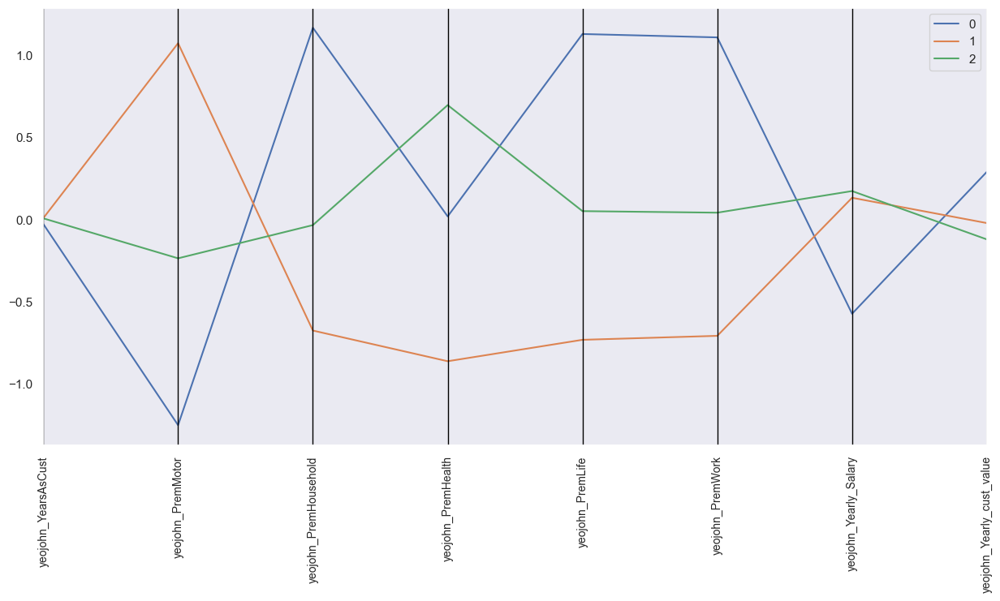

In [666]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(Kdf_merged_means, class_column = 'merged_labels', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=90)

In [667]:
# using R²
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

sst = get_ss(df_)  # get total sum of squares
ssw_labels = df_.groupby(by='merged_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  
r2 = ssb / sst
r2

0.4089530909036929

#  5.3. Hierarchical Clustering<a class="anchor" id="5.2"></a>

In [668]:
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions 
    given by the application of a hierarchical method.
    
    The R2 is a measure of the homogenity of a cluster solution. 
    It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    def get_ss(df):
        ss = np.sum(df.var() * (df.count() - 1))
        return ss  # return sum of sum of squares of each df variable
    
    sst = get_ss(df)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        
        
        hclabels = cluster.fit_predict(df) #get cluster labels
        
        
        df_concat = pd.concat((df, pd.Series(hclabels, name='labels', index=df.index)), axis=1)  # concat df with labels
        
        
        ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        
        
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        
        
        r2.append(ssb / sst)  # save the R2 of the given cluster solution
        
    return np.array(r2)

In [669]:
## This function plots the R2 values for each linkage method for cluster sizes from 1 to 10

def plot_r2_linkage(df, max_nclus):
    # Prepare input
    hc_methods = ["ward", "complete", "average", "single"]
    # Call function defined above to obtain the R2 statistic for each hc_method
    r2_hc_methods = np.vstack(
        [
            get_r2_hc(df=df, link_method=link, max_nclus=max_nclus) 
            for link in hc_methods
        ]
    ).T
    r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

    sns.set()
    # Plot data
    fig = plt.figure(figsize=(11,5))
    sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

    # Finalize the plot
    fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
    plt.gca().invert_xaxis()  # invert x axis
    plt.legend(title="HC methods", title_fontsize=11)
    plt.xticks(range(1, max_nclus + 1))
    plt.xlabel("Number of clusters", fontsize=13)
    plt.ylabel("R2 metric", fontsize=13)

    plt.show()

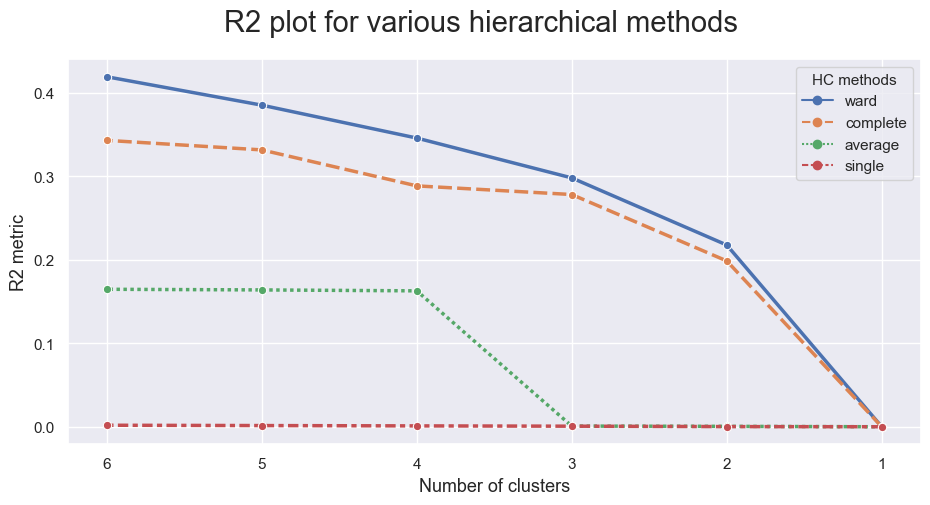

In [670]:
## Visualize R2 scores with variying linnkage methods and number of clusters 

max_nclus = 6
plot_r2_linkage(numerical_final_df, max_nclus)

In [671]:
# setting distance_threshold=0 and n_clusters=None ensures we compute the full tree

linkage = 'ward'
distance = 'euclidean'

hclust = AgglomerativeClustering(linkage=linkage, 
                                 affinity=distance, 
                                 distance_threshold=0, 
                                 n_clusters=None)

hclust.fit_predict(numerical_final_df)

array([7248, 6219, 9027, ...,    2,    1,    0], dtype=int64)

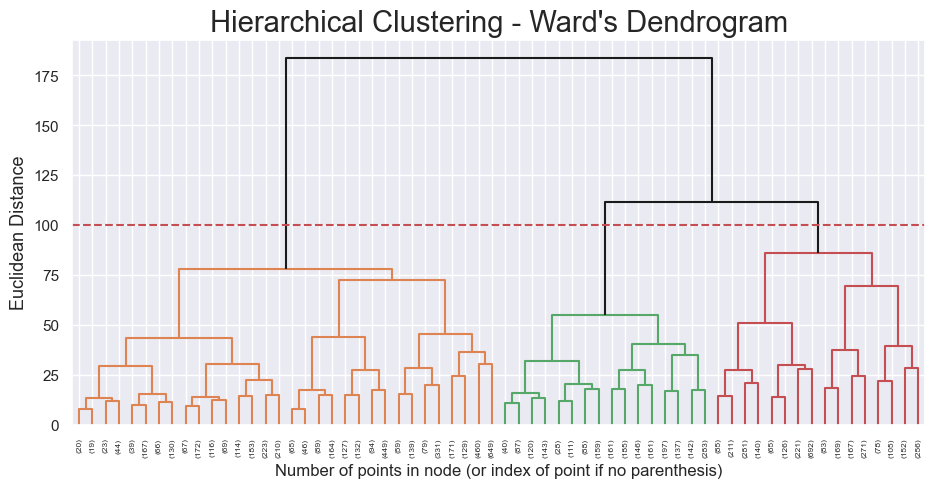

In [672]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

       
## Create linkage matrix

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)


# Plot the corresponding dendrogram

sns.set()
fig = plt.figure(figsize=(11,5))


# The Dendrogram parameters need to be tuned
y_threshold = 100


# "dendrogram" function will plot our dendrogram
dendrogram(linkage_matrix, 
           truncate_mode='level', 
           p=5, 
           color_threshold=y_threshold, 
           above_threshold_color='k')

plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()



In [673]:
# 3 cluster solution
linkage = 'ward'
distance = 'euclidean'
hc3lust = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=3)
hc3_labels = hc3lust.fit_predict(numerical_final_df)

In [674]:
# Characterizing the 3 clusters
df_HC = pd.concat((numerical_final_df, pd.Series(hc3_labels, name='hc3_labels', index=numerical_final_df.index)), axis=1)
complete_df_HC=pd.concat((final_df_ohc, pd.Series(hc3_labels, name='hc3_labels', index=final_df_ohc.index)), axis=1)
df_HC_means=df_HC.groupby('hc3_labels').mean()
df_HC_means['Labels_2'] = df_HC_means.index 
df_HC_means


,yeojohn_YearsAsCust,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_Yearly_cust_value,Labels_2
hc3_labels,,,,,,,,,
0,-0.013151,-0.928937,0.665791,0.401457,0.722271,0.723624,-0.914772,0.178032,0
1,0.109334,0.795016,-0.510742,-0.482805,-0.597020,-0.566030,0.149041,0.018666,1
2,-0.219656,-0.387431,0.148271,0.538065,0.304355,0.234008,0.983268,-0.293494,2


In [675]:

ind=pd.DataFrame(numerical_final_df.index)
Rawdf_HC = df.loc[ind['CustID']]
Rawdf_HC=pd.concat((Rawdf_HC, pd.Series(hc3_labels, name='hc3_labels', index=Rawdf_HC.index)), axis=1)

Rawdf_HC_mean=Rawdf_HC.groupby('hc3_labels').mean()
Rawdf_HC_mean

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
hc3_labels,,,,,,,,,,,,,
0,1986.089441,1984.110429,2.084194,1610.252587,2.700193,0.791667,263.239974,0.691212,168.313424,368.018182,197.299110,75.304391,74.069874
1,1985.296396,1965.521200,2.777502,2630.107867,2.698658,0.813198,225.379934,0.622658,407.214712,89.854613,131.151344,15.893628,15.840815
2,1987.480734,1950.871912,2.393495,3478.764895,2.763254,0.354396,133.393122,0.794598,239.714817,223.733661,207.594314,49.368510,47.345201


(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'yeojohn_YearsAsCust'),
  Text(1, 0, 'yeojohn_PremMotor'),
  Text(2, 0, 'yeojohn_PremHousehold'),
  Text(3, 0, 'yeojohn_PremHealth'),
  Text(4, 0, 'yeojohn_PremLife'),
  Text(5, 0, 'yeojohn_PremWork'),
  Text(6, 0, 'yeojohn_Yearly_Salary'),
  Text(7, 0, 'yeojohn_Yearly_cust_value')])

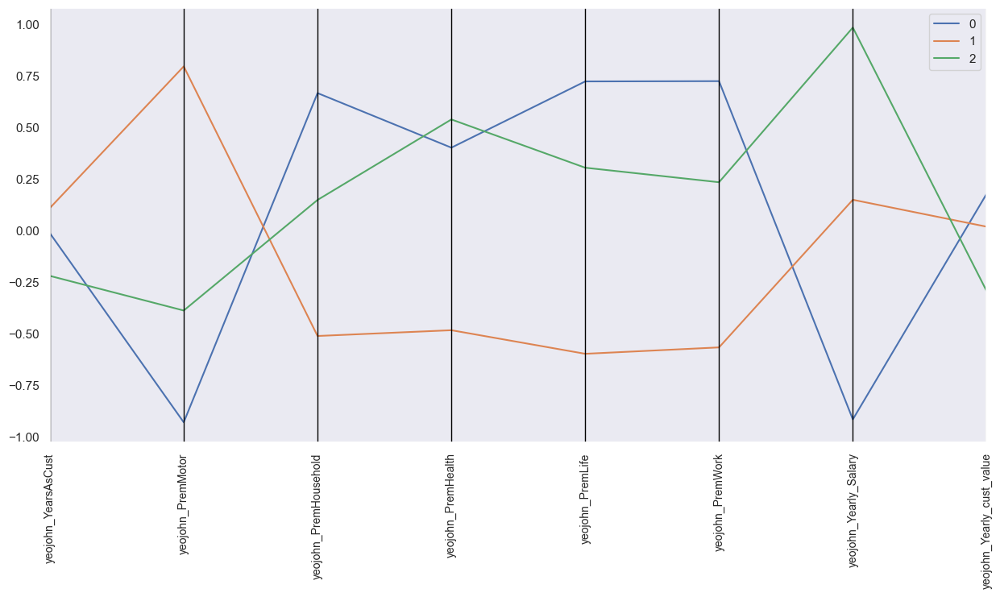

In [676]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(df_HC_means, class_column = 'Labels_2', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=90)

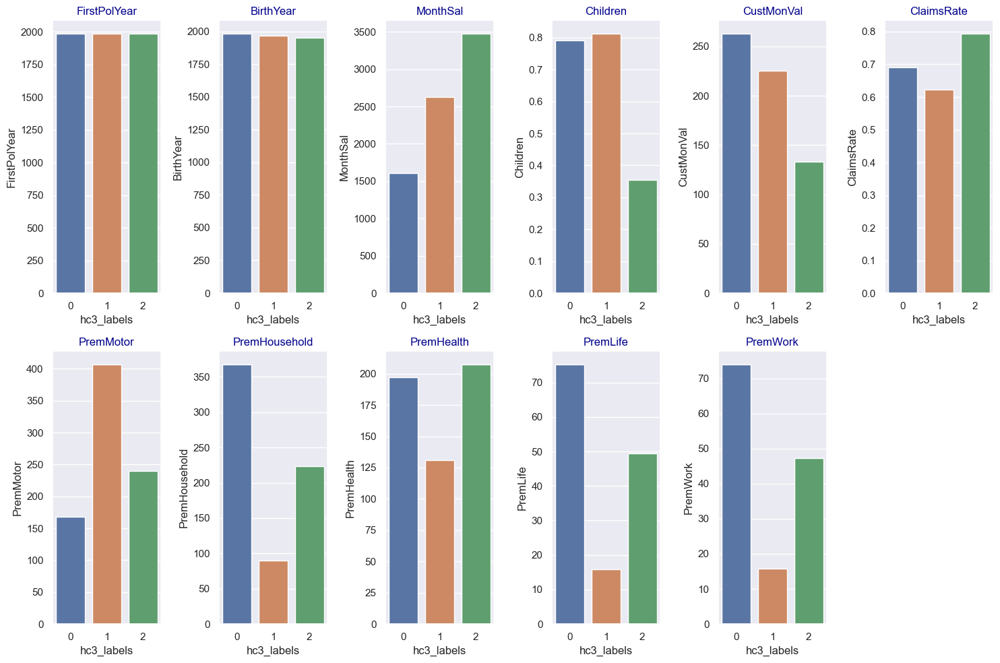

In [677]:
#visualization of the metric features of each cluster 
features=features=['FirstPolYear','BirthYear','MonthSal','Children','CustMonVal','ClaimsRate','PremMotor','PremHousehold','PremHealth','PremLife','PremWork']
plt.figure(figsize=(15,10))
for i,j in enumerate(features):
    plt.subplot(2,6,i+1)
    sns.barplot(Rawdf_HC_mean.index,Rawdf_HC_mean[j])
    plt.title(j,fontdict={'color':'darkblue'})
plt.tight_layout()
plt.show()

In [678]:
df_HC.hc3_labels.value_counts()

1    4845
0    3102
2    2188
Name: hc3_labels, dtype: int64

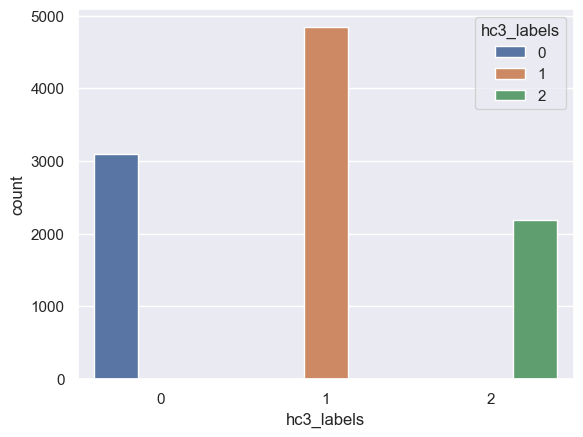

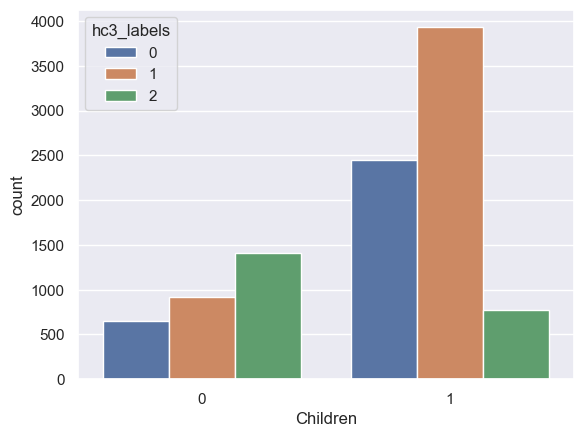

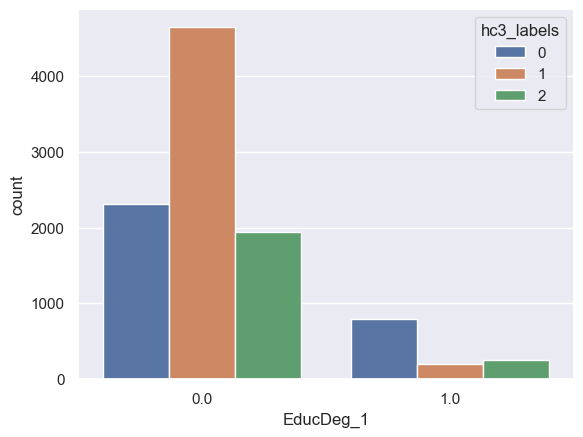

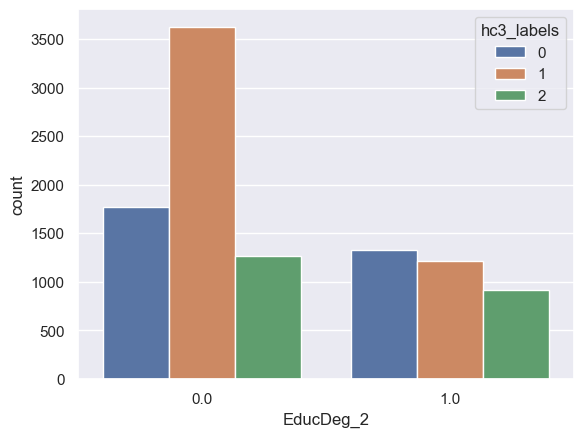

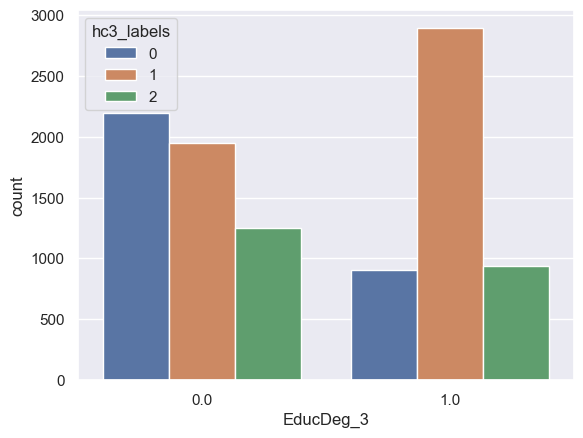

...

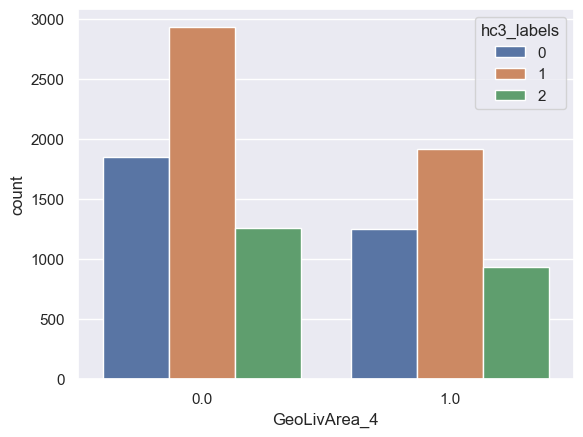

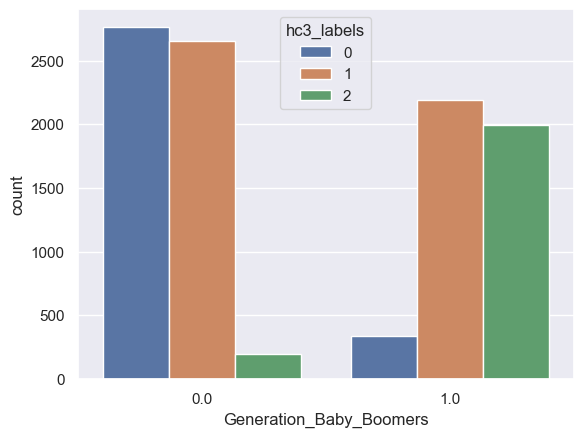

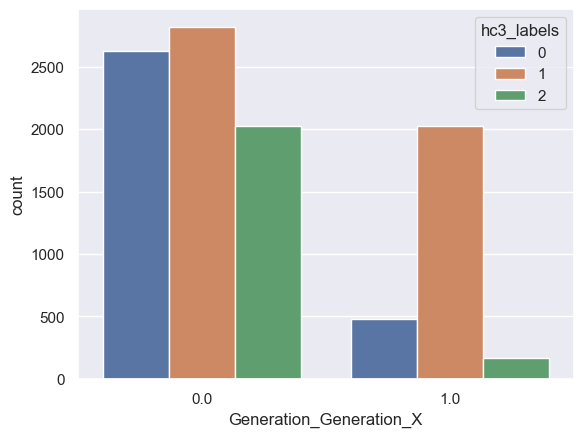

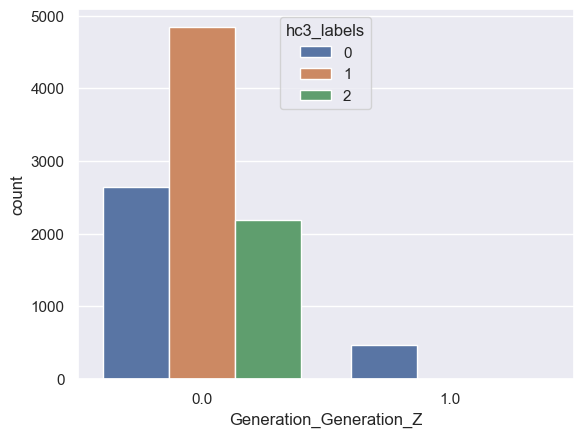

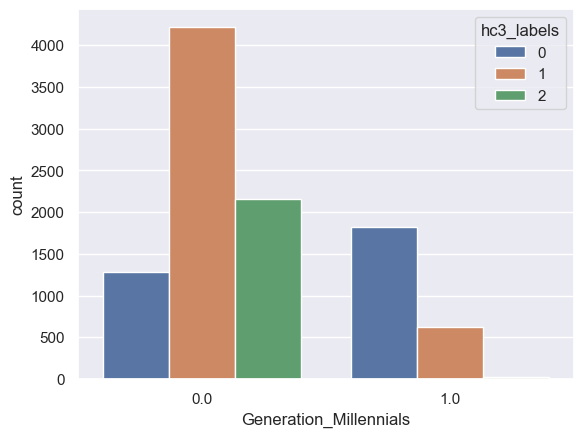

In [679]:
cat_var=['hc3_labels','Children','EducDeg_1','EducDeg_2','EducDeg_3','EducDeg_4','GeoLivArea_1','GeoLivArea_2','GeoLivArea_3','GeoLivArea_4','Generation_Baby_Boomers','Generation_Generation_X','Generation_Generation_Z','Generation_Millennials']
# Loop through the categorical variables and create a count plot for each one
for var in cat_var:
    sns.countplot(x=var, hue='hc3_labels', data=complete_df_HC)
    plt.show()

In [680]:
# using R²
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

sst = get_ss(df_HC)  # get total sum of squares
ssw_labels = df_HC.groupby(by='hc3_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  
r2 = ssb / sst
r2

0.3424668721682257

#  5.4. DBSCAN Clustering<a class="anchor" id="5.4"></a>

In [681]:
# Perform DBSCAN clustering with different eps values
for i in np.arange(0.6, 2, 0.1):
    dbscan = DBSCAN(eps=i, min_samples=16, n_jobs=4)              #min_samples = 2 x dim
    dbscan_labels = dbscan.fit_predict(numerical_final_df)

    dbscan_n_clusters = len(np.unique(dbscan_labels))
    print("Number of estimated clusters with eps =", np.round(i,2),":", dbscan_n_clusters)

Number of estimated clusters with eps = 0.6 : 8
Number of estimated clusters with eps = 0.7 : 9
Number of estimated clusters with eps = 0.8 : 2
Number of estimated clusters with eps = 0.9 : 2
Number of estimated clusters with eps = 1.0 : 2
Number of estimated clusters with eps = 1.1 : 2
Number of estimated clusters with eps = 1.2 : 2
Number of estimated clusters with eps = 1.3 : 2
Number of estimated clusters with eps = 1.4 : 2
Number of estimated clusters with eps = 1.5 : 2
Number of estimated clusters with eps = 1.6 : 2
Number of estimated clusters with eps = 1.7 : 2
Number of estimated clusters with eps = 1.8 : 2
Number of estimated clusters with eps = 1.9 : 2


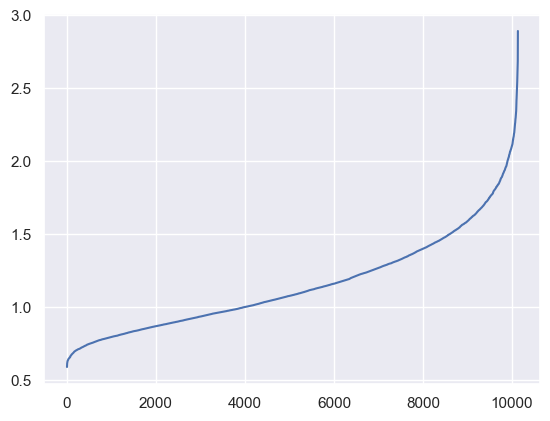

In [682]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)             # k= minPts - 1
neigh.fit(numerical_final_df)
distances, _ = neigh.kneighbors(numerical_final_df)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show(fig)

Based on the K-distance graph, the elbow is around 1.7 so the optimal value for eps is 1.7

In [683]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=1.7, min_samples=16, n_jobs=4)            #minPts = 2 x dim
dbscan_labels = dbscan.fit_predict(numerical_final_df)
dbscan_labels
dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 2


In [684]:
df_HC = pd.concat((numerical_final_df, pd.Series(hc3_labels, name='hc3_labels', index=numerical_final_df.index)), axis=1)
complete_df_HC=pd.concat((final_df_ohc, pd.Series(hc3_labels, name='hc3_labels', index=final_df_ohc.index)), axis=1)
df_HC_means=df_HC.groupby('hc3_labels').mean()
df_HC_means['Labels_2'] = df_HC_means.index 
df_HC_means


,yeojohn_YearsAsCust,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_Yearly_cust_value,Labels_2
hc3_labels,,,,,,,,,
0,-0.013151,-0.928937,0.665791,0.401457,0.722271,0.723624,-0.914772,0.178032,0
1,0.109334,0.795016,-0.510742,-0.482805,-0.597020,-0.566030,0.149041,0.018666,1
2,-0.219656,-0.387431,0.148271,0.538065,0.304355,0.234008,0.983268,-0.293494,2


In [685]:
# Characterizing the 3 clusters
df_dbscan = pd.concat((numerical_final_df, pd.Series(dbscan_labels, name='dbscan_labels', index=numerical_final_df.index)), axis=1)
complete_df_dbscan= pd.concat((final_df_ohc, pd.Series(dbscan_labels, name='dbscan_labels', index=final_df_ohc.index)), axis=1)
df_dbscan_means= df_dbscan.groupby('dbscan_labels').mean()
df_dbscan_means['Labels_2'] = df_dbscan_means.index 
df_dbscan_means

,yeojohn_YearsAsCust,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_Yearly_cust_value,Labels_2
dbscan_labels,,,,,,,,,
-1,-0.115539,-1.337821,1.526467,-0.605285,0.591527,0.809613,-0.600302,1.261594,-1
0,0.001584,0.020944,-0.018432,0.012252,-0.002501,-0.003889,0.007497,-0.008217,0


In [686]:
# See the clusters with the original values
ind=pd.DataFrame(numerical_final_df.index)
Rawdf_dbscan = df.loc[ind['CustID']]
Rawdf_dbscan=pd.concat((Rawdf_dbscan, pd.Series(dbscan_labels, name='dbscan_labels', index=Rawdf_dbscan.index)), axis=1)

Rawdf_dbscan_mean=Rawdf_dbscan.groupby('dbscan_labels').mean()
Rawdf_dbscan_mean

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
dbscan_labels,,,,,,,,,,,,,
-1,1986.727273,1978.939394,1.772727,1928.545455,2.515152,0.621212,536.882273,0.537273,117.675455,653.953030,125.773182,89.697121,103.366515
0,1986.005977,1967.974632,2.486919,2505.051106,2.714371,0.708101,215.013020,0.681700,299.115400,200.944121,168.176128,40.986904,40.051903


In [687]:
# Detecting noise (potential outliers)
Rawdf_dbscan.loc[Rawdf_dbscan['dbscan_labels'] == -1]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,dbscan_labels
CustID,,,,,,,,,,,,,,
185,1993.0,1984.0,2.0,2419.0,4.0,1.0,-62.23,1.07,0.00,253.95,230.60,5.89,43.12,-1
192,1996.0,1994.0,1.0,1486.0,2.0,0.0,872.07,0.12,106.02,587.90,76.46,22.45,225.60,-1
368,1977.0,1964.0,4.0,2936.0,4.0,1.0,-121.00,1.18,585.22,-35.00,5.78,-4.00,-11.00,-1
650,1991.0,1973.0,1.0,1688.0,3.0,0.0,1182.44,0.00,239.60,751.80,88.24,16.67,111.13,-1
718,1982.0,1972.0,3.0,2075.0,4.0,1.0,301.19,0.34,433.86,-75.00,129.58,-6.00,14.67,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9558,1988.0,2000.0,1.0,808.0,3.0,0.0,1387.39,0.05,22.56,1132.45,81.46,224.93,32.45,-1
9602,1980.0,1964.0,2.0,2823.0,3.0,1.0,433.53,0.35,198.26,160.60,76.57,8.89,260.27,-1
9650,1986.0,1997.0,1.0,845.0,1.0,1.0,-236.04,1.12,16.67,1434.15,76.46,191.48,19.56,-1


(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'yeojohn_YearsAsCust'),
  Text(1, 0, 'yeojohn_PremMotor'),
  Text(2, 0, 'yeojohn_PremHousehold'),
  Text(3, 0, 'yeojohn_PremHealth'),
  Text(4, 0, 'yeojohn_PremLife'),
  Text(5, 0, 'yeojohn_PremWork'),
  Text(6, 0, 'yeojohn_Yearly_Salary'),
  Text(7, 0, 'yeojohn_Yearly_cust_value')])

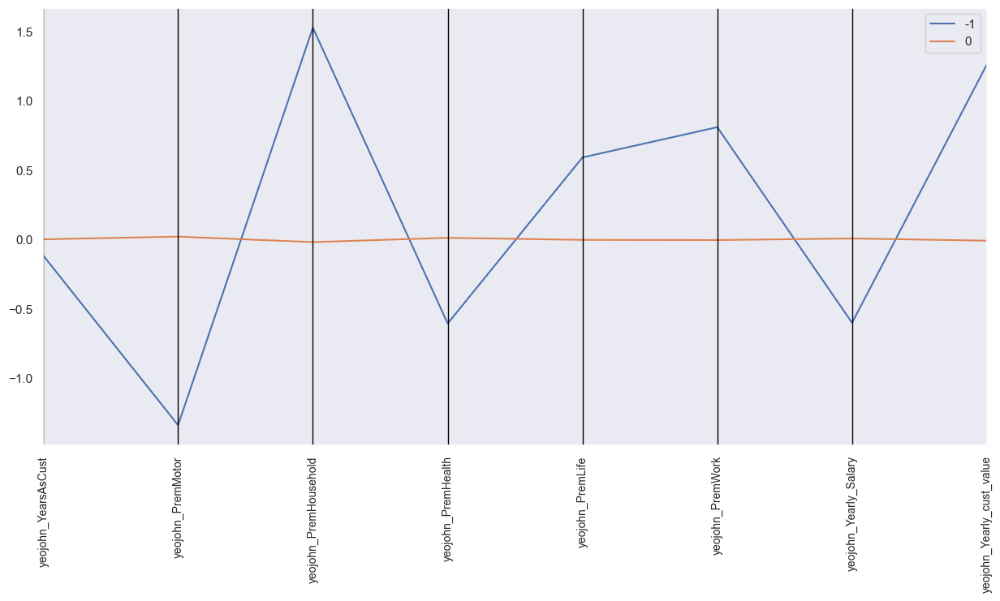

In [688]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(df_dbscan_means, class_column = 'Labels_2', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=90)

The DBScan divided the customers into 2 clusters: -1 for the outliers and 0 for the rest of the individuals.

In [689]:
# using R²
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

sst = get_ss(df_dbscan)  # get total sum of squares
ssw_labels = df_dbscan.groupby(by='dbscan_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  
r2 = ssb / sst
r2

0.007287261455780637

# 5.5. Self Organizing Maps <a class="anchor" id="5.5"></a>

In [690]:
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves
np.random.seed(42)

sm_numerical = sompy.SOMFactory().build(
    numerical_final_df.values, 
    mapsize=[50, 50],  
    initialization='random',
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=metric_features
)
sm_numerical.train(n_job=-1, verbose='info', train_rough_len=100, train_finetune_len=100)

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 17.000000 , radius_final: 2.833333, trainlen: 100

 epoch: 1 ---> elapsed time:  0.225000, quantization error: 1.901988

 epoch: 2 ---> elapsed time:  0.209000, quantization error: 2.666661

 epoch: 3 ---> elapsed time:  0.215000, quantization error: 2.629172

 epoch: 4 ---> elapsed time:  0.210000, quantization error: 2.621277

 epoch: 5 ---> elapsed time:  0.209000, quantization error: 2.618660

 epoch: 6 ---> elapsed time:  0.217000, quantization error: 2.616658

 epoch: 7 ---> elapsed time:  0.245000, quantization error: 2.614094

 epoch: 8 ---> elapsed time:  0.246000, quantization error: 2.609918

 epoch: 9 ---> elapsed time:  0.211000, quantization error: 2.607757

 epoch: 10 ---> elapsed time:  0.233000, quantization error: 2.606510

 epoch: 11 ---> elapsed time:  0.241000, quantization error: 2.604971

 epoch: 12 ---> elapsed time:  0.251000, quantization error: 2.602047

 epoch: 13 --->

 epoch: 14 ---> elapsed time:  0.207000, quantization error: 1.988361

 epoch: 15 ---> elapsed time:  0.220000, quantization error: 1.981935

 epoch: 16 ---> elapsed time:  0.219000, quantization error: 1.975384

 epoch: 17 ---> elapsed time:  0.219000, quantization error: 1.968729

 epoch: 18 ---> elapsed time:  0.232000, quantization error: 1.962175

 epoch: 19 ---> elapsed time:  0.225000, quantization error: 1.955527

 epoch: 20 ---> elapsed time:  0.216000, quantization error: 1.948891

 epoch: 21 ---> elapsed time:  0.216000, quantization error: 1.942084

 epoch: 22 ---> elapsed time:  0.234000, quantization error: 1.935323

 epoch: 23 ---> elapsed time:  0.219000, quantization error: 1.928560

 epoch: 24 ---> elapsed time:  0.216000, quantization error: 1.921686

 epoch: 25 ---> elapsed time:  0.217000, quantization error: 1.914696

 epoch: 26 ---> elapsed time:  0.217000, quantization error: 1.907691

 epoch: 27 ---> elapsed time:  0.217000, quantization error: 1.900590

 epoch

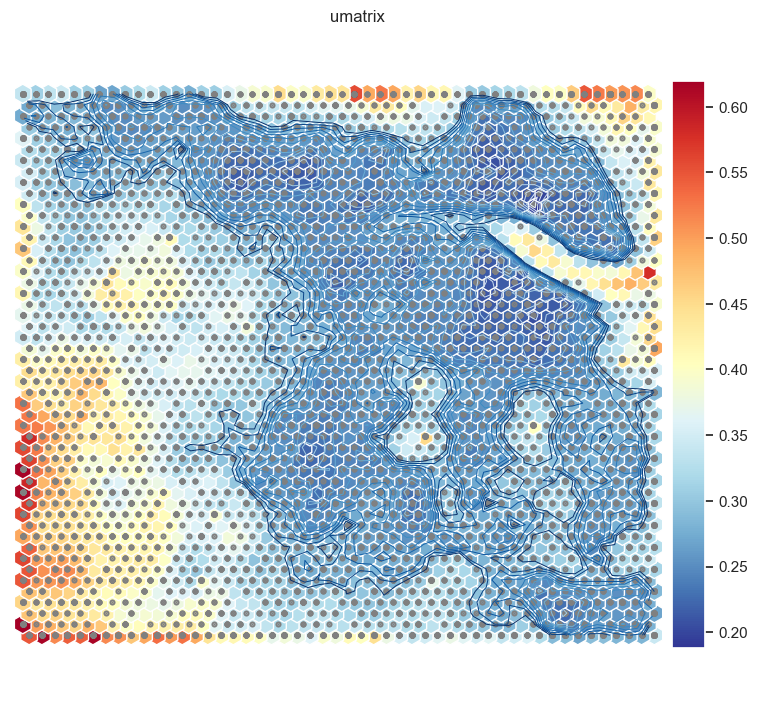

array([[0.33796601, 0.31064287, 0.33586298, ..., 0.50747403, 0.51397599,
        0.39762106],
       [0.27345336, 0.28497554, 0.29158933, ..., 0.48797371, 0.42832116,
        0.41702982],
       [0.27237286, 0.27112307, 0.2830912 , ..., 0.45632474, 0.43624654,
        0.4136167 ],
       ...,
       [0.47119576, 0.44812243, 0.45804442, ..., 0.25780853, 0.26263364,
        0.26765714],
       [0.61958322, 0.49865952, 0.4861892 , ..., 0.24769176, 0.25291619,
        0.28159487],
       [0.54727833, 0.61581165, 0.51435797, ..., 0.27873465, 0.28264952,
        0.34200493]])

In [691]:
# Here you have U-matrix
u = sompy.umatrix.UMatrixView(8, 8, 'umatrix', show_axis=True, text_size=4, show_text=True)

UMAT = u.show(
    sm_numerical, 
    distance=2,
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    #blob=True
)
# 
np.flip(UMAT[1], axis=1)
 # U-matrix values - they match with the plot colors

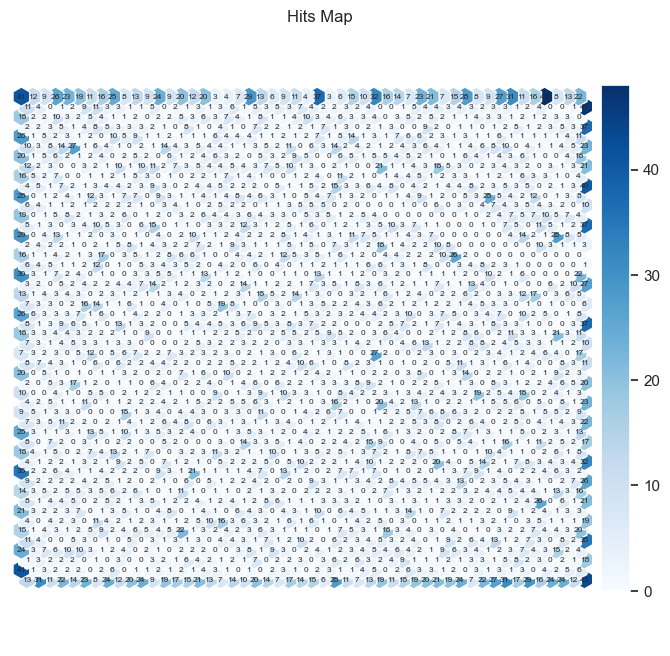

In [692]:
vhts  = BmuHitsView(8,8,"Hits Map")
vhts.show(sm_numerical, anotate=True, onlyzeros=False, labelsize=6, cmap="Blues")
plt.show()

## 5.5.1. K-Means on top of SOM units <a class="anchor" id="5.5.1"></a>

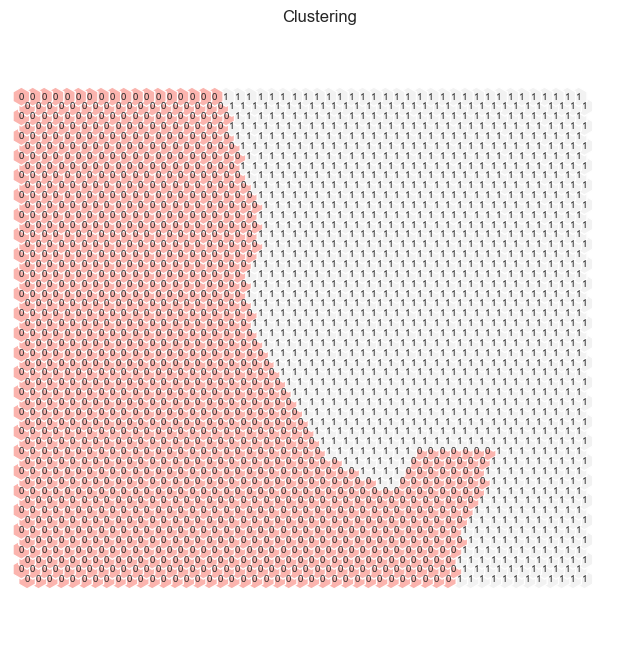

In [693]:
# Perform K-Means clustering on top of the 2500 untis (sm.get_node_vectors() output)
kmeans = KMeans(n_clusters=2, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(sm_numerical.codebook.matrix)
sm_numerical.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

hits = HitMapView(8, 8,"Clustering", text_size=10)
hits.show(sm_numerical, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [694]:
# Check the nodes and and respective clusters
nodes = sm_numerical.codebook.matrix

df_nodes = pd.DataFrame(nodes, columns=metric_features)
df_nodes['label'] = nodeclus_labels
df_nodes

,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_YearsAsCust,yeojohn_Yearly_cust_value,label
0,0.905644,1.467651,-2.076411,-1.441705,-1.249040,-0.970658,0.018479,0.102900,1
1,0.885411,1.438162,-1.769645,-1.372664,-1.710821,-0.923954,0.018966,0.030110,1
2,0.900284,1.418969,-1.275369,-1.332243,-2.195489,-0.961510,0.041630,-0.089962,1
3,0.919280,1.393771,-0.822774,-1.306956,-2.473210,-1.027910,0.049255,-0.161088,1
4,0.870957,1.438235,-0.804283,-1.378781,-2.248640,-1.559088,0.026734,-0.205553,1
...,...,...,...,...,...,...,...,...,...
2495,-0.319359,-1.683803,1.420343,-0.434305,0.851896,2.457827,-1.509429,-0.929511,0
2496,-0.502493,-1.714071,1.932794,-0.366874,0.746271,2.128547,-1.517199,-0.889072,0
2497,-0.061539,-1.688988,2.279438,-0.418946,0.729271,1.819519,-1.517085,-0.833175,0
2498,0.342646,-1.693878,2.589052,-0.486388,0.779271,1.552559,-1.532276,-0.810860,0


Applying BMU on for all the data points:  
"BMU" refers to the "Best Matching Unit." In a SOM, each unit is a node in the map that represents a cluster of similar data points. When a new data point is presented to the SOM, the BMU is the unit that is most similar to that data point, based on some measure of similarity such as Euclidean distance.

In [695]:
# Obtaining SOM's BMUs labels
bmus_map = sm_numerical.find_bmu(numerical_final_df)[0]  # get bmus for each observation in df

df_bmus = pd.DataFrame(
    np.concatenate((numerical_final_df, np.expand_dims(bmus_map,1)), axis=1),
    index=numerical_final_df.index, columns=np.append(numerical_final_df.columns,"BMU")
)
df_bmus

,yeojohn_YearsAsCust,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_Yearly_cust_value,BMU
CustID,,,,,,,,,
1,0.131247,0.587875,-0.400897,-0.209060,0.395978,-0.352225,-0.289872,0.418186,1512.0
2,0.863810,-1.623558,0.942678,-0.627431,2.380249,1.369166,-1.958873,-1.000847,2490.0
3,-0.791507,-0.619110,0.234715,-0.513312,1.073703,1.262799,-0.187636,1.252011,949.0
4,-0.477957,-0.795838,-0.592429,1.771473,0.144299,-0.046149,-1.454521,-0.778470,2275.0
5,-0.018971,0.330303,-0.567336,0.268307,-0.296022,0.250918,-0.722077,-0.640068,1869.0
...,...,...,...,...,...,...,...,...,...
10292,0.427841,0.710492,-0.558162,0.155488,-0.618836,-0.416241,0.713109,-0.742951,271.0
10293,1.290026,-1.170669,2.861485,-0.251618,-0.495994,1.354376,-0.031649,3.028872,1949.0
10294,-1.274659,0.777977,-0.149995,-0.265361,-0.504206,-0.779604,0.451294,1.645259,1552.0


In [696]:
# Get cluster labels for each observation
df_knn_som_final = df_bmus.merge(df_nodes['label'], 'left', left_on="BMU", right_index=True)
df_knn_som_final.drop(columns=['BMU'], inplace=True)
df_knn_som_final

,yeojohn_YearsAsCust,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_Yearly_cust_value,label
CustID,,,,,,,,,
1,0.131247,0.587875,-0.400897,-0.209060,0.395978,-0.352225,-0.289872,0.418186,1
2,0.863810,-1.623558,0.942678,-0.627431,2.380249,1.369166,-1.958873,-1.000847,0
3,-0.791507,-0.619110,0.234715,-0.513312,1.073703,1.262799,-0.187636,1.252011,0
4,-0.477957,-0.795838,-0.592429,1.771473,0.144299,-0.046149,-1.454521,-0.778470,0
5,-0.018971,0.330303,-0.567336,0.268307,-0.296022,0.250918,-0.722077,-0.640068,1
...,...,...,...,...,...,...,...,...,...
10292,0.427841,0.710492,-0.558162,0.155488,-0.618836,-0.416241,0.713109,-0.742951,1
10293,1.290026,-1.170669,2.861485,-0.251618,-0.495994,1.354376,-0.031649,3.028872,0
10294,-1.274659,0.777977,-0.149995,-0.265361,-0.504206,-0.779604,0.451294,1.645259,1


In [697]:
# Characterizing the 2 clusters

df_knn_som_means= df_knn_som_final.groupby('label').mean()
df_knn_som_means['label'] = df_knn_som_means.index 
df_knn_som_means

,yeojohn_YearsAsCust,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_Yearly_cust_value,label
label,,,,,,,,,
0,-0.048774,-0.791286,0.507448,0.543495,0.575426,0.555896,-0.162636,0.041244,0
1,0.051614,0.834892,-0.536656,-0.539970,-0.586565,-0.566479,0.173730,-0.042136,1


(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'yeojohn_YearsAsCust'),
  Text(1, 0, 'yeojohn_PremMotor'),
  Text(2, 0, 'yeojohn_PremHousehold'),
  Text(3, 0, 'yeojohn_PremHealth'),
  Text(4, 0, 'yeojohn_PremLife'),
  Text(5, 0, 'yeojohn_PremWork'),
  Text(6, 0, 'yeojohn_Yearly_Salary'),
  Text(7, 0, 'yeojohn_Yearly_cust_value')])

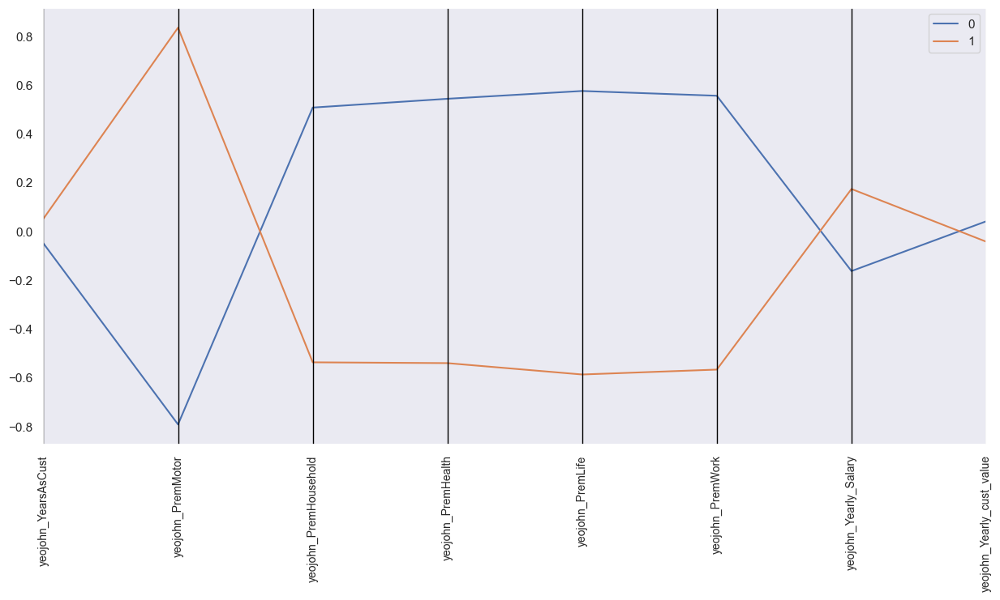

In [698]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(df_knn_som_means, class_column = 'label', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=90)

In [699]:
# using R²
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

sst = get_ss(df_knn_som_final)  # get total sum of squares
ssw_labels = df_knn_som_final.groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  
r2 = ssb / sst
r2

0.2736377796456959

## 5.5.2. Hierarchical Clustering on top of SOM units <a class="anchor" id="5.5.2"></a>

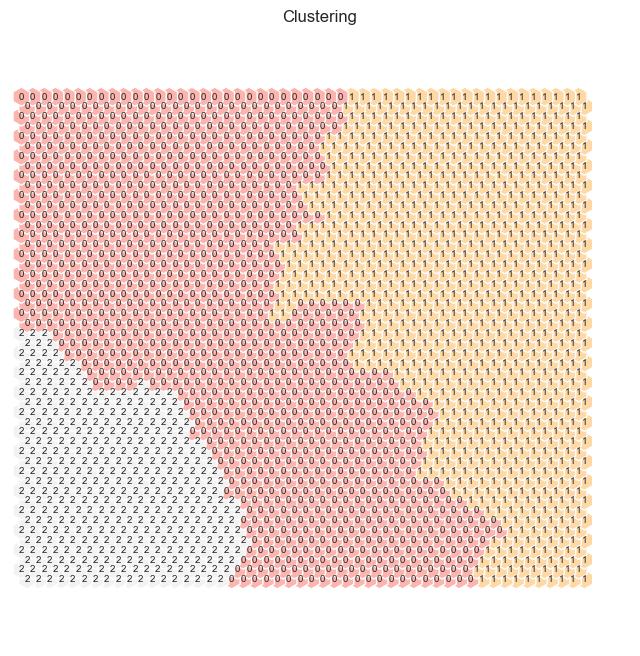

In [700]:
# Perform Hierarchical clustering on top of the 2500 untis (sm.get_node_vectors() output)
hierclust = AgglomerativeClustering(n_clusters=3, linkage='ward')
nodeclus_labels = hierclust.fit_predict(sm_numerical.codebook.matrix)
sm_numerical.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

hits  = HitMapView(8, 8,"Clustering",text_size=10)
hits.show(sm_numerical, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [701]:
# Check the nodes and and respective clusters
nodes = sm_numerical.codebook.matrix

df_nodes = pd.DataFrame(nodes, columns=metric_features)
df_nodes['label'] = nodeclus_labels
df_nodes

,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_YearsAsCust,yeojohn_Yearly_cust_value,label
0,0.905644,1.467651,-2.076411,-1.441705,-1.249040,-0.970658,0.018479,0.102900,1
1,0.885411,1.438162,-1.769645,-1.372664,-1.710821,-0.923954,0.018966,0.030110,1
2,0.900284,1.418969,-1.275369,-1.332243,-2.195489,-0.961510,0.041630,-0.089962,1
3,0.919280,1.393771,-0.822774,-1.306956,-2.473210,-1.027910,0.049255,-0.161088,1
4,0.870957,1.438235,-0.804283,-1.378781,-2.248640,-1.559088,0.026734,-0.205553,1
...,...,...,...,...,...,...,...,...,...
2495,-0.319359,-1.683803,1.420343,-0.434305,0.851896,2.457827,-1.509429,-0.929511,2
2496,-0.502493,-1.714071,1.932794,-0.366874,0.746271,2.128547,-1.517199,-0.889072,2
2497,-0.061539,-1.688988,2.279438,-0.418946,0.729271,1.819519,-1.517085,-0.833175,2
2498,0.342646,-1.693878,2.589052,-0.486388,0.779271,1.552559,-1.532276,-0.810860,2


Applying BMU on for all the data points:  
"BMU" refers to the "Best Matching Unit." In a SOM, each unit is a node in the map that represents a cluster of similar data points. When a new data point is presented to the SOM, the BMU is the unit that is most similar to that data point, based on some measure of similarity such as Euclidean distance.

In [702]:
# Obtaining SOM's BMUs labels
bmus_map = sm_numerical.find_bmu(numerical_final_df)[0]  # get bmus for each observation in df

df_bmus = pd.DataFrame(
    np.concatenate((numerical_final_df, np.expand_dims(bmus_map,1)), axis=1),
    index=numerical_final_df.index, columns=np.append(numerical_final_df.columns,"BMU")
)
df_bmus

,yeojohn_YearsAsCust,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_Yearly_cust_value,BMU
CustID,,,,,,,,,
1,0.131247,0.587875,-0.400897,-0.209060,0.395978,-0.352225,-0.289872,0.418186,1512.0
2,0.863810,-1.623558,0.942678,-0.627431,2.380249,1.369166,-1.958873,-1.000847,2490.0
3,-0.791507,-0.619110,0.234715,-0.513312,1.073703,1.262799,-0.187636,1.252011,949.0
4,-0.477957,-0.795838,-0.592429,1.771473,0.144299,-0.046149,-1.454521,-0.778470,2275.0
5,-0.018971,0.330303,-0.567336,0.268307,-0.296022,0.250918,-0.722077,-0.640068,1869.0
...,...,...,...,...,...,...,...,...,...
10292,0.427841,0.710492,-0.558162,0.155488,-0.618836,-0.416241,0.713109,-0.742951,271.0
10293,1.290026,-1.170669,2.861485,-0.251618,-0.495994,1.354376,-0.031649,3.028872,1949.0
10294,-1.274659,0.777977,-0.149995,-0.265361,-0.504206,-0.779604,0.451294,1.645259,1552.0


In [703]:
# Get cluster labels for each observation
df_hc_som_final = df_bmus.merge(df_nodes['label'], 'left', left_on="BMU", right_index=True)
df_hc_som_final.drop(columns=['BMU'], inplace=True)
df_hc_som_final

,yeojohn_YearsAsCust,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_Yearly_cust_value,label
CustID,,,,,,,,,
1,0.131247,0.587875,-0.400897,-0.209060,0.395978,-0.352225,-0.289872,0.418186,1
2,0.863810,-1.623558,0.942678,-0.627431,2.380249,1.369166,-1.958873,-1.000847,2
3,-0.791507,-0.619110,0.234715,-0.513312,1.073703,1.262799,-0.187636,1.252011,0
4,-0.477957,-0.795838,-0.592429,1.771473,0.144299,-0.046149,-1.454521,-0.778470,0
5,-0.018971,0.330303,-0.567336,0.268307,-0.296022,0.250918,-0.722077,-0.640068,0
...,...,...,...,...,...,...,...,...,...
10292,0.427841,0.710492,-0.558162,0.155488,-0.618836,-0.416241,0.713109,-0.742951,1
10293,1.290026,-1.170669,2.861485,-0.251618,-0.495994,1.354376,-0.031649,3.028872,2
10294,-1.274659,0.777977,-0.149995,-0.265361,-0.504206,-0.779604,0.451294,1.645259,1


In [704]:
# Characterizing the 3 clusters

df_hc_som_means= df_hc_som_final.groupby('label').mean()
df_hc_som_means['label'] = df_hc_som_means.index 
df_hc_som_means

,yeojohn_YearsAsCust,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_Yearly_cust_value,label
label,,,,,,,,,
0,0.128315,-0.356915,0.124799,0.613174,0.185901,0.165460,0.259970,-0.219753,0
1,-0.123141,0.951514,-0.610824,-0.707740,-0.634901,-0.617444,0.173478,0.053918,1
2,-0.044823,-1.374772,1.181284,0.125955,1.130447,1.144362,-1.185095,0.496920,2


(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'yeojohn_YearsAsCust'),
  Text(1, 0, 'yeojohn_PremMotor'),
  Text(2, 0, 'yeojohn_PremHousehold'),
  Text(3, 0, 'yeojohn_PremHealth'),
  Text(4, 0, 'yeojohn_PremLife'),
  Text(5, 0, 'yeojohn_PremWork'),
  Text(6, 0, 'yeojohn_Yearly_Salary'),
  Text(7, 0, 'yeojohn_Yearly_cust_value')])

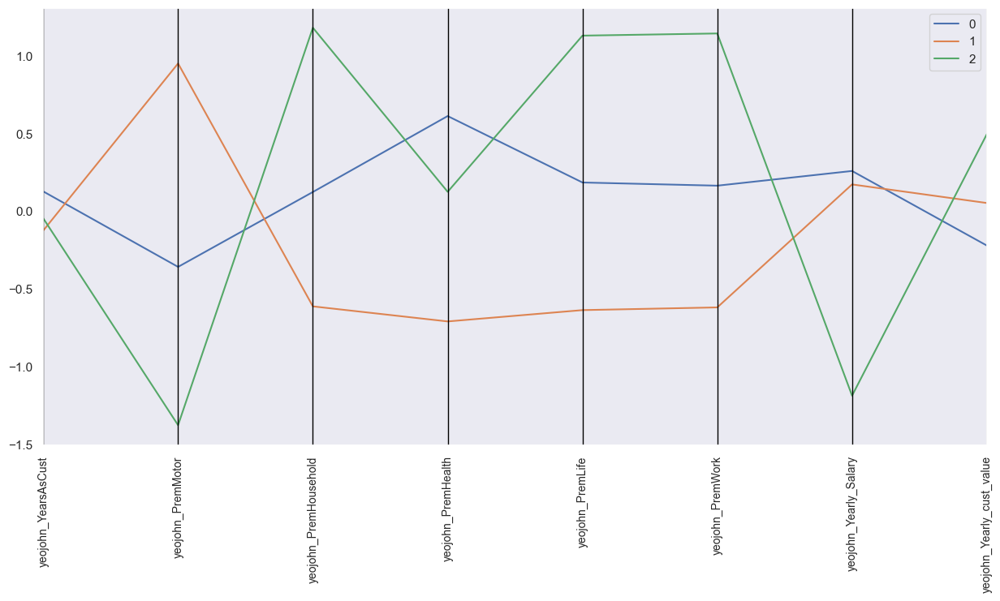

In [705]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(df_hc_som_means, class_column = 'label', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=90)

In [706]:
# using R²
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

sst = get_ss(df_hc_som_final)  # get total sum of squares
ssw_labels = df_hc_som_final.groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  
r2 = ssb / sst
r2

0.3719111224842614

# 5.6. K-Means Hierarchical Hybrid (KMHH) <a class="anchor" id="5.6"></a>

In [707]:
#Run Kmeans with 50 n_clusters 
kmclust = KMeans(n_clusters= 50, init='k-means++', n_init=15, random_state=14)

In [708]:
km_labels_50 = kmclust.fit_predict(numerical_final_df)
km_labels_50

array([38, 44, 28, ..., 20, 34, 20])

In [709]:
#Assign cluster labels to normalized data
km_50 = pd.concat((numerical_final_df, pd.Series(km_labels_50, name='Km_Label', 
                                                   index=numerical_final_df.index.tolist())), axis=1)
km_50_means = km_50.groupby('Km_Label').mean()
km_50_means

,yeojohn_YearsAsCust,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_Yearly_cust_value
Km_Label,,,,,,,,
0,-1.045923,1.454798,-0.833069,-1.483998,-1.026478,-0.858484,0.057648,-0.791168
1,-0.918635,-0.096387,0.048382,-0.066019,0.464062,0.543192,-0.498046,-0.426409
2,1.079295,0.612467,-0.489839,0.044994,-0.560547,-0.548467,-0.654410,-0.273068
3,0.156356,-1.595626,1.723835,-0.547316,2.027646,0.901923,-1.469181,1.513025
4,0.984448,-0.198571,-0.104841,0.754348,-0.066305,0.254476,-0.908061,-0.312279
5,0.697739,-0.910267,-0.141101,1.472884,0.467381,0.411213,1.174406,-0.508436
6,-0.900425,-0.891243,1.362032,0.354985,0.264991,0.722209,0.995215,2.098690
7,-0.705651,-1.150148,0.533840,0.815197,-0.121673,1.651895,-1.063642,-0.418287
8,-0.931007,-1.380753,0.024617,0.886065,1.605965,0.829914,-1.217620,-0.419711


In [710]:
#Run Hierarchical Clustering with the 50 kmeans clusters
linkage = 'ward'
distance = 'euclidean'
hc = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=None, distance_threshold=0)
hc.fit_predict(km_50_means)

array([36, 34, 46, 41, 45, 48, 32, 31, 33, 42, 43, 35, 37, 20, 29, 28, 25,
       47, 44, 27, 38, 13, 18, 49, 23, 26, 39, 40, 17, 15, 22, 30, 24, 11,
       19, 14,  6, 21,  8, 12, 10, 16,  5,  7,  9,  4,  2,  3,  1,  0],
      dtype=int64)

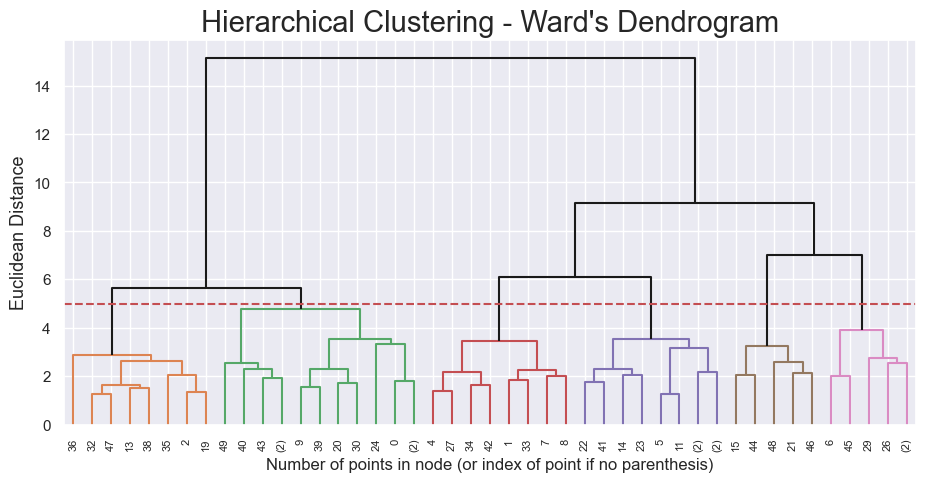

In [711]:
# Create the counts of samples under each node (number of points being merged)
counts = np.zeros(hc.children_.shape[0])
n_samples = len(hc.labels_)


for i, merge in enumerate(hc.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

linkage_matrix = np.column_stack([hc.children_, hc.distances_, counts]).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned. Already have an idea of 3 or 4 clusters bc of Kmeans.
y_threshold = 5
#Build the dendogram
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

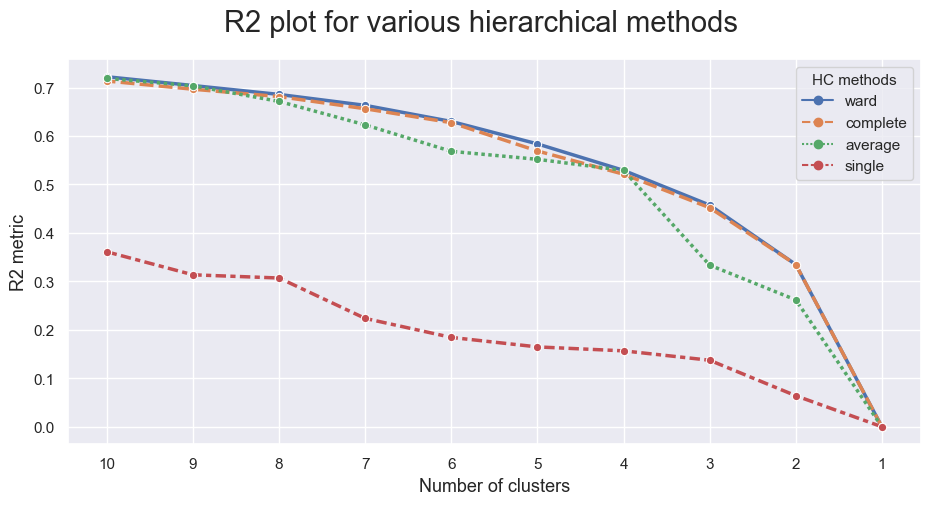

In [712]:
## Visualize R2 scores with variying linnkage methods and number of clusters 

max_nclus = 10
plot_r2_linkage(km_50_means, max_nclus)

In [713]:
# given the dendogram and the R2 plot, we chose 3 clusters and ward linkage. 
KMHH_3= AgglomerativeClustering(linkage='ward',affinity='euclidean',n_clusters=3)
KMHH_labels= KMHH_3.fit_predict(km_50_means)

In [714]:
#characterization with normalized data per cluster-HC
df_KMHH_50 = pd.concat((km_50_means, pd.Series(KMHH_labels, name='KMHH_labels')), axis=1)
#labeled_hc_normalized
df_KMHH_means = df_KMHH_50.groupby('KMHH_labels').mean()
df_KMHH_means['KMHH_labels'] = df_KMHH_means.index
df_KMHH_means

,yeojohn_YearsAsCust,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_Yearly_cust_value,KMHH_labels
KMHH_labels,,,,,,,,,
0,-0.120259,-1.392335,1.539132,-0.195235,1.163218,1.152071,-0.960673,0.878149,0
1,0.087485,0.791997,-0.560562,-0.527252,-0.632886,-0.551705,0.067241,-0.013618,1
2,-0.081760,-0.707862,0.333792,0.717320,0.484205,0.434729,0.109302,-0.248748,2


(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'yeojohn_YearsAsCust'),
  Text(1, 0, 'yeojohn_PremMotor'),
  Text(2, 0, 'yeojohn_PremHousehold'),
  Text(3, 0, 'yeojohn_PremHealth'),
  Text(4, 0, 'yeojohn_PremLife'),
  Text(5, 0, 'yeojohn_PremWork'),
  Text(6, 0, 'yeojohn_Yearly_Salary'),
  Text(7, 0, 'yeojohn_Yearly_cust_value')])

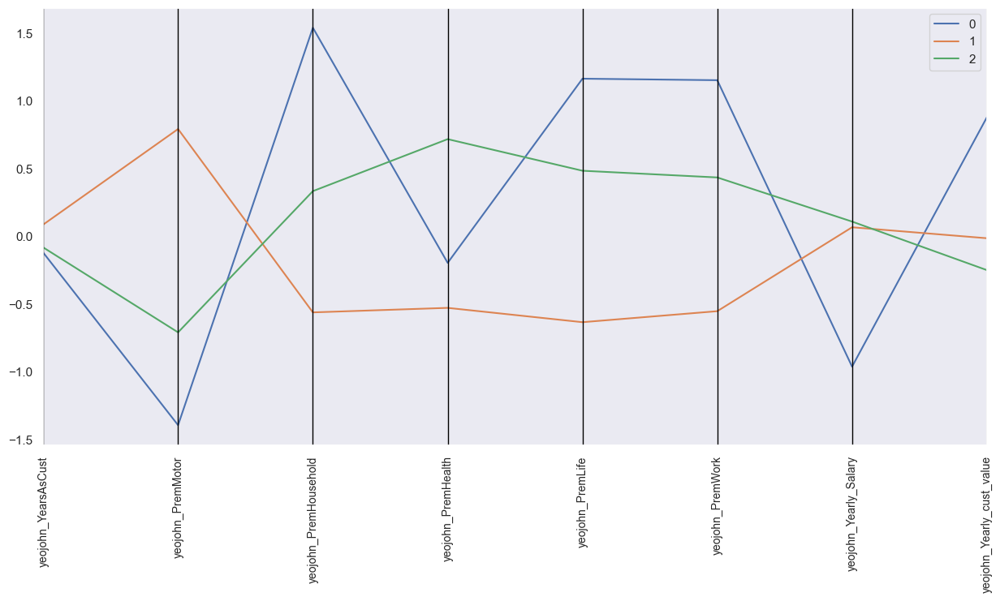

In [715]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(df_KMHH_means, class_column = 'KMHH_labels', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=90)

In [716]:
# Assign the original data points to the final clusters
df_KMHH = km_50

df_KMHH = df_KMHH.assign(final_cluster=lambda x: None)

for i in df_KMHH.index:
    for j in df_KMHH_50.index:
        if df_KMHH['Km_Label'][i] == j:
            df_KMHH['final_cluster'][i]= df_KMHH_50['KMHH_labels'][j]
df_KMHH.drop(columns='Km_Label', inplace=True)
df_KMHH

,yeojohn_YearsAsCust,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_Yearly_cust_value,final_cluster
1,0.131247,0.587875,-0.400897,-0.209060,0.395978,-0.352225,-0.289872,0.418186,1
2,0.863810,-1.623558,0.942678,-0.627431,2.380249,1.369166,-1.958873,-1.000847,0
3,-0.791507,-0.619110,0.234715,-0.513312,1.073703,1.262799,-0.187636,1.252011,2
4,-0.477957,-0.795838,-0.592429,1.771473,0.144299,-0.046149,-1.454521,-0.778470,2
5,-0.018971,0.330303,-0.567336,0.268307,-0.296022,0.250918,-0.722077,-0.640068,1
...,...,...,...,...,...,...,...,...,...
10292,0.427841,0.710492,-0.558162,0.155488,-0.618836,-0.416241,0.713109,-0.742951,1
10293,1.290026,-1.170669,2.861485,-0.251618,-0.495994,1.354376,-0.031649,3.028872,0
10294,-1.274659,0.777977,-0.149995,-0.265361,-0.504206,-0.779604,0.451294,1.645259,1
10295,0.863810,-0.749958,0.181258,0.467024,0.711623,1.468066,-0.503022,-0.121839,2


In [717]:
# using R²
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

sst = get_ss(df_KMHH)  # get total sum of squares
ssw_labels = df_KMHH.groupby(by='final_cluster').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  
r2 = ssb / sst
r2

0.34907756103905246

# 5.7. Gaussian Mixture Model <a class="anchor" id="5.7"></a>

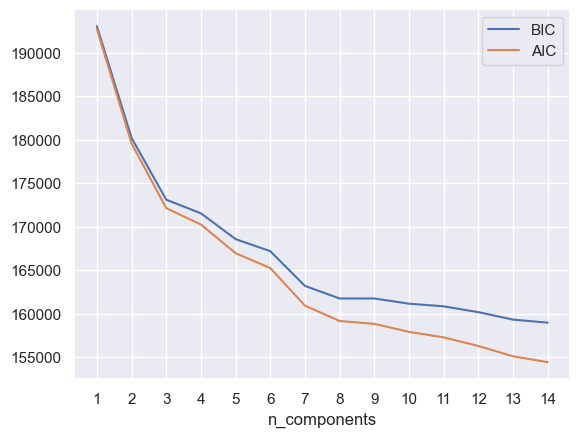

In [718]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 15)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(numerical_final_df)
          for n in n_components]

bic_values = [m.bic(numerical_final_df) for m in models]
aic_values = [m.aic(numerical_final_df) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

Based on the BIC / AIC approach we chose the point where the curve changes slope (elbow).
Source: https://towardsdatascience.com/gaussian-mixture-model-clusterization-how-to-select-the-number-of-components-clusters-553bef45f6e4

In [719]:
# Performing GMM clustering
gmm = GaussianMixture(n_components=3, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(numerical_final_df)

In [720]:
# Characterizing the final clusters
df_GMM = pd.concat((numerical_final_df, pd.Series(gmm_labels, name='gmm_labels', index=numerical_final_df.index)), axis=1)
complete_df_GMM = pd.concat((final_df_ohc, pd.Series(gmm_labels, name='gmm_labels', index=final_df_ohc.index)), axis=1)
df_GMM_means=df_GMM.groupby('gmm_labels').mean()
df_GMM_means['gmm_labels'] = df_GMM_means.index 
df_GMM_means

,yeojohn_YearsAsCust,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_Yearly_cust_value,gmm_labels
gmm_labels,,,,,,,,,
0,-0.091103,-1.144689,0.937580,0.149615,0.842906,0.863043,-0.513200,0.326862,0
1,0.061154,-0.046213,-0.001906,0.397411,0.073067,0.053575,0.189847,-0.160944,1
2,-0.041482,1.163600,-0.865116,-0.919405,-0.896643,-0.874286,0.080545,0.040256,2


In [721]:
ind=pd.DataFrame(numerical_final_df.index)
Rawdf_GMM = df.loc[ind['CustID']]
Rawdf_GMM=pd.concat((Rawdf_GMM, pd.Series(gmm_labels, name='gmm_labels', index=Rawdf_kmeans.index)), axis=1)
Rawdf_GMM_mean=Rawdf_GMM.groupby('gmm_labels').mean()
Rawdf_GMM_mean

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
gmm_labels,,,,,,,,,,,,,
0,1986.610066,1977.266200,1.909409,2013.158842,2.710538,0.640105,294.422672,0.676467,140.243437,453.527722,177.605098,88.343087,87.350188
1,1985.616100,1964.693212,2.534509,2685.461933,2.724399,0.651555,181.531501,0.720657,286.937236,177.530447,196.286269,37.015851,36.020354
2,1986.288288,1966.727734,2.885937,2556.946833,2.692008,0.883112,221.452148,0.602413,461.182604,35.616374,100.780990,8.195622,7.812628


(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'yeojohn_YearsAsCust'),
  Text(1, 0, 'yeojohn_PremMotor'),
  Text(2, 0, 'yeojohn_PremHousehold'),
  Text(3, 0, 'yeojohn_PremHealth'),
  Text(4, 0, 'yeojohn_PremLife'),
  Text(5, 0, 'yeojohn_PremWork'),
  Text(6, 0, 'yeojohn_Yearly_Salary'),
  Text(7, 0, 'yeojohn_Yearly_cust_value')])

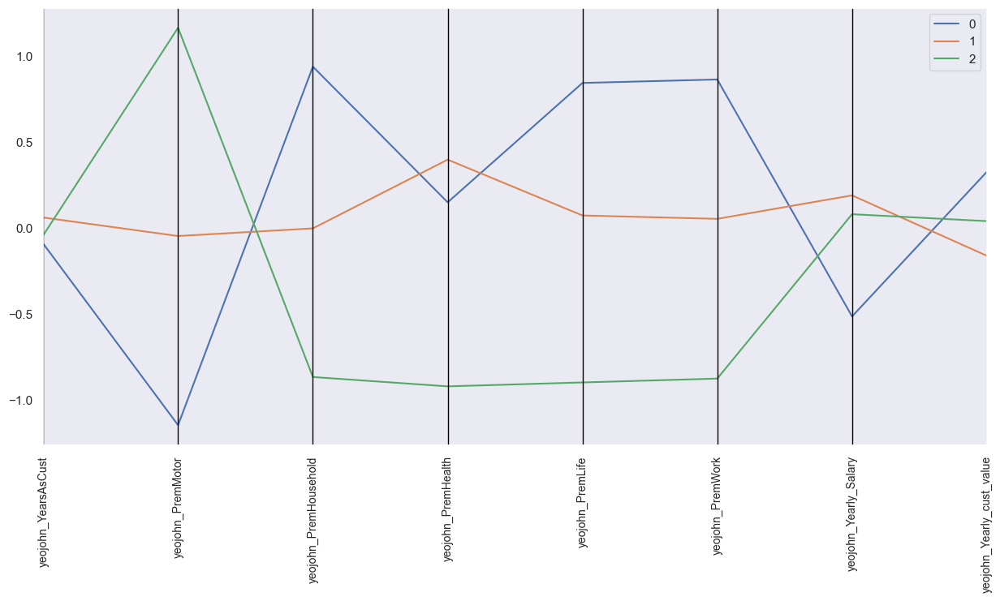

In [722]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(df_GMM_means, class_column = 'gmm_labels', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=90)

In [723]:
df_GMM.gmm_labels.value_counts()

1    5283
2    2565
0    2287
Name: gmm_labels, dtype: int64

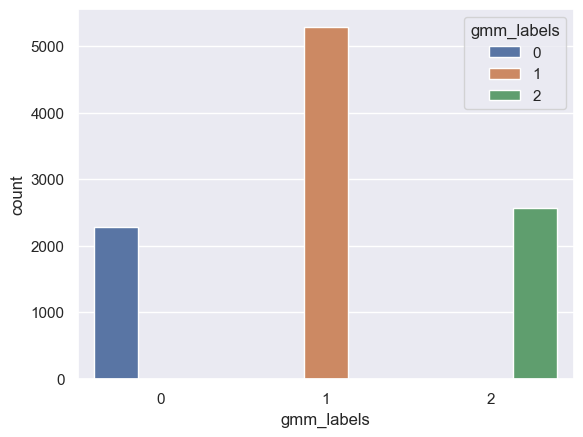

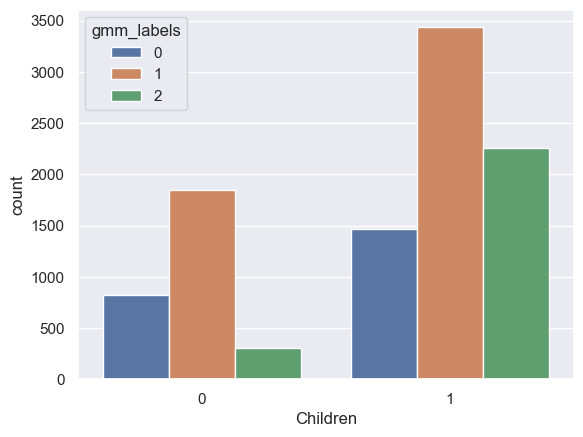

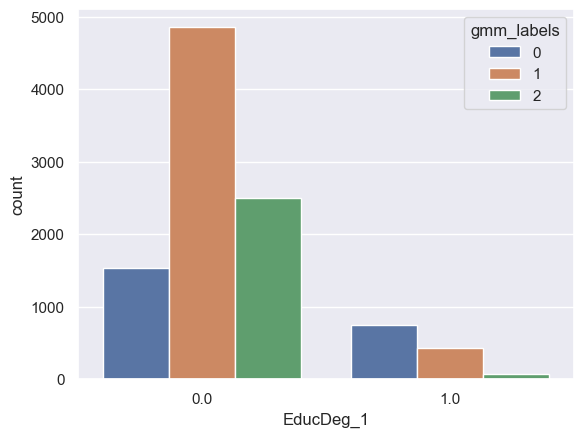

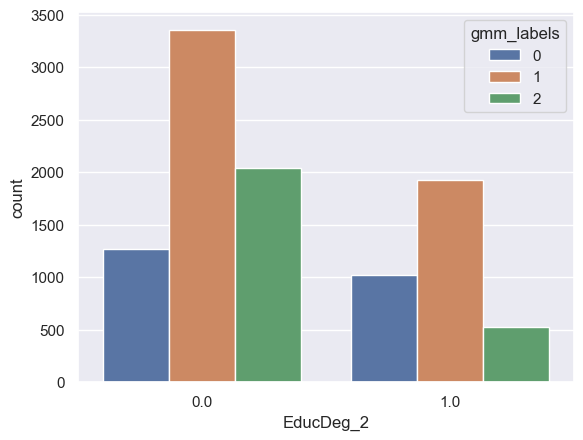

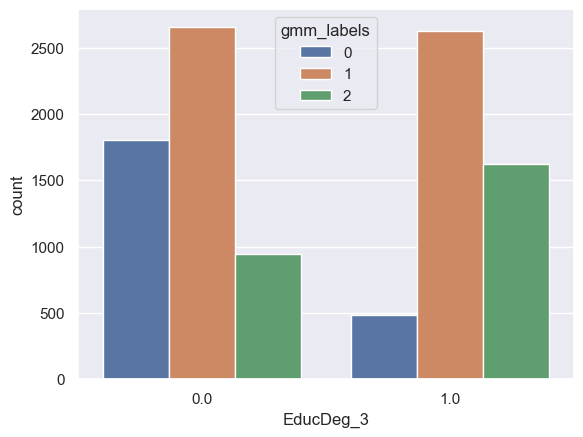

...

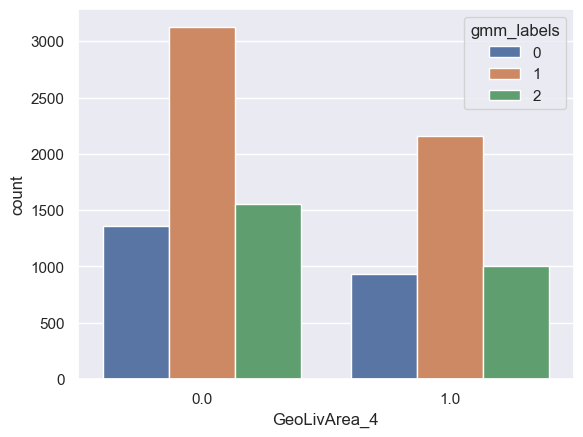

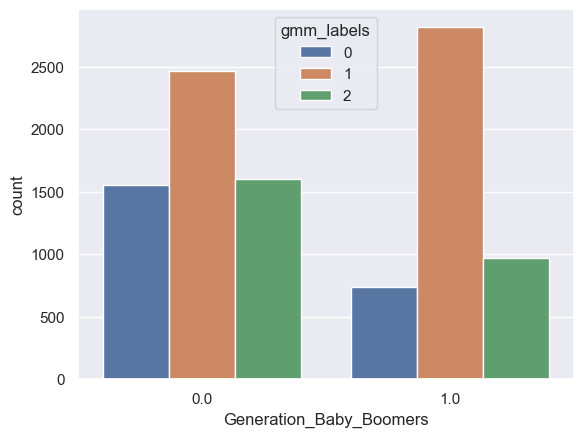

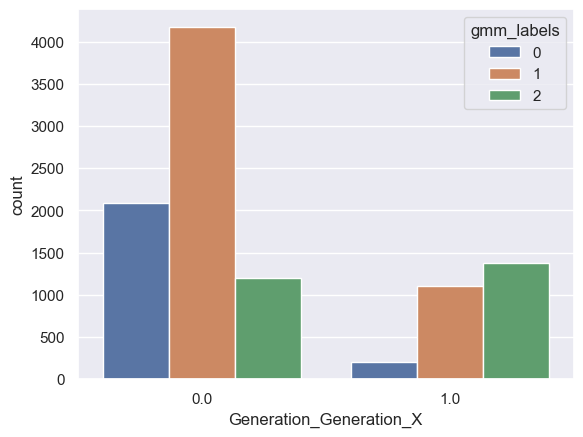

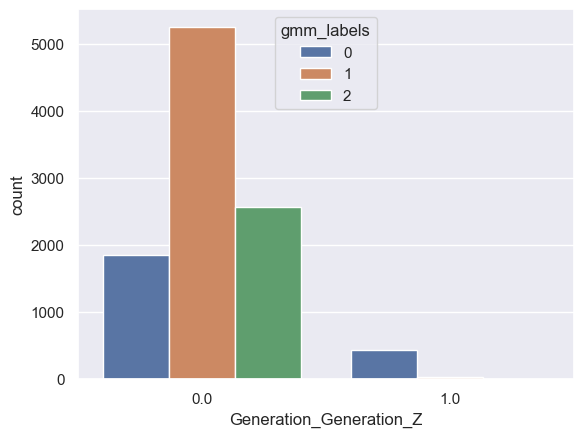

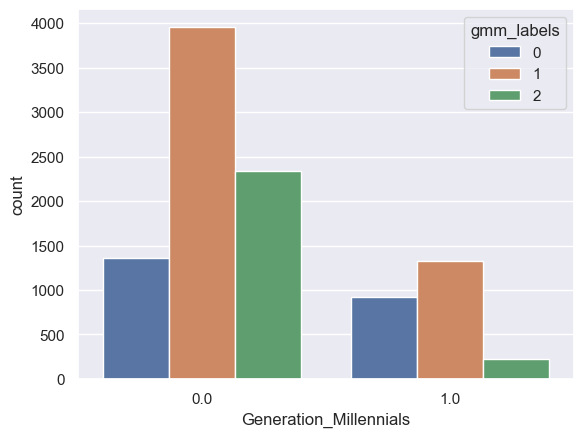

In [724]:
cat_var=['gmm_labels','Children','EducDeg_1','EducDeg_2','EducDeg_3','EducDeg_4','GeoLivArea_1','GeoLivArea_2','GeoLivArea_3','GeoLivArea_4','Generation_Baby_Boomers','Generation_Generation_X','Generation_Generation_Z','Generation_Millennials']
# Loop through the categorical variables and create a count plot for each one
for var in cat_var:
    sns.countplot(x=var, hue='gmm_labels', data=complete_df_GMM)
    plt.show()

In [725]:
# using R²
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

sst = get_ss(df_GMM)  # get total sum of squares
ssw_labels = df_GMM.groupby(by='gmm_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  
r2 = ssb / sst
r2

0.32699700677143106

# 5.8. K-prototype <a class="anchor" id="5.8"></a>

In [726]:
# Converting floats to objects for "EducDeg", "Generation", "GeoLivArea" and "Children" to ensure the variables are categorical
df_kprototype= Final_data.copy()
df_kprototype['EducDeg']=df_kprototype['EducDeg'].astype(str)
df_kprototype['Generation']=df_kprototype['Generation'].astype(str)
df_kprototype['GeoLivArea']=df_kprototype['GeoLivArea'].astype(str)
df_kprototype['Children']=df_kprototype['Children'].astype(str)
df_kprototype

,EducDeg,GeoLivArea,Children,Generation,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_YearsAsCust,yeojohn_Yearly_cust_value
CustID,,,,,,,,,,,,
1,2,1,1,Millennials,0.587875,-0.400897,-0.209060,0.395978,-0.352225,-0.289872,0.131247,0.418186
2,2,4,1,Millennials,-1.623558,0.942678,-0.627431,2.380249,1.369166,-1.958873,0.863810,-1.000847
3,1,3,0,Generation_X,-0.619110,0.234715,-0.513312,1.073703,1.262799,-0.187636,-0.791507,1.252011
4,3,4,1,Millennials,-0.795838,-0.592429,1.771473,0.144299,-0.046149,-1.454521,-0.477957,-0.778470
5,3,4,1,Generation_X,0.330303,-0.567336,0.268307,-0.296022,0.250918,-0.722077,-0.018971,-0.640068
...,...,...,...,...,...,...,...,...,...,...,...,...
10292,4,2,0,Baby_Boomers,0.710492,-0.558162,0.155488,-0.618836,-0.416241,0.713109,0.427841,-0.742951
10293,1,3,0,Baby_Boomers,-1.170669,2.861485,-0.251618,-0.495994,1.354376,-0.031649,1.290026,3.028872
10294,3,1,1,Generation_X,0.777977,-0.149995,-0.265361,-0.504206,-0.779604,0.451294,-1.274659,1.645259


In [727]:
# Get the position of categorical columns
catColumnsPos = [df_kprototype.columns.get_loc(col) for col in list(df_kprototype.select_dtypes('object').columns)]
print('Categorical columns           : {}'.format(list(df_kprototype.select_dtypes('object').columns)))
print('Categorical columns position  : {}'.format(catColumnsPos))

Categorical columns           : ['EducDeg', 'GeoLivArea', 'Children', 'Generation']
Categorical columns position  : [0, 1, 2, 3]


In [728]:
kprot_Matrix = df_kprototype.to_numpy()
kprot_Matrix

array([['2', '1', '1', ..., -0.28987198312549545, 0.1312473262746272,
        0.41818573474122744],
       ['2', '4', '1', ..., -1.958872703170716, 0.8638099046909253,
        -1.0008473498129995],
       ['1', '3', '0', ..., -0.1876364206839775, -0.7915074184352572,
        1.2520108965996832],
       ...,
       ['3', '1', '1', ..., 0.45129406738515154, -1.2746590803479922,
        1.6452586416468393],
       ['1', '2', '1', ..., -0.5030216283660057, 0.8638099046909253,
        -0.12183856050874989],
       ['4', '1', '1', ..., 0.35035989734896117, -0.47795659618100766,
        0.9309054819794984]], dtype=object)

Cluster initiation: 1
Cluster initiation: 2
Cluster initiation: 3
Cluster initiation: 4
Cluster initiation: 5
Cluster initiation: 6
Cluster initiation: 7


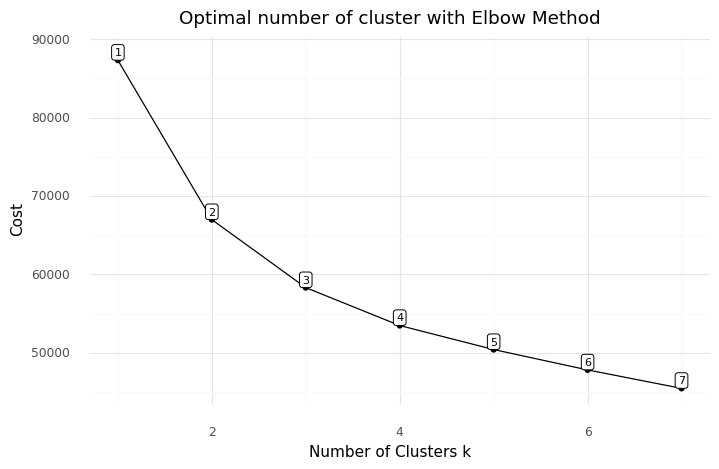

<ggplot: (169683733206)>

In [729]:
#Checking for optimal K with cost function
cost = []
for cluster in range(1, 8):
    try:
        kprototype = KPrototypes(n_jobs = -1, n_clusters = cluster, init = 'Huang', random_state = 0)
        kprototype.fit_predict(kprot_Matrix, categorical = catColumnsPos)
        cost.append(kprototype.cost_)
        print('Cluster initiation: {}'.format(cluster))
    except:
        break
        
# Converting the results into a dataframe and plotting them
df_cost = pd.DataFrame({'Cluster':range(1, 8), 'Cost':cost})

#Plotting the cost function of the K clusters
plotnine.options.figure_size = (8, 4.8)
(
    ggplot(data = df_cost)+
    geom_line(aes(x = 'Cluster',
                  y = 'Cost'))+
    geom_point(aes(x = 'Cluster',
                   y = 'Cost'))+
    geom_label(aes(x = 'Cluster',
                   y = 'Cost',
                   label = 'Cluster'),
               size = 8,
               nudge_y = 1000) +
    labs(title = 'Optimal number of cluster with Elbow Method')+
    xlab('Number of Clusters k')+
    ylab('Cost')+
    theme_minimal()
)

In [730]:
# Fit the cluster
kprototype = KPrototypes(n_jobs = -1, n_clusters = 3, init = 'Huang', random_state = 0)
kprototype.fit_predict(kprot_Matrix, categorical = catColumnsPos)

df_kprototype['labels'] = kprototype.labels_ 
df_kprototype

,EducDeg,GeoLivArea,Children,Generation,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_YearsAsCust,yeojohn_Yearly_cust_value,labels
CustID,,,,,,,,,,,,,
1,2,1,1,Millennials,0.587875,-0.400897,-0.209060,0.395978,-0.352225,-0.289872,0.131247,0.418186,1
2,2,4,1,Millennials,-1.623558,0.942678,-0.627431,2.380249,1.369166,-1.958873,0.863810,-1.000847,2
3,1,3,0,Generation_X,-0.619110,0.234715,-0.513312,1.073703,1.262799,-0.187636,-0.791507,1.252011,2
4,3,4,1,Millennials,-0.795838,-0.592429,1.771473,0.144299,-0.046149,-1.454521,-0.477957,-0.778470,2
5,3,4,1,Generation_X,0.330303,-0.567336,0.268307,-0.296022,0.250918,-0.722077,-0.018971,-0.640068,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292,4,2,0,Baby_Boomers,0.710492,-0.558162,0.155488,-0.618836,-0.416241,0.713109,0.427841,-0.742951,0
10293,1,3,0,Baby_Boomers,-1.170669,2.861485,-0.251618,-0.495994,1.354376,-0.031649,1.290026,3.028872,2
10294,3,1,1,Generation_X,0.777977,-0.149995,-0.265361,-0.504206,-0.779604,0.451294,-1.274659,1.645259,1


In [731]:
#labeled_hc_normalized
df_kprototype_numeric= df_kprototype[metric_features]
df_kprototype_numeric['labels'] = kprototype.labels_
df_kprototype_means= df_kprototype_numeric.groupby('labels').mean()
df_kprototype_means['labels'] = df_kprototype_means.index
df_kprototype_means

,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,yeojohn_YearsAsCust,yeojohn_Yearly_cust_value,labels
labels,,,,,,,,,
0,-0.292173,0.064613,0.622968,0.144270,0.116258,0.728628,-0.001681,-0.114316,0
1,0.990707,-0.642482,-0.732044,-0.694648,-0.663497,-0.003478,0.023757,-0.026645,1
2,-1.110814,0.908468,0.271599,0.912020,0.904376,-1.090068,-0.032551,0.217622,2


(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'yeojohn_PremMotor'),
  Text(1, 0, 'yeojohn_PremHousehold'),
  Text(2, 0, 'yeojohn_PremHealth'),
  Text(3, 0, 'yeojohn_PremLife'),
  Text(4, 0, 'yeojohn_PremWork'),
  Text(5, 0, 'yeojohn_Yearly_Salary'),
  Text(6, 0, 'yeojohn_YearsAsCust'),
  Text(7, 0, 'yeojohn_Yearly_cust_value')])

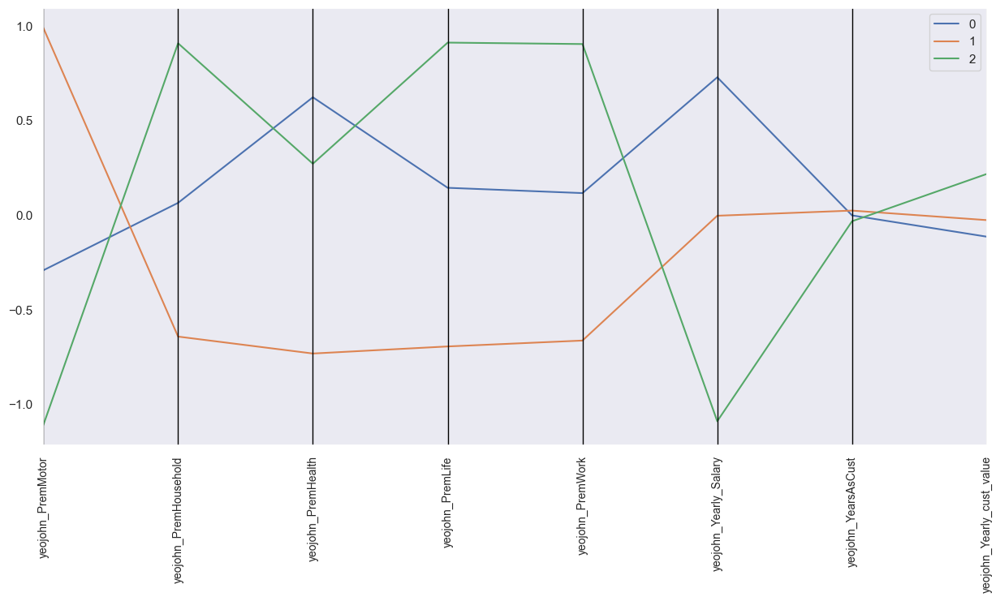

In [732]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(df_kprototype_means, class_column = 'labels', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=90)

In [733]:
df_kprototype.labels.value_counts()

1    3964
0    3726
2    2445
Name: labels, dtype: int64

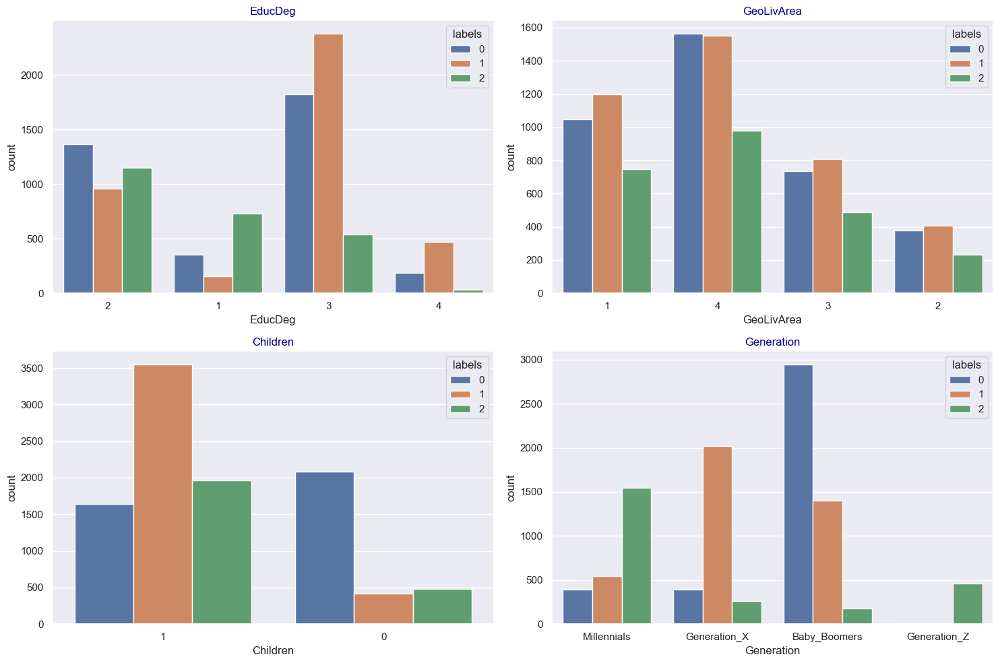

In [734]:
# Loop through the categorical variables and create a count plot for each one

cat_vars= ['EducDeg','GeoLivArea','Children','Generation']
plt.figure(figsize=(15,10))
for i,j in enumerate(cat_vars):
    plt.subplot(2,2,i+1)
    sns.countplot(x=j, hue='labels', data=df_kprototype)
    plt.title(j,fontdict={'color':'darkblue'})
plt.tight_layout()
plt.show()


In [735]:
# using R²
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

sst = get_ss(df_kprototype)  # get total sum of squares
ssw_labels = df_kprototype.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  
r2 = ssb / sst
r2

0.40129661175404013

### Optimizing K-prototype by dropping variables not affecting the clustering

In [736]:
df_kprototype_optimal= df_kprototype.drop(columns=['yeojohn_YearsAsCust','yeojohn_Yearly_cust_value','GeoLivArea','labels'], inplace=False)

In [737]:
# Get the position of categorical columns
catColumnsPos = [df_kprototype_optimal.columns.get_loc(col) for col in list(df_kprototype_optimal.select_dtypes('object').columns)]
print('Categorical columns           : {}'.format(list(df_kprototype_optimal.select_dtypes('object').columns)))
print('Categorical columns position  : {}'.format(catColumnsPos))

Categorical columns           : ['EducDeg', 'Children', 'Generation']
Categorical columns position  : [0, 1, 2]


In [738]:
kprot_Matrix = df_kprototype_optimal.to_numpy()
kprot_Matrix

array([['2', '1', 'Millennials', ..., 0.39597832127238697,
        -0.3522253923350018, -0.28987198312549545],
       ['2', '1', 'Millennials', ..., 2.38024852433145,
        1.3691660170299471, -1.958872703170716],
       ['1', '0', 'Generation_X', ..., 1.073702629301516,
        1.2627985765255263, -0.1876364206839775],
       ...,
       ['3', '1', 'Generation_X', ..., -0.5042061588894119,
        -0.7796037477600312, 0.45129406738515154],
       ['1', '1', 'Generation_X', ..., 0.711623099960799,
        1.468065583779108, -0.5030216283660057],
       ['4', '1', 'Millennials', ..., -0.7499158311378766,
        -0.4764753525694221, 0.35035989734896117]], dtype=object)

In [739]:
# Fit the cluster
kprototype = KPrototypes(n_jobs = -1, n_clusters = 3, init = 'Huang', random_state = 0)
kprototype.fit_predict(kprot_Matrix, categorical = catColumnsPos)

df_kprototype_optimal['labels'] = kprototype.labels_ 
df_kprototype_optimal.head()

,EducDeg,Children,Generation,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,labels
CustID,,,,,,,,,,
1,2,1,Millennials,0.587875,-0.400897,-0.209060,0.395978,-0.352225,-0.289872,2
2,2,1,Millennials,-1.623558,0.942678,-0.627431,2.380249,1.369166,-1.958873,1
3,1,0,Generation_X,-0.619110,0.234715,-0.513312,1.073703,1.262799,-0.187636,1
4,3,1,Millennials,-0.795838,-0.592429,1.771473,0.144299,-0.046149,-1.454521,1
5,3,1,Generation_X,0.330303,-0.567336,0.268307,-0.296022,0.250918,-0.722077,2


In [740]:
df_kprototype_numeric= df_kprototype_optimal[['yeojohn_PremMotor','yeojohn_PremHousehold','yeojohn_PremHealth',
                                              'yeojohn_PremLife','yeojohn_PremWork','yeojohn_Yearly_Salary']]
df_kprototype_numeric['labels'] = kprototype.labels_
df_kprototype_means= df_kprototype_numeric.groupby('labels').mean()
df_kprototype_means['labels'] = df_kprototype_means.index
df_kprototype_means

,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,labels
labels,,,,,,,
0,-0.294703,0.099170,0.583116,0.164401,0.132555,0.818427,0
1,-1.080494,0.843282,0.332710,0.862596,0.861647,-1.107796,1
2,0.977398,-0.643782,-0.708627,-0.689459,-0.660434,-0.016705,2


(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'yeojohn_PremMotor'),
  Text(1, 0, 'yeojohn_PremHousehold'),
  Text(2, 0, 'yeojohn_PremHealth'),
  Text(3, 0, 'yeojohn_PremLife'),
  Text(4, 0, 'yeojohn_PremWork'),
  Text(5, 0, 'yeojohn_Yearly_Salary')])

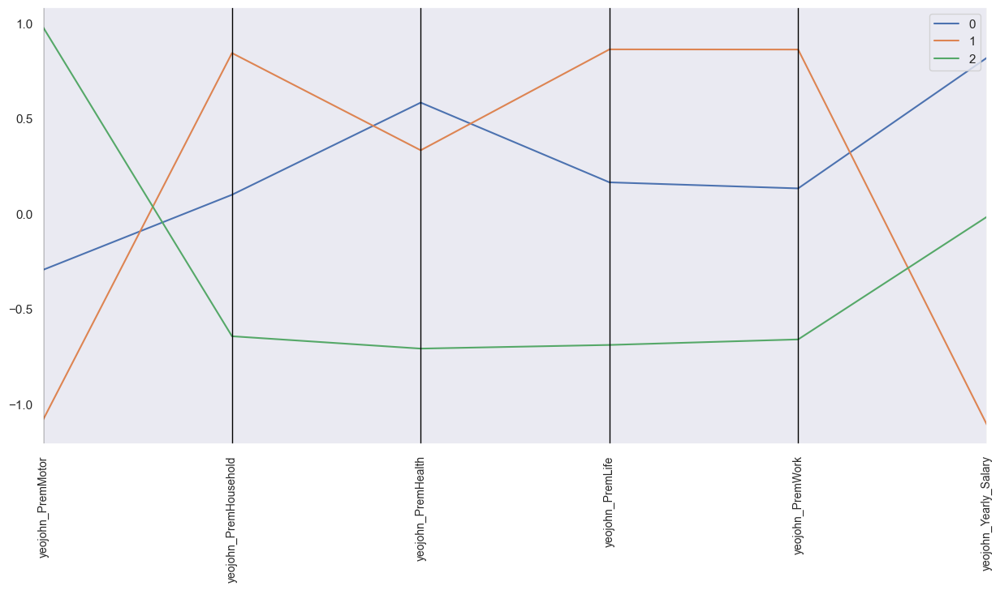

In [741]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(df_kprototype_means, class_column = 'labels', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=90)

In [742]:
df_kprototype_optimal.labels.value_counts()

2    4017
0    3572
1    2546
Name: labels, dtype: int64

In [743]:
final_kprototype= df_kprototype.drop(columns=['yeojohn_YearsAsCust','yeojohn_Yearly_cust_value','GeoLivArea'], inplace=False)

In [744]:
# using R²
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

sst = get_ss(df_kprototype_optimal)  # get total sum of squares
ssw_labels = df_kprototype_optimal.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  
r2 = ssb / sst
r2

0.5200923902724056

<a class="anchor" id="sixth-bullet">     

# 6. Clusters Analysis & Profiling

In [745]:
#Convert 'Generation' to numerical values to include them in the t-SNE and UMAP
final_kprototype['Generation'] = final_kprototype['Generation'].map(lambda x: {'Baby_Boomers':0,
                              'Generation_X':1,
                              'Millennials':2,
                              'Generation_Z':3}[x])

final_kprototype.head()

,EducDeg,Children,Generation,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork,yeojohn_Yearly_Salary,labels
CustID,,,,,,,,,,
1,2,1,2,0.587875,-0.400897,-0.209060,0.395978,-0.352225,-0.289872,1
2,2,1,2,-1.623558,0.942678,-0.627431,2.380249,1.369166,-1.958873,2
3,1,0,1,-0.619110,0.234715,-0.513312,1.073703,1.262799,-0.187636,2
4,3,1,2,-0.795838,-0.592429,1.771473,0.144299,-0.046149,-1.454521,2
5,3,1,1,0.330303,-0.567336,0.268307,-0.296022,0.250918,-0.722077,1


## 6.1 t-SNE Visualization <a class="anchor" id="6.1"></a>

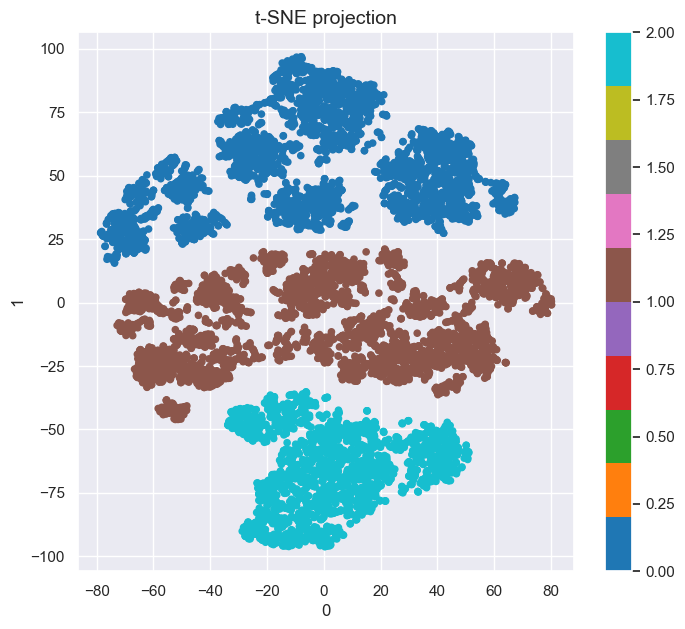

In [746]:
# t-SNE visualization
two_dim = TSNE(random_state=42).fit_transform(final_kprototype)
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=final_kprototype['labels'], colormap='tab10', figsize=(8,7))
plt.title('t-SNE projection', fontsize=14);
plt.show()

## 6.2 UMAP Visualization <a class="anchor" id="6.2"></a>

In [747]:
# Create a UMAP object and fit it to the data
umap_model = umap.UMAP()
X_reduced = umap_model.fit_transform(final_kprototype)

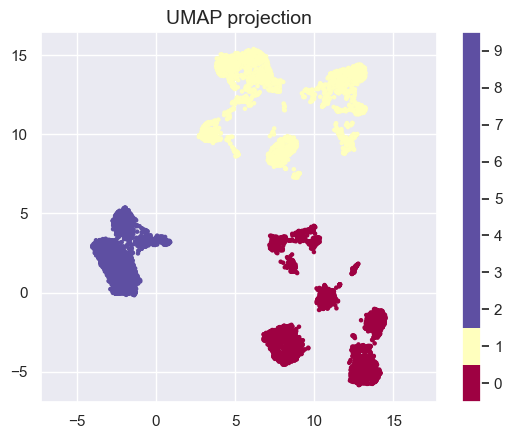

In [748]:
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=final_kprototype.labels, cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.title('UMAP projection', fontsize=14);

## 6.3 Decision Tree: Assess the accuracy & Visualize <a class="anchor" id="6.3"></a>

In [749]:
# See the clusters with the original values

ind=pd.DataFrame(numerical_final_df.index)
final_df = Original_df_filled.loc[ind['CustID']]
final_df['labels']= df_kprototype_optimal['labels']
final_df

,EducDeg,GeoLivArea,Children,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Generation,Yearly_Salary,YearsAsCust,Yearly_cust_value,labels
CustID,,,,,,,,,,,,,
1,2,1,1,375.85,79.45,146.36,47.01,16.89,Millennials,26124.0,32.0,12.69,2
2,2,4,1,77.46,416.20,116.69,194.48,106.13,Millennials,8124.0,37.0,-2.87,1
3,1,3,0,206.15,224.50,124.58,86.35,99.02,Generation_X,27324.0,26.0,20.37,1
4,3,4,1,182.48,43.35,311.17,35.34,28.34,Millennials,13188.0,28.0,0.29,1
5,3,4,1,338.62,47.80,182.59,18.78,41.45,Generation_X,21156.0,31.0,1.94,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292,4,2,0,393.74,49.45,173.81,9.78,14.78,Baby_Boomers,38256.0,34.0,0.73,2
10293,1,3,0,133.58,1035.75,143.25,12.89,105.13,Baby_Boomers,29172.0,40.0,35.77,1
10294,3,1,1,403.63,132.80,142.25,12.67,4.89,Generation_X,35016.0,23.0,23.87,2


In [750]:
final_df['Generation'] = final_df['Generation'].map(lambda x: {'Baby_Boomers':'0',
                                                               'Generation_X':'1',
                                                               'Millennials':'2',
                                                               'Generation_Z':'3'}[x])


In [751]:
# Preparing the data
X = final_df.drop(columns='labels')
y = final_df['labels']

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Fitting the decision tree
dt = DecisionTreeClassifier(random_state=42, max_depth=5)
dt.fit(X_train, y_train)
print("It is estimated that in average, we are able to predict {0:.2f}% of the customers correctly".format(dt.score(X_test, y_test)*100))

It is estimated that in average, we are able to predict 91.27% of the customers correctly


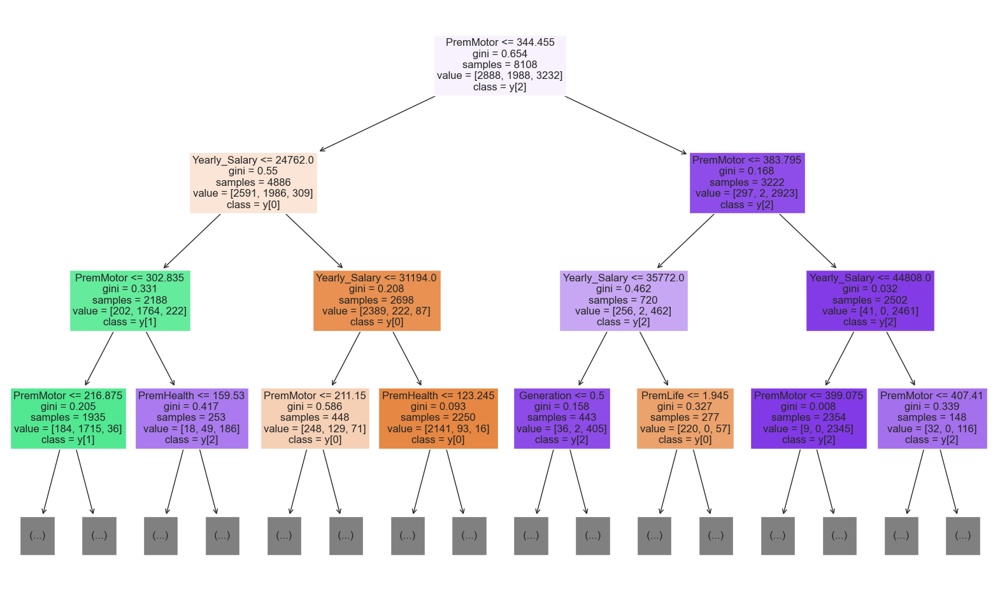

In [752]:
# Visualizing the decision tree
fig = plt.figure(figsize=(20,12))
_ = tree.plot_tree(dt, max_depth=3, class_names=True, 
                   feature_names=X.columns.to_list(),  
                   filled=True,
                   fontsize=12)


## 6.4 Cluster Profiling <a class="anchor" id="6.4"></a>

<font color=darkblue>
Based on the results provided by the decision tree, we understood that the 'PremMotor' and the 'Yearly_Salary' are most important features and that our clustering model depends highly on them.   
    
Given that, we will visualize the distribution of the clusters based on these two variables and include other features to achieve a deeper understanding of the characteristics of the three clusters.<font color=darkblue>
</font >

Text(0, 0.5, 'PremMotor')

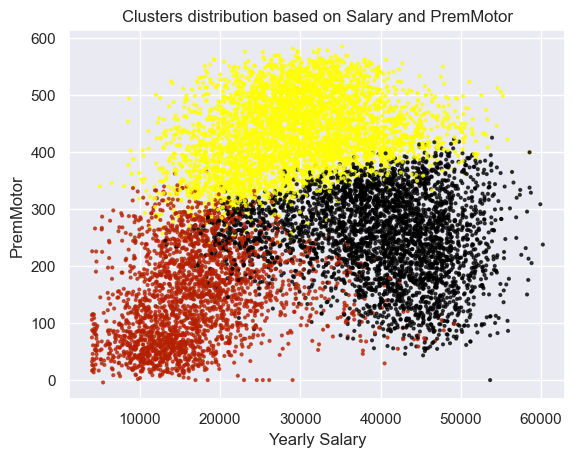

In [753]:
# Visualize the clusters distribution on PremMotor and Yearly_Salary features:
plt.scatter(final_df['Yearly_Salary'], final_df['PremMotor'], c=final_df['labels'], cmap='gnuplot', alpha = 0.7, s=4)
plt.title('Clusters distribution based on Salary and PremMotor', fontsize=12)
plt.xlabel('Yearly Salary')
plt.ylabel('PremMotor')

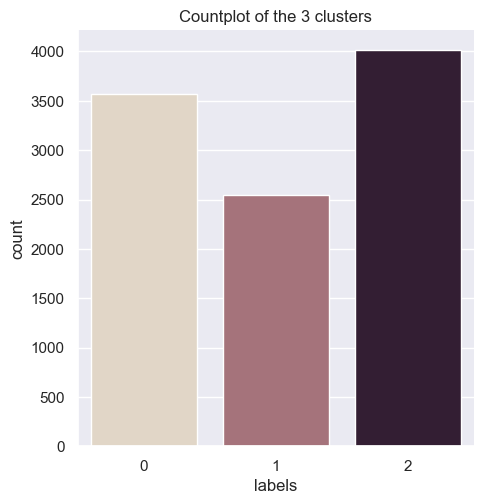

In [754]:
sns.catplot(data=final_df, x="labels", kind="count", palette="ch:.25")
plt.title('Countplot of the 3 clusters', fontsize=12)
plt.show()

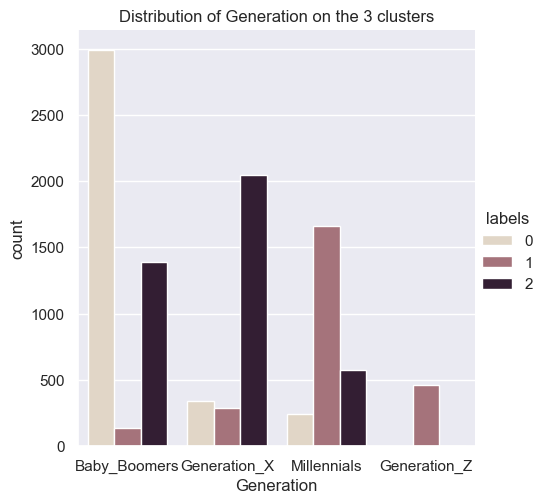

In [755]:
order=['0', '1', '2', '3']
g= sns.catplot(data=final_df, x="Generation", kind="count", hue='labels', order=order, palette="ch:.25")
g.set_xticklabels(["Baby_Boomers", "Generation_X", "Millennials", "Generation_Z"])
plt.title('Distribution of Generation on the 3 clusters', fontsize=12)
plt.show()

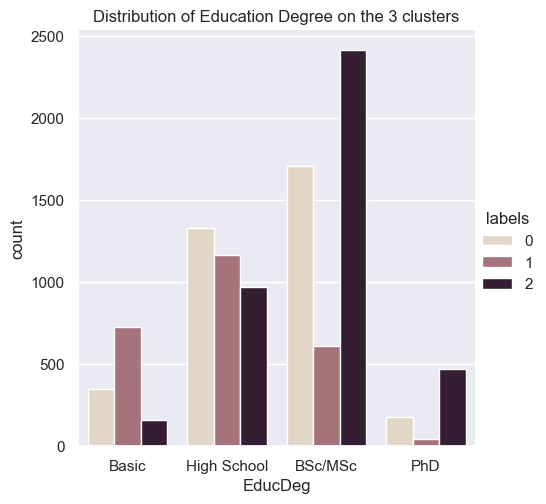

In [756]:
order=[1, 2, 3,4]
g= sns.catplot(data=final_df, x="EducDeg", kind="count", hue='labels', order=order, palette="ch:.25")
g.set_xticklabels(["Basic", "High School", "BSc/MSc","PhD"])
plt.title('Distribution of Education Degree on the 3 clusters', fontsize=12)
plt.show()

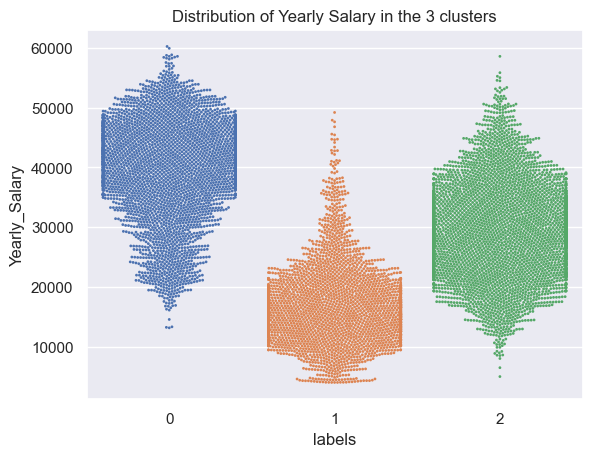

In [757]:
sns.swarmplot(data=final_df, x='labels', y='Yearly_Salary', size=2)
plt.title('Distribution of Yearly Salary in the 3 clusters', fontsize=12)
plt.show()

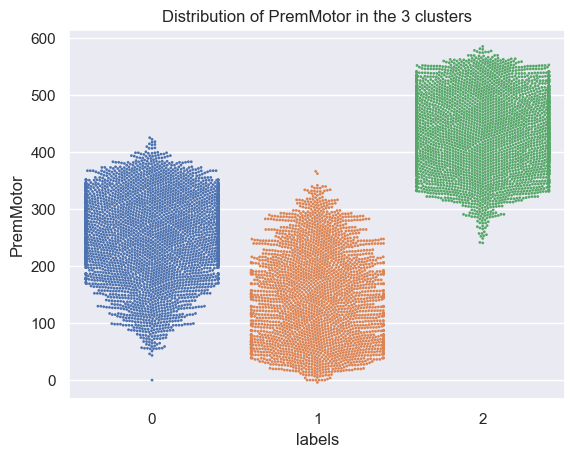

In [758]:
sns.swarmplot(data=final_df, x='labels', y='PremMotor', size=2)
plt.title('Distribution of PremMotor in the 3 clusters', fontsize=12)
plt.show()

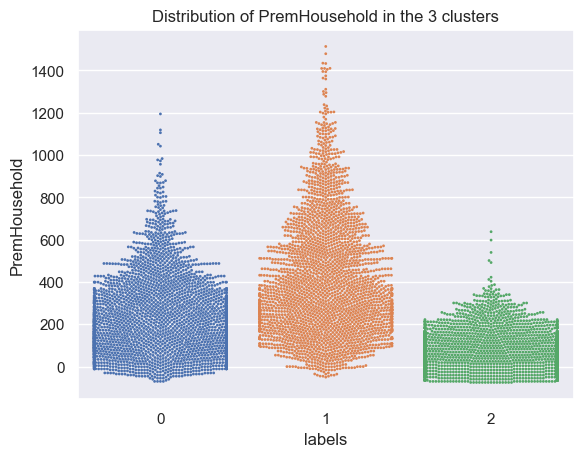

In [759]:
sns.swarmplot(data=final_df, x='labels', y='PremHousehold', size=2)
plt.title('Distribution of PremHousehold in the 3 clusters', fontsize=12)
plt.show()

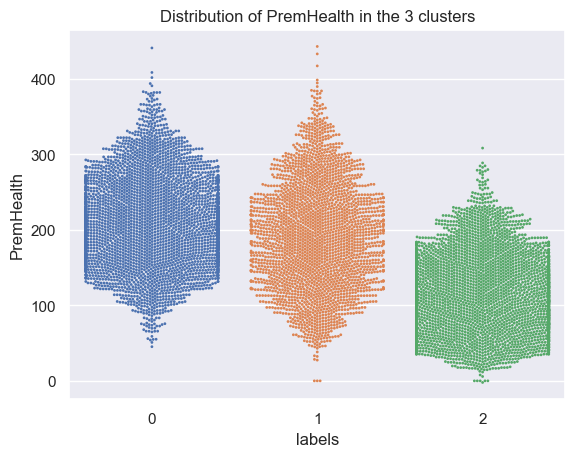

In [760]:
sns.swarmplot(data=final_df, x='labels', y='PremHealth', size=2)
plt.title('Distribution of PremHealth in the 3 clusters', fontsize=12)
plt.show()

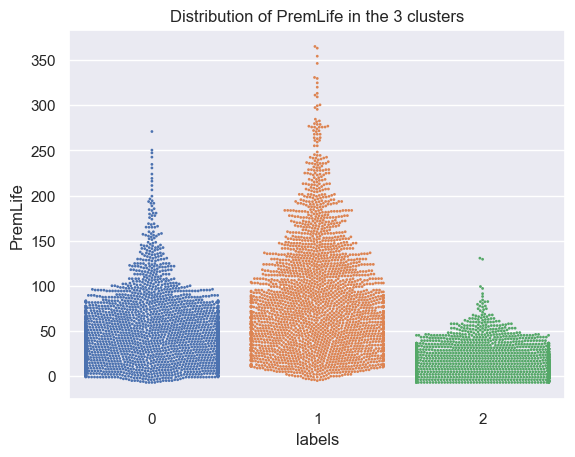

In [761]:
sns.swarmplot(data=final_df, x='labels', y='PremLife', size=2)
plt.title('Distribution of PremLife in the 3 clusters', fontsize=12)
plt.show()

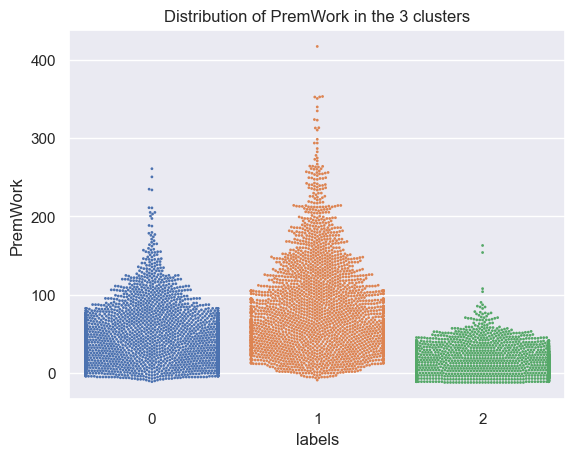

In [762]:
sns.swarmplot(data=final_df, x='labels', y='PremWork', size=2)
plt.title('Distribution of PremWork in the 3 clusters', fontsize=12)
plt.show()